# FP_Group_25_CaDoD: **Phase 3** - Cats vs Dogs Detector (CaDoD)

# Loading Dependencies

In [ ]:
!pip install torchviz # You have to run this code to get model visualization from torchviz make_dot

In [ ]:
import torch
import torch.nn as nn
from torchsummary import summary
from torchviz import make_dot
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
from PIL import Image

import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import Dataset
from torchvision.transforms.functional import adjust_gamma

from sklearn import metrics
from sklearn import decomposition
from sklearn import manifold
from tqdm.notebook import trange, tqdm
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import copy
import random
import time

In [ ]:
from collections import Counter
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from PIL import Image
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
from sklearn.metrics import accuracy_score, mean_squared_error, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
import tarfile
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings("ignore")

### Connecting and loading resized images from Google Drive

In [ ]:
# This section works only on the default Google Colab and not on Custom GCE VM or our local Jupyter Notebook
from google.colab import auth
from google.auth import default
from google.colab import drive
import gspread

'''
Authenticating against Google Sheets from the current Colab session
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''
auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)


'''
Mounting Google Drive to the current Colab session
How to Connect Google Colab with Google Drive:
https://www.marktechpost.com/2019/06/07/how-to-connect-google-colab-with-google-drive/
'''
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


32.1 Team Summary

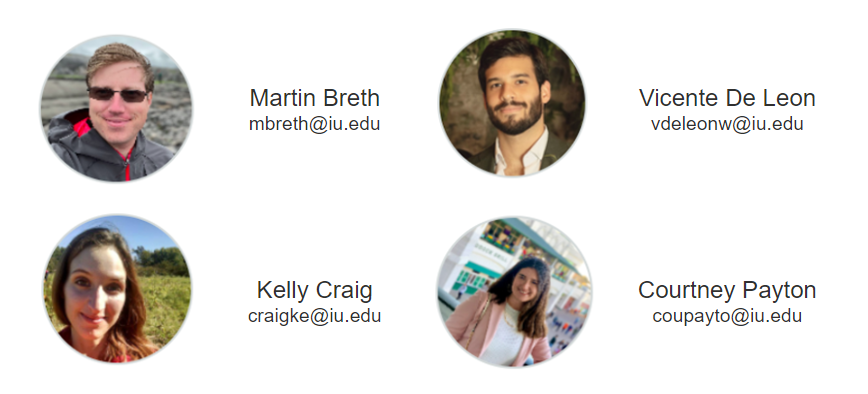

##3.1.1 Team Meeting Schedule

We meet about 4 times per week. Due to our different schedules, we are not set on any specific days but we always pick the next meeting date&time based on how many tasks need to be reviewed and our availability.

Data below is based on [TeamTable](https://docs.google.com/spreadsheets/d/11MHZQm2NzXI2MFUvdr0GnMdnetwnpjp1DTNDPRtsnTo/edit?usp=sharing) Google Sheet.

Our meetings so far:

In [ ]:
'''
Loading content from a Google Sheets file and printing out the output
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''

# sheet 1 -> Leaders
# sheet 2 -> Meeting_Schedule
# sheet 3 -> Gantt_Chart
worksheet = gc.open('TeamTable').worksheet('Meeting_Schedule')   # Load only the "Meeting_Schedule" sheet from the TeamTable file

rows = worksheet.get_all_values()       # Get the list of all rows from a specific sheet

pd.set_option('display.max_colwidth', 0)
meetings = pd.DataFrame.from_records(rows[1:], columns=[rows[0]])    # Create a Pandas dataframe based on all the rows

meetings

,DATE,TIME,TOPICS
0,2023/03/22,4:00 PM,"Introductions, logistics 1, project preferences, etc."
1,2023/03/26,6:00 PM,"Picking the type of project, logistics 2, submitting Phase 0, starting Phase 1, etc."
2,2023/03/29,4:30 PM,"Updates, organizing tasks, sharing resources, etc."
3,2023/03/31,9:00 PM,"Updates, reviewing&helping with current tasks"
4,2023/04/02,10:00 AM,"Updates, wrapping up current tasks"
5,2023/04/03,8:00 PM,"Updates, finalizing Phase 1"
6,2023/04/04,6:00 PM,"Submitting Phase 1, dividing our work on classification and regression models"
7,2023/04/08,5:00 PM,"Phase 2 status update, classification and regression models progress, creating cloud environment, starting with the report, etc."
8,2023/04/09,7:00 PM,Phase 2 status update
9,2023/04/10,5:00 PM,"Phase 2 status update, working on report, final hyperparameter tuning in the cloud, etc."


##3.1.2 Phase Leader Plan

We have decided Phase leader will be responsible for these tasks (either doing them or delegating them):

*   Scheduling Zoom meetings
*   Reminding us about meetings (Discord or Canvas notifications)
*   Running meetings
*   Ensuring we finish all critical tasks
*   Adds and updates tasks
*   Submits the Phase assignment(s)
*   Creates and submits phase presentation

Data below is based on [TeamTable](https://docs.google.com/spreadsheets/d/11MHZQm2NzXI2MFUvdr0GnMdnetwnpjp1DTNDPRtsnTo/edit?usp=sharing) Google Sheet.

In [ ]:
'''
Loading content from a Google Sheets file and printing out the output
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''

# sheet 1 -> Leaders
# sheet 2 -> Meeting_Schedule
# sheet 3 -> Gantt_Chart
worksheet = gc.open('TeamTable').worksheet('Leaders')     # Load only the "Leaders" sheet from the TeamTable file

rows = worksheet.get_all_values()       # Get the list of all rows from a specific sheet

pd.set_option('display.max_colwidth', 0)
team = pd.DataFrame.from_records(rows[1:], columns=[rows[0]])         # Create a Pandas dataframe based on all the rows

team

,LEADER,PHASE
0,Vicente De Leon,1
1,Kelly Craig,2
2,Courtney Payton,3
3,Martin Berth,4


##3.1.3 Credit/Goals

Legend:

*   Phase - Identifies which phase the task is primarily for
*   Task - Short task identifier
*   End Date - This is the Due Date for a particular task
*   Assignee - Person or persons responsible for completing or delegating particular task
*   Credit - Person or persons who were involved in a particular task
*   Description - Long task description

Data below is based on [TeamTable](https://docs.google.com/spreadsheets/d/11MHZQm2NzXI2MFUvdr0GnMdnetwnpjp1DTNDPRtsnTo/edit?usp=sharing) Google Sheet.

In [ ]:
'''
Loading content from a Google Sheets file
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''

# sheet 1 -> Leaders
# sheet 2 -> Meeting_Schedule
# sheet 3 -> Gantt_Chart
worksheet = gc.open('TeamTable').worksheet('Gantt_Chart')     # Load only the "Gantt_Chart" sheet from the TeamTable file

rows = worksheet.get_all_values()       # Get the list of all rows from a specific sheet
pd.set_option('display.max_colwidth', 0)
pd.set_option('display.max_rows', 500)

goals = pd.DataFrame.from_records(rows[6:], columns=[rows[5]])         # Create a Pandas dataframe based on all the rows

goals = goals[['PHASE', 'TASK', 'ASSIGNEE', 'CREDIT', 'DESCRIPTION']]   # Select only relevant columns
goals.columns = ['PHASE', 'TASK', 'ASSIGNEE', 'CREDIT', 'DESCRIPTION']   # Correct the columns

# Ignore columns with "Phase n" and hide Panda's index column
display(goals.loc[~goals['TASK'].isin(['Phase 0', 'Phase 1', 'Phase 2' ,'Phase 3', 'Phase 4'])].style.hide(axis="index"))

PHASE,TASK,ASSIGNEE,CREDIT,DESCRIPTION
,,,,
0,Team logistics,Vicente,"Courtney, Kelly, Martin, Vicente","We will decide on the team logistics and create them (creating a zoom room for meetings, creating Discord server for communication, creating a shared Google Drive location, selecting leaders for each week, etc.). We will individually research which project type we prefer to work on. Finally we will decide on the type of project."
0,Submitting Phase 0,Martin,"Courtney, Kelly, Martin, Vicente",We will meet and Martin will submit the Phase 0 assignment while sharing his screen.
0,Google Colab testing,Vicente,"Martin, Vicente",We will test how to use Google Colab. We will test sharing data between an instance of Google Colab notebook and shared Google Drive directory. We will research paid versions of Google Colab which include GPU for future project phases.
1,Research importing tables into Colab,Vicente,Vicente,"We will research and test inserting data for Leaders, Credit, and Goals as tables into a testing Google Colab notebook for proposal for Phase 1."
1,Test running notebooks on our systems,Martin,"Courtney, Kelly, Martin, Vicente","Since training models in paid Colab can become expensive with time, we will ensure we all can run our code both in Google Colab and locally on our workstations (this will be especially interesting with 3 different OS types and x64 and Apple M CPUs) . We will verify if the provided Docker container is suitable for running CPU/GPU intensive notebooks or if we will need to use Jupyter notebooks directly on our workstations."
1,Create goals in Google Sheets,Martin,Martin,"We will finish scoping goals in Google Doc and will move them into Google Sheets file. We will ensure they are presentable for Leaders, Credit, and Goal sections in the proposal for Phase 1."
1,Provide a baseline coding notebook (local and Colab),Courtney,Courtney,We will have a starting code for testing both local Jupyter notebook and Google Colab.
1,Baseline classification pipeline (SKLearn),Vicente,"Vicente, Courtney",We will research a baseline classification pipeline in SKLearn. We will also describe it for the proposal in Phase 1.
1,Baseline regression pipeline (SKLearn),Martin,Martin,We will research a baseline regression pipeline in SKLearn. We will also describe it for the proposal in Phase 1.


##3.1.4 Gantt Chart

This chart represents our currently planed schedule which is based on our current best estimates and likely will change.

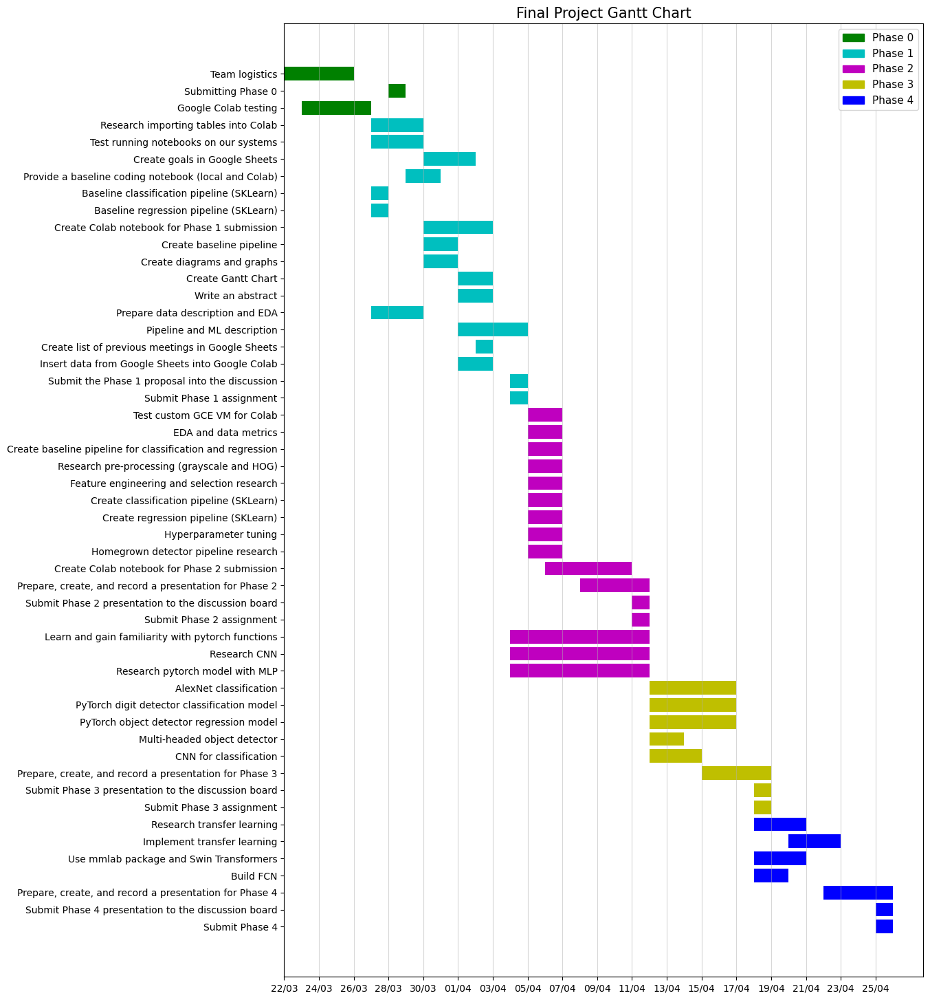

In [ ]:
# Code to create dataframe for Gantt Chart table
'''
How to get a Gantt plot using matplotlib?:
https://www.tutorialspoint.com/how-to-get-a-gantt-plot-using-matplotlib
'''

gc = gspread.authorize(creds)
worksheet = gc.open('TeamTable').worksheet('Gantt_Chart')   # Load only the "Gantt_Chart" sheet from the file
rows = worksheet.get_all_values() # get_all_values gives a list of rows

pd.set_option('display.max_colwidth', 0)
# Create dataframe
gantt = pd.DataFrame.from_records(rows[7:], columns=[rows[5]])
# Keep first 3 columns
gantt = gantt.iloc[:, 1:4]
# Give column names
gantt.columns = ['TASK','START DATE','END DATE']
# Drop Phase rows
index_num = gantt[(gantt['TASK'] == 'Phase 0')|(gantt['TASK'] == 'Phase 1')|(gantt['TASK'] == 'Phase 2')|(gantt['TASK'] == 'Phase 3')|(gantt['TASK'] == 'Phase 4')].index
gantt = gantt.drop(index_num)
# gantt

# Create a gantt chart

# convert to datetime
gantt['START DATE']= pd.to_datetime(gantt['START DATE'])
gantt['END DATE']= pd.to_datetime(gantt['END DATE'])

# Create new columns
gantt['days_to_start'] = (gantt['START DATE'] - gantt['START DATE'].min()).dt.days
gantt['days_to_end'] = (gantt['END DATE'] - gantt['START DATE'].min()).dt.days
gantt['task_duration'] = gantt['days_to_end'] - gantt['days_to_start'] + 1  # to include also the end date
gantt['Phase'] = ['Phase 0'] * 3 + ['Phase 1'] * 17 + ['Phase 2'] * 16 + ['Phase 3'] * 8 + ['Phase 4'] * 7

# Create Gantt Chart
team_colors = {'Phase 0': 'g', 'Phase 1': 'c', 'Phase 2': 'm', 'Phase 3': 'y', 'Phase 4': 'b'} # dictionary with the team names as its keys and base matplotlib colors as its values
fig, ax = plt.subplots()
fig.set_size_inches(12, 18)

for index, row in gantt.iterrows():
  plt.barh(y=row['TASK'], width=row['task_duration'], left=row['days_to_start'], color=team_colors[row['Phase']])

plt.title('Final Project Gantt Chart', fontsize=15)
plt.gca().invert_yaxis()
xticks = np.arange(0, gantt['days_to_end'].max()+2, 2) 
xticklabels = pd.date_range(start=gantt['START DATE'].min(), end=gantt['END DATE'].max()).strftime("%d/%m")

# ticks
ax.set_xticks(xticks)

ax.set_xticklabels(xticklabels[::2])
# axis
ax.xaxis.grid(True, alpha=0.5) 
# Adding a legend
patches = []
for team in team_colors:
    patches.append(matplotlib.patches.Patch(color=team_colors[team]))
ax.legend(handles=patches, labels=team_colors.keys(), fontsize=11) 
plt.show()

#3.2 Project Abstract

The goal of this project is to create optimal cat and dog image detection machine learning models using neural networks in PyTorch. Two datasets will be utilized: 12,966 cat and dog images and image bounding box data. We aim to implement similar preprocessing steps learned in previous project phases, implement increasingly complex neural networks, and experiment with different hyperparameters and optimizers to improve metrics we selected for each type of model. Specifically, we will build a multilayer perceptron (MLP) model for image classification with a cross entropy loss function. We will also create a MLP model for a regression model which will predict four coordinates of the bounding box of the object of interest. We also plan on creating a convolutional neural network (CNN) model which will predict object class and its bounding box. Lastly, we want to experiment with AlexNet and how it compares to previous models.

#3.3 Project Description

In this phase 3 of our project, we have built many models for the image detection task. Here, we will be using pytorch for image classification with a multilayer perceptron(MLP), regression also with multilayer perceptron (MLP) with four target values corresponding to our bounding box, an object oriented program(OOP) with combined loss function of mean squared error(MSE) and cross entropy (CXE), and an implementation of AlexNet classification to fit our data.
Our first model for image classification, we started by transforming and preparing the data through reshaping and image augmentation. We defined the multilayer perceptron model, Adam as the optimizer, and loss function, CXE. Finally, we evaluated loss, validation and test accuracy. 
The second model also utilizes a multilayer perceptron, but with four bounding box values. Each of the values correspond to the four corners of the bounding box size. After training our model, we will find a more accurately predicted bounding box to locate our object of interest.
The third model is a multi-headed cat-dog detector using the OOP API with a built-in convolutional neural network. This model will expand the loss function of CXE to CXE and MSE.
The final model is an application of AlexNet, with our own implementations for train and test values. AlexNet is known to be one of the most efficient models for image detection, and we wanted to explore the implementations as a stretch goal, and continue to explore this route for phase 4. 

 

**Accuracy Equation:**
$${Accuracy} = \dfrac {c}{n} $$

Notation:
\begin{align}
c &\quad \text{Number  of  correct  predictions}\\
n &\quad \text{Total number of predictions}\\
\end{align}


**MSE Equation:**
Loss function that works for multiple alogorithms including logistic regression

\begin{equation}\tag{Reference: Lab 4 Linear Regression}
MSE(\boldsymbol{\theta}) = f(\boldsymbol{\theta}) = \frac{1}{m}\sum_{i=1}^{m}\left[ \mathbf{x}_i\cdot\boldsymbol{\theta} - y_i\right]^2
\end{equation}

Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align}

**RMSE Equation**
Root mean squared error function is just the square root of the mean squared error


\begin{align}\tag{Reference: Lab 4 Linear Regression}
\text{RMSE}(\mathbf{X}, h_{\mathbf{\theta}}) 
=  \sqrt{\dfrac{1}{m} \sum\limits_{i=1}^{m}{( \mathbf{x}^{(i)}\cdot \mathbf{\theta} - y^{(i)})^2}}
\end{align}

Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align}

**MAE Equation**
\begin{align}\tag{Reference: Lab 4 Linear Regression}
\text{MAE}(\mathbf{X}, h_{\mathbf{\theta}}) = \dfrac{1}{m} \sum\limits_{i=1}^{m}{| \mathbf{x}^{(i)}\cdot \mathbf{\theta} - y^{(i)}|}
\end{align}

Notation:

\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align}

**CXE Equation:**
Cross entropy loss function
\begin{align}\tag{Reference: Lab 7 Logistic Regression}
J(\boldsymbol{\Theta}) = - \dfrac{1}{m}\sum\limits_{i=1}^{m}\sum\limits_{k=1}^{K}{y_k^{(i)}\log\left(\hat{p}_k^{(i)}\right)}
\end{align}

Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
K &\quad \text{number of classes}\\
y &\quad \text{target class}\\
\hat{p} &\quad \text{probability for classes}\\
\end{align}

**Confusion Matrix Equations**
For confusion matrices, we will be using precision and F-1 score

Notation:
\begin{align}
TP &\quad \text{True Positives in matrix}\\
TN &\quad \text{True Negatives in matrix}\\
FP &\quad \text{False Positives in matrix}\\
FN &\quad \text{False Negatives in matrix}\\
\end{align}

**Precision**

\begin{align}
\text{Precison} = \dfrac{TP}{TP+FP}
\end{align}

**F1 Score**

\begin{align}
\text{F1 Score} = 2\cdot\dfrac{Precision⋅Recall}{Precision+Recall}
\end{align}

Where:
\begin{align}
\text{Recall} = \dfrac{TP}{TP+FN}
\end{align}



##3.3.1 Data Description

The data set for this project contains 12,966 RGB images of cats and dogs with various shapes and aspect ratios. In addition, data containing image bounding box coordinates of the object are stored in a .csv file. There are 6,855 data points classified as dogs and 6,111 as cats.
The image bounding box file contains the following information:

* ImageID - the image ID	
* Source - 	How the bounding box was created. 
    * xclick - manually drawn boxes
    * activemil - enhanced method and human verified. 
* LabelName	- object class ID
* Confidence - dummy value of 1	
* XMin, XMax, YMin, YMax - coordinates of the box, in normalized image coordinates. XMin is in [0,1], where 0 is the leftmost pixel, and 1 is the rightmost pixel in the image. Y coordinates go from the top pixel (0) to the bottom pixel (1).
* IsOccluded - 1 if the object is occluded by another object in the image. 
* IsTruncated - 1 if the object is trunacated in the image. 	
* IsDepiction - 1 if the object is not a real physical instance. 
* IsInside - 1 if the picture taken from the inside of a object 
* XClick1X, XClick2X, XClick3X, XClick4X, XClick1Y, XClick2Y, XClick3Y, XClick4Y - normalized image coordinates of the four extreme points of the object that produced the box. 

##3.3.2 Exploratory data analysis (EDA)

The code below reads the dataset and loads it into memory.

In [ ]:
# Loading Variables
# These 2 lines below can be changed based on what you want to run:
dataset = 'cadod.csv'                             # cadod.csv  or cadod_experimental.csv
gdrive_directory = 'aml'           # This is your personal GDrive directly. For example in Vicente's case: MLProject

################################
# You do not need to edit these variables
colab_path = '/content/drive/MyDrive/' + gdrive_directory + '/aml'
images_path = colab_path + '/images'
# images_resized_path = images_path + '/resized'

In [ ]:
# df = pd.read_csv(colab_path + '/' + dataset)
df = pd.read_csv(colab_path + '/' + dataset)

In [ ]:
# Image Bounding Box File

In [ ]:
# List the first 5, last 5, and random 5 rows from the Bounding Box File. This gives us a quick overview of the data.
display(df.head())
print()
display(df.tail())
print()
display(df.sample(n=5))

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,...,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
0,0000b9fcba019d36,xclick,/m/0bt9lr,1,0.165000,0.903750,0.268333,0.998333,1,1,...,0,0,0.636250,0.903750,0.748750,0.165000,0.268333,0.506667,0.998333,0.661667
1,0000cb13febe0138,xclick,/m/0bt9lr,1,0.000000,0.651875,0.000000,0.999062,1,1,...,0,0,0.312500,0.000000,0.317500,0.651875,0.000000,0.410882,0.999062,0.999062
2,0005a9520eb22c19,xclick,/m/0bt9lr,1,0.094167,0.611667,0.055626,0.998736,1,1,...,0,0,0.487500,0.611667,0.243333,0.094167,0.055626,0.226296,0.998736,0.305942
3,0006303f02219b07,xclick,/m/0bt9lr,1,0.000000,0.999219,0.000000,0.998824,1,1,...,0,0,0.508594,0.999219,0.000000,0.478906,0.000000,0.375294,0.720000,0.998824
4,00064d23bf997652,xclick,/m/0bt9lr,1,0.240938,0.906183,0.000000,0.694286,0,0,...,0,0,0.678038,0.906183,0.240938,0.522388,0.000000,0.370000,0.424286,0.694286


,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,...,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
12961,ffc65ce637cbd73d,xclick,/m/01yrx,1,0.135000,0.844375,0.000000,0.999167,0,1,...,0,0,0.176875,0.135000,0.450625,0.844375,0.000000,0.685000,0.999167,0.995000
12962,ffd1e6a91d92bf83,xclick,/m/01yrx,1,0.000625,0.999375,0.005000,0.825000,1,1,...,0,0,0.220625,0.125000,0.000625,0.999375,0.825000,0.005000,0.261667,0.303333
12963,ffe91ea1debeefb3,xclick,/m/01yrx,1,0.001475,0.988201,0.042406,0.624260,1,1,...,0,0,0.473451,0.001475,0.019174,0.988201,0.042406,0.327416,0.624260,0.358974
12964,ffebb214b9df34aa,xclick,/m/01yrx,1,0.000000,0.998125,0.037523,0.999062,0,1,...,0,0,0.000000,0.399375,0.998125,0.581250,0.676360,0.037523,0.560976,0.999062
12965,fffcbea446a0b7b9,xclick,/m/01yrx,1,0.148045,0.999069,0.070640,0.947020,0,1,...,0,0,0.558659,0.148045,0.808194,0.999069,0.070640,0.370861,0.947020,0.835541


,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,...,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
4337,9d22da1e9caa418e,xclick,/m/0bt9lr,1,0.000000,0.893750,0.000000,0.999163,0,1,...,0,0,0.120625,0.000000,0.893750,0.561875,0.000000,0.184937,0.897908,0.999163
5185,bc9770bf4c2d4121,xclick,/m/0bt9lr,1,0.001250,0.915625,0.000000,0.868333,0,1,...,0,0,0.290625,0.001250,0.860625,0.915625,0.000000,0.527500,0.868333,0.746667
6979,0122ed068d6d0d40,xclick,/m/01yrx,1,0.181250,0.880625,0.067500,0.902500,0,0,...,0,0,0.307500,0.880625,0.181250,0.367500,0.067500,0.504167,0.395000,0.902500
12797,f7e71b714f18a026,xclick,/m/01yrx,1,0.317647,0.998824,0.000000,0.998230,0,1,...,0,0,0.748235,0.998824,0.830588,0.317647,0.000000,0.495575,0.998230,0.631858
11892,ce6ee11659b2f914,xclick,/m/01yrx,1,0.181250,0.940625,0.060417,0.997917,1,1,...,0,0,0.206250,0.181250,0.496875,0.940625,0.060417,0.600000,0.997917,0.668750


In [ ]:
# Descriptive statistics
df.describe()

,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
count,12966.0,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000
mean,1.0,0.099437,0.901750,0.088877,0.945022,0.464754,0.738470,0.013651,0.045427,0.001157,0.390356,0.424582,0.494143,0.506689,0.275434,0.447448,0.641749,0.582910
std,0.0,0.113023,0.111468,0.097345,0.081500,0.499239,0.440011,0.118019,0.209354,0.040229,0.358313,0.441751,0.405033,0.462281,0.415511,0.401580,0.448054,0.403454
min,1.0,0.000000,0.408125,0.000000,0.451389,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,1.0,0.000000,0.830625,0.000000,0.910000,0.000000,0.000000,0.000000,0.000000,0.000000,0.221292,0.096875,0.285071,0.130000,0.024323,0.218333,0.405816,0.400000
50%,1.0,0.061250,0.941682,0.059695,0.996875,0.000000,1.000000,0.000000,0.000000,0.000000,0.435625,0.415625,0.531919,0.623437,0.146319,0.480838,0.825000,0.646667
75%,1.0,0.167500,0.998889,0.144853,0.999062,1.000000,1.000000,0.000000,0.000000,0.000000,0.609995,0.820000,0.787500,0.917529,0.561323,0.729069,0.998042,0.882500
max,1.0,0.592500,1.000000,0.587088,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.999375,0.999375,1.000000,0.999375,0.999375,0.999375,1.000000,0.999375


In [ ]:
# Print a concise summary of the bounding box file. 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12966 entries, 0 to 12965
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ImageID      12966 non-null  object 
 1   Source       12966 non-null  object 
 2   LabelName    12966 non-null  object 
 3   Confidence   12966 non-null  int64  
 4   XMin         12966 non-null  float64
 5   XMax         12966 non-null  float64
 6   YMin         12966 non-null  float64
 7   YMax         12966 non-null  float64
 8   IsOccluded   12966 non-null  int64  
 9   IsTruncated  12966 non-null  int64  
 10  IsGroupOf    12966 non-null  int64  
 11  IsDepiction  12966 non-null  int64  
 12  IsInside     12966 non-null  int64  
 13  XClick1X     12966 non-null  float64
 14  XClick2X     12966 non-null  float64
 15  XClick3X     12966 non-null  float64
 16  XClick4X     12966 non-null  float64
 17  XClick1Y     12966 non-null  float64
 18  XClick2Y     12966 non-null  float64
 19  XCli

In [ ]:
# Check for any NA values
df.isnull().sum()

ImageID        0
Source         0
LabelName      0
Confidence     0
XMin           0
XMax           0
YMin           0
YMax           0
IsOccluded     0
IsTruncated    0
IsGroupOf      0
IsDepiction    0
IsInside       0
XClick1X       0
XClick2X       0
XClick3X       0
XClick4X       0
XClick1Y       0
XClick2Y       0
XClick3Y       0
XClick4Y       0
dtype: int64

In [ ]:
# Check data type of each column
df.dtypes

ImageID        object 
Source         object 
LabelName      object 
Confidence     int64  
XMin           float64
XMax           float64
YMin           float64
YMax           float64
IsOccluded     int64  
IsTruncated    int64  
IsGroupOf      int64  
IsDepiction    int64  
IsInside       int64  
XClick1X       float64
XClick2X       float64
XClick3X       float64
XClick4X       float64
XClick1Y       float64
XClick2Y       float64
XClick3Y       float64
XClick4Y       float64
dtype: object

In [ ]:
# List how much memory each column uses in bytes.
# This could be useful if we were working with truly large data sets and memory would be a constrain.
df.memory_usage()

Index          128   
ImageID        103728
Source         103728
LabelName      103728
Confidence     103728
XMin           103728
XMax           103728
YMin           103728
YMax           103728
IsOccluded     103728
IsTruncated    103728
IsGroupOf      103728
IsDepiction    103728
IsInside       103728
XClick1X       103728
XClick2X       103728
XClick3X       103728
XClick4X       103728
XClick1Y       103728
XClick2Y       103728
XClick3Y       103728
XClick4Y       103728
dtype: int64

In [ ]:
# List counts of unique values in each column. This is useful for determining if the variable is categorical.
df.nunique()

ImageID        12966
Source         2    
LabelName      2    
Confidence     1    
XMin           3109 
XMax           3499 
YMin           4822 
YMax           4219 
IsOccluded     3    
IsTruncated    3    
IsGroupOf      3    
IsDepiction    3    
IsInside       3    
XClick1X       5135 
XClick2X       4763 
XClick3X       5074 
XClick4X       4659 
XClick1Y       6351 
XClick2Y       7314 
XClick3Y       6252 
XClick4Y       7180 
dtype: int64

In [ ]:
# Get the rows and columns of the bounding box data file.
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns")

There are 12966 rows and 21 columns


In [ ]:
# Number of dog vs cat labels.
# The counts of cats and dogs was close enough that we concluded not to do any sample balancing.
df.LabelName.replace({'/m/01yrx':'cat', '/m/0bt9lr':'dog'}, inplace=True)
df.LabelName.value_counts()

dog    6855
cat    6111
Name: LabelName, dtype: int64

##  3.3.3 Image Class Count comparisions

This is a bar plot of the image class count for dogs and cats. There are 6,855 dog images and 6,111 cat images. 

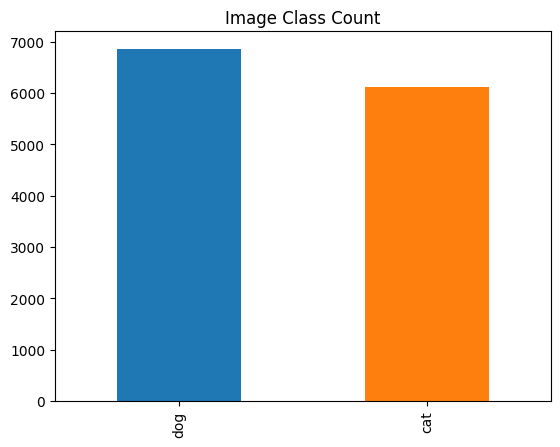

In [ ]:
# Plot the image count of dogs vs cats.
# The counts of cats and dogs was close enough that we concluded not to do any sample balancing.
df.LabelName.value_counts().plot(kind='bar', color=['tab:blue', 'tab:orange'])
plt.title('Image Class Count')
plt.show()

This is a plot of counts of objects being occluded, truncated, group of, and depiction between each class. This can help answer if a specific object happens to be more occluded, truncated, etc.

The count of occluded dog images is marginally higher than cat images. This is a topic we could purse in future project phases.
Graphs depicting truncation, grouping, depiction were close enough we did not see an issue for our analysis.

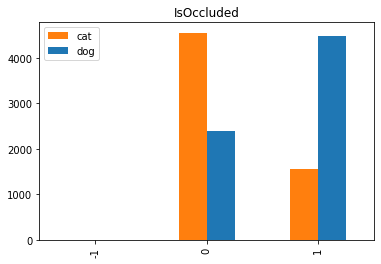

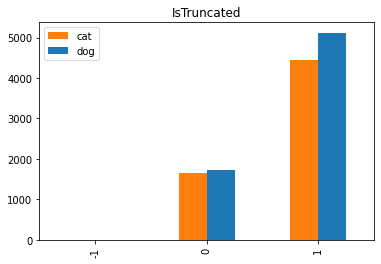

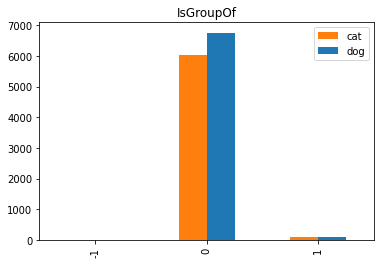

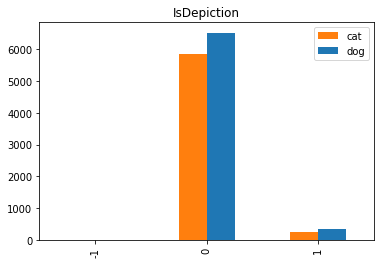

In [ ]:
labels = ['IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction']

for label in labels:

  data = pd.DataFrame(df[label].loc[df['LabelName'] == 'cat'].value_counts().to_frame(name='cat'))
  data['dog'] = df[label].loc[df['LabelName'] == 'dog'].value_counts().to_frame()
  data.fillna(0).sort_index().plot.bar(title=label, color=['tab:orange', 'tab:blue'])

In [ ]:
# Plot comparision of the bounding box areas between each class

This is a histogram of the bounding box coordinates. This shows that most of the clicks start at the edge of the image, which could mean the image or object is cropped. Ideally, the object would be somewhere in the middle.

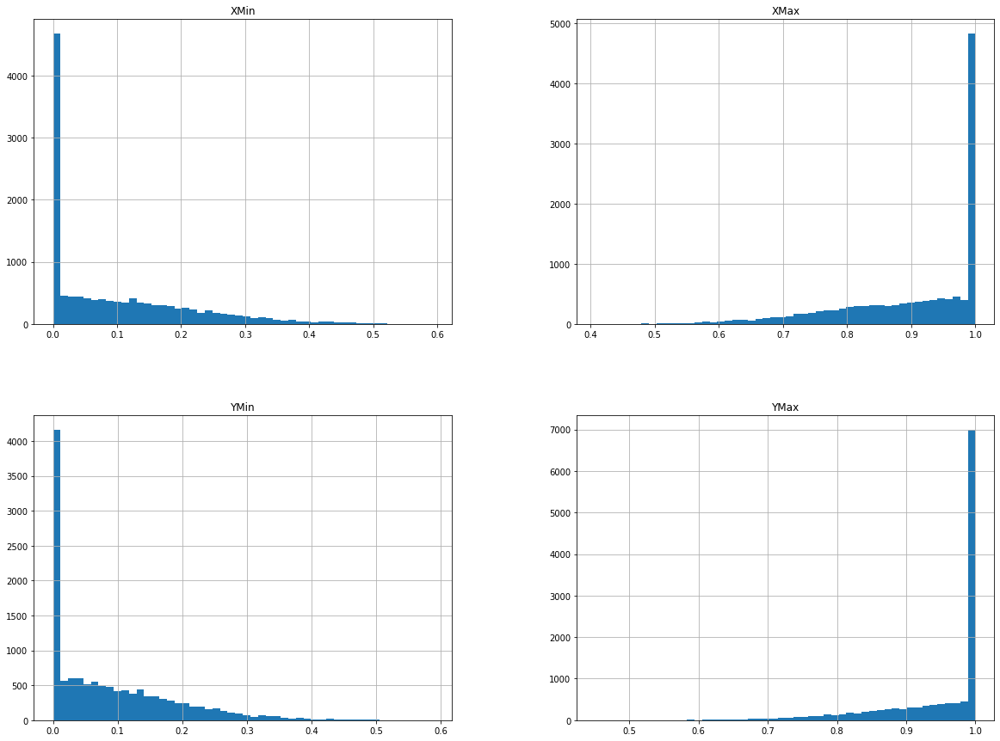

In [ ]:
df[['XMin', 'XMax', 'YMin', 'YMax']].hist(bins=50, figsize=(20,15))
plt.show()

## 3.3.4 Correlation Matrix for the bounding box data
This is the correlation matrix with the range from +1 to -1 where +1 is highly and positively correlated and -1 will be highly negatively correlated.
XClick1X, XClick2X, XClick3X, XClick4X, XClick1Y, XClick2Y, XClick3Y, and XClick4Y columns are correlated. 


<ipython-input-25-0c1984e3d8f1>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()
<ipython-input-25-0c1984e3d8f1>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr())


<Axes: >

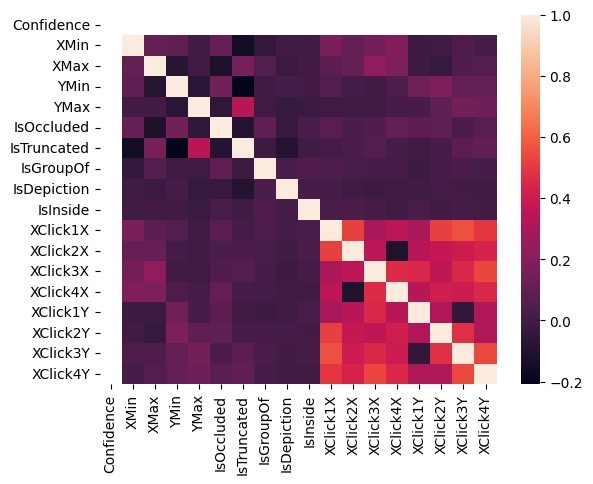

In [ ]:
# Create correlation matrix of the bounding box image data.
df.corr()
sns.heatmap(df.corr())

In [ ]:
# Installing ydata_profiling library since Colab does not have it by default
!pip install ydata_profiling

from ydata_profiling import ProfileReport

## 3.3.5 Profile report of the bounding box data.
The profile report consist of the following:

1) **Overview:** provides statistical information about the dataset.

2) **Variables:** detailed statistics of each of the columns and a histogram of the data distribution.

3) **Interactions:** interactive plot to compare interactions between two varaibles.

4) **Correlations:** heat map of correlation between variables.

5) **Missing values:** bar graph of the count of missing values for each variable. 

6) **Sample:** displays for 10 rows and last 10 rows of data set. 


In [ ]:
#Create Profile Report

profile = ProfileReport(df, title="Cat and Dogs Dataset", explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##  3.3.6 Showing examples of images

In [ ]:
# Get image counts for cats and dogs
print(f"There are a total of {len(glob.glob1(images_path, '*.jpg'))} cat and dog images")

There are a total of 12966 cat and dog images


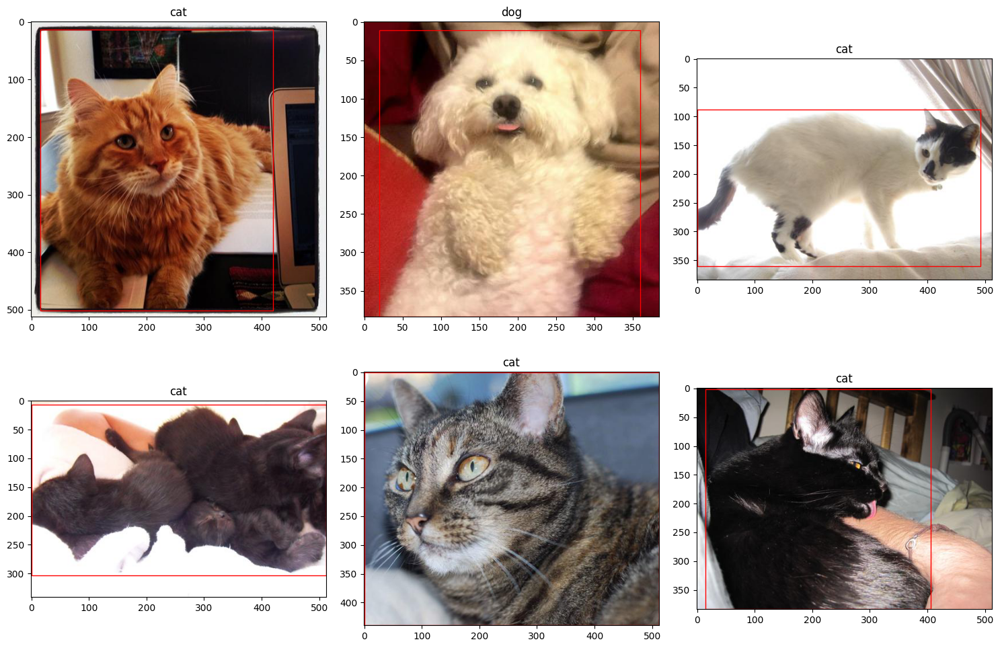

In [ ]:
# plot random 6 images
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(df.shape[0], size=6, replace=False)):
    img = mpimg.imread(images_path + "/" + df.ImageID.values[j] + '.jpg')
    h, w = img.shape[:2]
    coords = df.iloc[j,4:8]
    ax[i].imshow(img)
    ax[i].set_title(df.LabelName[j])
    ax[i].add_patch(plt.Rectangle((coords[0]*w, coords[2]*h), 
                                  coords[1]*w-coords[0]*w, coords[3]*h-coords[2]*h, 
                                  edgecolor='red', facecolor='none'))

plt.tight_layout()
plt.show()

##  3.3.7 Showing examples of outlier images

Below are images which are in some way outlier: blurry, cartoon, occluded, too dark, too bright, partial object, flipped.

Some of these outlier examples are addressed via our augmentation library during preprocessing.

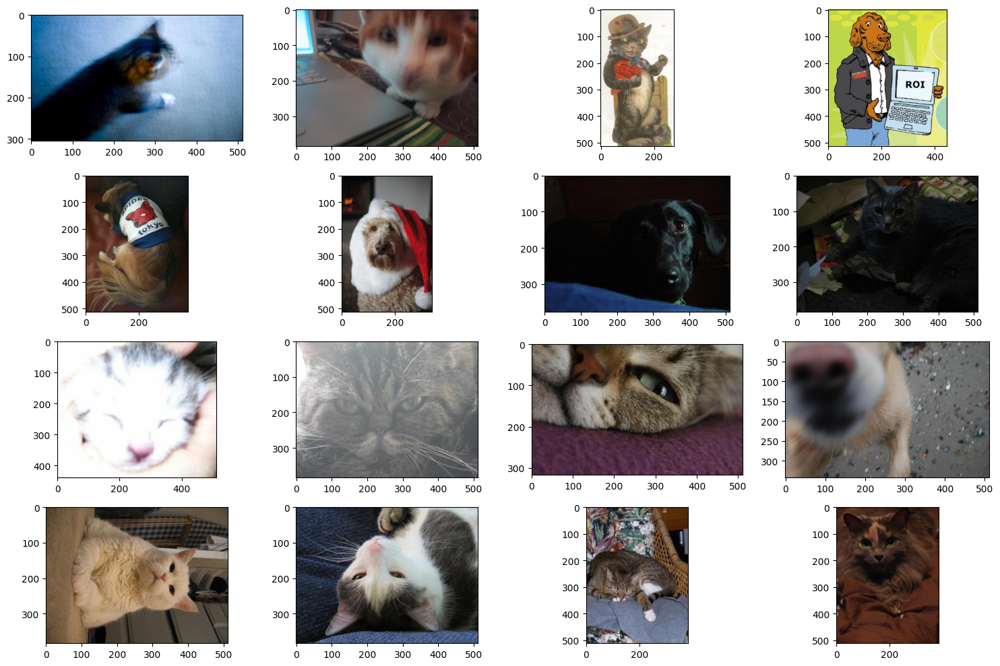

In [ ]:
blurry = ['e27ad5d58d77bc85.jpg', '8e14f38acd47a09e.jpg']
cartoon = ['b8b0fad7a9eadc36.jpg', 'bedd2b75d3b488a5.jpg']
occluded = ['c83ba2e96cc0be03.jpg', '262b39e80c5c4e54.jpg']
dark = ['c874ebff7fe303ea.jpg', 'cc6d3007c1075e8b.jpg']
bright = ['b86fa94eda8a4614.jpg', '82c8a46e8e075bc8.jpg']
partial = ['b5e220f05ab2cbf6.jpg','b8fc8f56ec2b8e60.jpg']
flipped = ['ca820b7abd683d22.jpg', 'e256b36ed438c41e.jpg']
busy_background = ['e0b29943e1c54b65.jpg','d728520f0c093553.jpg']

extreme_pictures = blurry + cartoon + occluded + dark + bright + partial + flipped + busy_background

fig, ax = plt.subplots(nrows=4, ncols=4, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(extreme_pictures):
    img = mpimg.imread(images_path + '/' + j)
    ax[i].imshow(img)

plt.tight_layout()
plt.show()

In [ ]:
# Go through all images and record the shape of the image in pixels and the memory size
img_shape = []
img_size = np.zeros((df.shape[0], 1))

for i,f in enumerate(tqdm(df['ImageID'])):
    file = images_path + '/' + f + '.jpg'
    img = Image.open(file)
    img_shape.append(f"{img.size[0]}x{img.size[1]}")
    img_size[i] += os.path.getsize(file)

  0%|          | 0/12966 [00:00<?, ?it/s]

In [ ]:
#Count all the different image shapes
img_shape_count = Counter(img_shape)
# create a dataframe for image shapes
img_df = pd.DataFrame(set(img_shape_count.items()), columns=['img_shape','img_count'])

In [ ]:
#There are a ton of different image shapes. Let's narrow this down by getting a 
#sum of any image shape that has a cout less than 100 and put that in a category called other
img_df = img_df.append({'img_shape': 'other','img_count': img_df[img_df.img_count < 100].img_count.sum()}, 
                       ignore_index=True)
#Drop all image shapes
img_df = img_df[img_df.img_count >= 100]
#Check if the count sum matches the number of images
img_df.img_count.sum() == df.shape[0]

<ipython-input-18-cad1beb13529>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  img_df = img_df.append({'img_shape': 'other','img_count': img_df[img_df.img_count < 100].img_count.sum()},


True

##  3.3.8 Bar Graph of Image Shape Counts

This is a bar plot of the all the image shape counts. The "other" category includes all of the image shapes that have a count of less than 100. 512x384 is the image size that occurs the most.  

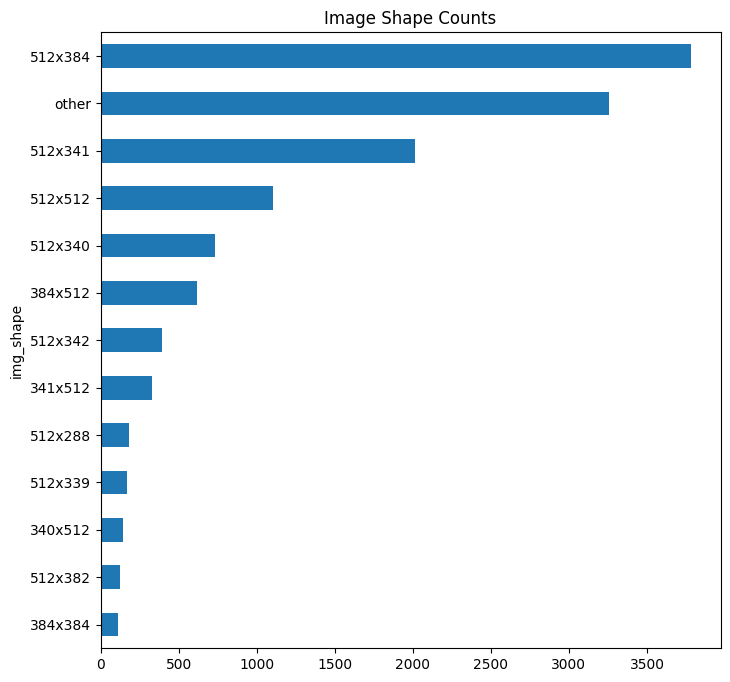

In [ ]:
#Plot image shape counts
img_df.sort_values('img_count', inplace=True)
img_df.plot(x='img_shape', y='img_count', kind='barh', figsize=(8,8), legend=False)
plt.title('Image Shape Counts')
plt.show()

In [ ]:
# convert to megabytes
img_size = img_size / 1000

##  3.3.9 Plots of Image Size Distribution

This is a histogram and box plot of image size (MB).  

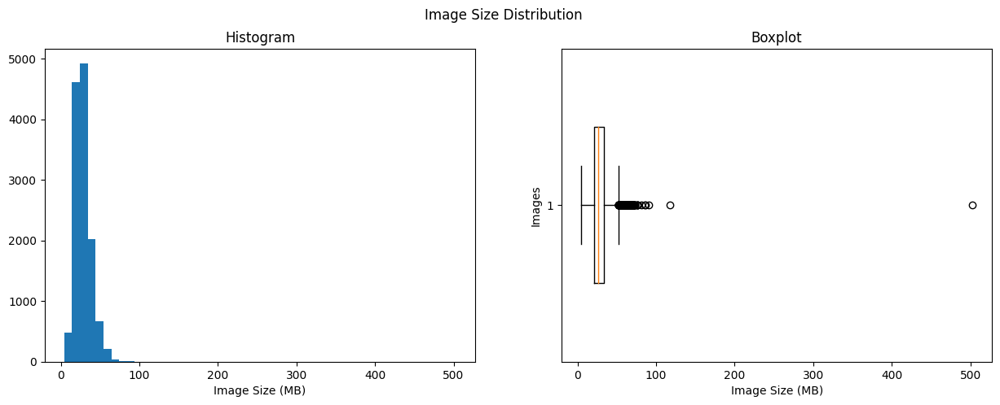

In [ ]:
# Plot image size distribution
fig, ax = plt.subplots(1, 2, figsize=(15,5))
fig.suptitle('Image Size Distribution')
ax[0].hist(img_size, bins=50)
ax[0].set_title('Histogram')
ax[0].set_xlabel('Image Size (MB)')
ax[1].boxplot(img_size, vert=False, widths=0.5)
ax[1].set_title('Boxplot')
ax[1].set_xlabel('Image Size (MB)')
ax[1].set_ylabel('Images')
plt.show()

#3.4 Loading data

In [ ]:
colab_path = '/content/drive/MyDrive/MLProject/aml/data/martin'

X = np.load(colab_path + '/img.npy', allow_pickle=True)
y_label = np.load(colab_path + '/y_label.npy', allow_pickle=True)
y_bbox = np.load(colab_path + '/y_bbox.npy', allow_pickle=True)

#3.5 Preprocessing data

If the preprocessing steps are the same for everything, we can move them into this section.

#3.6 PyTorch MLP Classifier Cats and Dogs

To create this MLP Classifier the following mainly sources were used:
- Phase 2 work
- HW 11
- Pytorch documentation
- Google Colab Notebook
- Medium/Towards Data Science
- Geeks for Geeks

Important: This is meant to be a very basic MLP model for image classificaion. It was built using a combination of online resources + homework.

In [ ]:
#colab_path = '/content/drive/MyDrive/MLProject/aml/data/martin'

#X = np.load(colab_path + '/img.npy', allow_pickle=True)
#y_label = np.load(colab_path + '/y_label.npy', allow_pickle=True)
#y_bbox = np.load(colab_path + '/y_bbox.npy', allow_pickle=True)

In [ ]:
X_train, X_test, y_train, y_test_label = train_test_split(X, y_label, test_size=0.2, random_state=42, shuffle=True)

In [ ]:
# Validation
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42, shuffle=True)

In [ ]:
X_train.shape # lets explore the shape of X_train

(8297, 49152)

In [ ]:
X_test.shape # lets explore the shape of X_test

(2594, 49152)

##3.6.1 Transforming and preparing data

Scaling will not be used. This is beacuase scaling our data was affeecting important components like results, producing cases of overfitting, and changing hoy predicted images were being displayed.

Also, to use Scaling we will have to change notebook settings are switch HIGH-RAM for it to properly work.

**Scaling - You need to switch to HIGH-RAM for the Scaling step to work**

In [ ]:
'''
Do not run. Scaling will not be used.
'''
#scaler = StandardScaler()
#X_train = scaler.fit_transform(X_train)
#X_valid = scaler.transform(X_valid) #Transform validation set with the same constants
#X_test = scaler.transform(X_test) #Transform test set with the same constants

##3.6.2 Reshaping

In [ ]:
'''
Just as Phase 2, we reshape our data
'''
X_train = X_train.reshape((-1, 128, 128, 3))
X_valid = X_valid.reshape((-1, 128, 128, 3))
X_test = X_test.reshape((-1, 128, 128, 3))

##3.6.3 PyTorch Transform
Our initial ideas was to try and performed what was done in Phase 2 with the Data Augmentation and Feature Exctraction. So we had the idea to to try and implement the following transform. As you can see, we had many PyTorch transforms functions.
Many were taken from Geeks for Geeks, Medium, PyTorch documenation. Resources shown below:

In [ ]:
'''
Do not run, we are using transform_gray.

Sources:
https://pytorch.org/vision/stable/transforms.html
https://www.geeksforgeeks.org/how-to-convert-an-image-to-grayscale-in-pytorch/
https://www.geeksforgeeks.org/how-to-rotate-an-image-by-an-angle-using-pytorch-in-python/
https://www.geeksforgeeks.org/python-pytorch-randomhorizontalflip-function/
https://medium.com/mlearning-ai/understanding-torchvision-functionalities-for-pytorch-part-2-transforms-886b60d5c23a
'''

#transform = transforms.Compose([
    #transforms.CenterCrop(100), # Crop images to center
    #transforms.RandomHorizontalFlip(p=0.5), # Probability range 0 to 1
    #transforms.RandomRotation(degrees=(60, 90)),
    #transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5),
    #transforms.RandomPerspective(distortion_scale=0.7,p=1, interpolation=2, fill=0),
    #transforms.Grayscale(), # channel graysclae kind of similar to HOG stuff num_output_channels=1
    #transforms.ToTensor(),
    #transforms.Normalize(mean=[0.00, 0.45, 0.40], std=[0.23, 0.22, 0.23]) 
#])

Since we are going to build a simple model lets go with the basics. After performing classification using the bove transforms, we concluded that transform_gray is a better choice overall. This is because the data augmentation provided in transform_gray gives better results.

In [ ]:
# For the class AdjustGamma
# https://pytorch.org/vision/stable/transforms.html#torchvision.transforms.functional.adjust_gamma

class AdjustGamma(object):
    def __init__(self, gamma):
        self.gamma = gamma

    def __call__(self, img):
        return adjust_gamma(img, gamma=self.gamma)


transform_gray = transforms.Compose([
    transforms.Resize((100, 100)), # has to mach input dimension for MLP Model. 100x100 for grayscale
    transforms.RandomHorizontalFlip(p=0.5), # Probability range 0 to 1
    transforms.RandomRotation(degrees=(60, 90)),
    transforms.Grayscale(num_output_channels=1), # convert to grayscale
    AdjustGamma(gamma=0.5),
    transforms.ToTensor()
])

After numerous attempts we figured out the above torchvision.transform works with PIL images. Our X_train etc are numpy arrays, reason for the numerous error while trying to build the classifier. Just like Phase 2, we will have to work with lists. We convert arrays into images and store data in lists. See sources below:

In [ ]:
# pil_image = Image.fromarray()
# https://pillow.readthedocs.io/en/stable/reference/Image.html
# https://sparrow.dev/torchvision-transforms/
# https://discuss.pytorch.org/t/convert-float-image-array-to-int-in-pil-via-image-fromarray/82167

X_train_transformed = []
for image in X_train:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_train_transformed.append(transformed_image)

X_valid_transformed = []
for image in X_valid:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_valid_transformed.append(transformed_image)

X_test_transformed = []
for image in X_test:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_test_transformed.append(transformed_image)

In [ ]:
X_train_transformed[1].shape # channel(1), 100x100 pixels -> grayscale

torch.Size([1, 100, 100])

In [ ]:
# Convert the rest of the arrays into Tensors just like in HW 11
y_train_tensor = torch.from_numpy(y_train)
y_valid_tensor = torch.from_numpy(y_valid)
y_test_tensor = torch.from_numpy(y_test_label)

Is our dataset a PyTorch data set?

In [ ]:
# Source: https://pytorch.org/tutorials/beginner/basics/data_tutorial.html
# Source idea: https://www.w3schools.com/python/ref_func_isinstance.asp

def pytorch_dataset(data):
  return isinstance(data, Dataset)

In [ ]:
if pytorch_dataset(X_train_transformed):
    print('dataset is a PyTorch dataset.')
else:
    print('dataset is not a PyTorch dataset.')

dataset is not a PyTorch dataset.


##3.6.4 Datasets and Dataloaders

class PyTorchDataset(Dataset) is used to transform data into Pytorch dataset.
Source: https://pytorch.org/tutorials/beginner/basics/data_tutorial.html

We are using PyTorch Dataset because we are trying to build the classifier based on the information,
given from HW 11 Sklearn train_test_split. When we call pytorch_dataset(X_train_transformed) we see it;s not a PyTorch Dataset.
So we build a Pytorch Dataset out of our information.

In [ ]:
class PyTorchDataset(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x = self.X[idx]
        y = self.y[idx]

        if self.transform:
            x = self.transform(x)

        return x, y

In [ ]:
cadod_train = PyTorchDataset(X_train_transformed, y_train_tensor)
cadod_valid = PyTorchDataset(X_valid_transformed, y_valid_tensor)
cadod_test = PyTorchDataset(X_test_transformed, y_test_tensor)

In [ ]:
if pytorch_dataset(cadod_train):
    print('dataset is a PyTorch dataset.')
else:
    print('dataset is not a PyTorch dataset.')

dataset is a PyTorch dataset.


In [ ]:
train_batch_size = 96 # HW 11
valid_test_batch_size = 16 # HW 11 

trainloader_cadod = torch.utils.data.DataLoader(cadod_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_cadod = torch.utils.data.DataLoader(cadod_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_cadod = torch.utils.data.DataLoader(cadod_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)

#3.7 Multilayer Perceptron(MLP) - Classification

Source: https://colab.research.google.com/drive/1vVyUUN0HN1l-KMXHSlkNK7PGgzEeDkZn#scrollTo=jRqKe4PNognL

Source: https://pytorch.org/docs/stable/generated/torch.nn.ReLU.html

Source: https://www.educba.com/pytorch-relu/

Source: https://www.projectpro.io/article/exploring-mnist-dataset-using-pytorch-to-train-an-mlp/408


The idea behind the class MLP(nn.Module) was mainly taken from Google Colab Notebook "Multilayer_Perceptron" including training, validation, testing, as well as prediction function. Layer numbers 350 and 150 were chosen randomly. Trying to apply what was learned in HW 11, no special rules rgarding number layers. It contains 3 fully connected linear layers "nn.Linear()". Every element in one layer is connected to every element (neurons) in the next. It is really interesting how the notebook states that the model mimics how the human brain is made of millions interconnected nodes (neurons).

*"Each connection between a neuron in one layer and a neuron in the next has a weight associated with it. The input to one neuron is the sum of the weighted values of all neurons in the previous layer connected to it, plus a weighted bias term, where the bias value is always 1."*

Model distribution:

- self.input_fc: Input layer -> calculatesnthe weighted sum of the inputs, and then apply ReLU activation function elementwise.
- self.hidden_fc: Hidden layer -> It passes to this layer and it also goes through ReLU
- self.output_fc: Output layer -> Not only the output is returned, but also the seccond hidden layer.

Relu activation function is a class in PyTorch that helps to convert linear function to non-linear. It also converts complex data into simple functions so that it can be solved easily.

$$ReLU(x) = (x)^+ = \max(0, x)$$


ReLUs main advantage is that it does not activate all the neurons at the same time thus making it more computationally efficient than Tanh or Sigmoid (do not use this one).


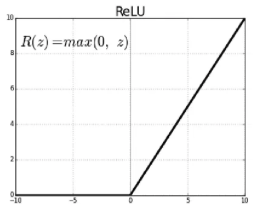

In [ ]:
'''
https://colab.research.google.com/drive/1vVyUUN0HN1l-KMXHSlkNK7PGgzEeDkZn#scrollTo=jRqKe4PNognL

'''
# relu(rectified linear unit)

class MLP(nn.Module):
    def __init__(self, input_dim, output_dim): # layers with input dimensins and output dimensions
        super().__init__() # to initialize

        self.input_fc = nn.Linear(input_dim, 350)
        self.hidden_fc = nn.Linear(350, 150)
        self.output_fc = nn.Linear(150, output_dim)

    def forward(self, x):
        batch_size = x.shape[0] # x = [batch size, height, width]
        x = x.view(batch_size, -1) # x = [batch size, height * width]
        h_1 = F.relu(self.input_fc(x)) # h_1 = [batch size, 350]
        h_2 = F.relu(self.hidden_fc(h_1))  # h_2 = [batch size, 150]
        y_pred = self.output_fc(h_2) # y_pred = [batch size, output dim]
        return y_pred, h_2

In [ ]:
# Lets set up our device to call the model
# https://www.geeksforgeeks.org/how-to-set-up-and-run-cuda-operations-in-pytorch/

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
print(device)

cpu


Model is going to be running on cpu not cuda.

Let's explore our MLP classification model using print(model), summary(model), and make_dot from "pytorchviz".

In [ ]:
INPUT_DIM = 1*100*100 # Input size 1 channel for grayscale channel and 100x100 based on grayscale pixels
OUTPUT_DIM = 2 # cats and dogs

model = MLP(INPUT_DIM, OUTPUT_DIM).to(device)

In [ ]:
print(model)

MLP(
  (input_fc): Linear(in_features=10000, out_features=350, bias=True)
  (hidden_fc): Linear(in_features=350, out_features=150, bias=True)
  (output_fc): Linear(in_features=150, out_features=2, bias=True)
)


In [ ]:
summary(model, (1, 100, 100))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 350]       3,500,350
            Linear-2                  [-1, 150]          52,650
            Linear-3                    [-1, 2]             302
Total params: 3,553,302
Trainable params: 3,553,302
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.04
Forward/backward pass size (MB): 0.00
Params size (MB): 13.55
Estimated Total Size (MB): 13.60
----------------------------------------------------------------


The model summary shows 3 layers along with 3,553,302 trainable parameters and 0 non-trainable.

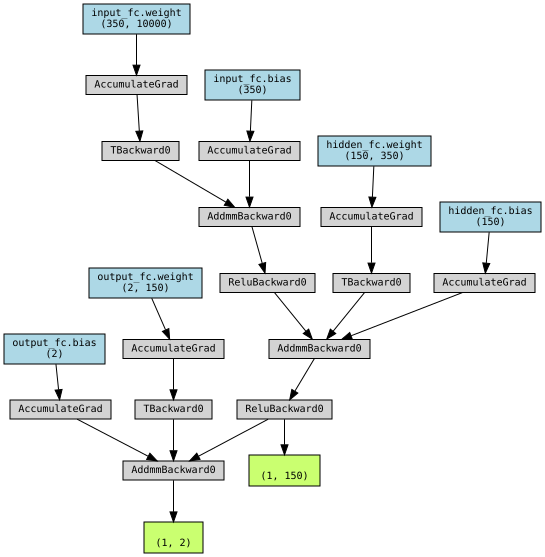

In [ ]:
# Source: https://github.com/szagoruyko/pytorchviz

x = torch.rand(1, 1, 100, 100)
y_pred, h_2 = model(x)
make_dot((y_pred, h_2), params=dict(model.named_parameters()))

In [ ]:
criterion = nn.CrossEntropyLoss() # loss

# Lets try using three different optimzers
Adam_optimizer = optim.Adam(model.parameters(), lr=0.001) # Choosing Adam for this baseline model. Might even be the best optimizer.
SGD_optimizer = optim.SGD(model.parameters(), lr=0.01)
RMS_optimizer = optim.RMSprop(model.parameters(), lr=0.01)

##3.7.1 Training, Validation, Graph, Testing, Predicted Images

Optimzers: https://pytorch.org/docs/stable/optim.html

We want to store Training and Validation losses into lists to visualize how the model is behaving. By doing this, we will find out if the model is behaving correctly or if its overfitting or underfitting.

Also, we would like to store accuracy score values into lists so we can create a dataframe using different optimizer results and compare them.
We will choose the highest value in each list.

The predicted image visualization follows Phase 2

##3.7.2 Adam Optimizer
Adam optimizer will be the only optimizer to have all steps completed. This is because, just like HW 11, it was the optimizer that gave best results. We're also thinking about Colab resources, time, and notebook performance. Due to this, the other 2 optimers (SGD and RMSprop) will be done to compare model performance and accuracy results.
start_time Source: https://stackoverflow.com/questions/1557571/how-do-i-get-time-of-a-python-programs-execution

In [ ]:
epochs = 20 # Lets try with 20 epochs

Adam_train_losses = []
Adam_valid_losses = []
Adam_train_accs = []
Adam_valid_accs = []

for epoch in range(epochs):
    start_time = time.time()
    running_loss = 0.0
    total = 0
    correct = 0
    
    for i, data in enumerate(trainloader_cadod, 0):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        Adam_optimizer.zero_grad()
        
        inputs = inputs.view(inputs.shape[0], -1) # flatten input
        outputs, _ = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        Adam_optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_acc = (correct/total) * 100
    train_loss = running_loss/len(trainloader_cadod)
    Adam_train_losses.append(train_loss)
    Adam_train_accs.append(train_acc)
    
    # Validation
    valid_running_loss = 0.0
    total = 0
    correct = 0
    with torch.no_grad():
        for data in validloader_cadod:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            valid_running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    valid_acc = (correct/total) * 100
    valid_loss = valid_running_loss/len(validloader_cadod)
    Adam_valid_losses.append(valid_loss)
    Adam_valid_accs.append(valid_acc)

    end_time = time.time()
    epoch_time = end_time - start_time

    print(f' Epoch {epoch+1:02} | Epoch Time: {epoch_time:.2f}s')
    print(f' Train loss: {train_loss} | Train accuracy: {train_acc:.2f}%')
    print(f' Validation loss: {valid_loss} | Validation accuracy: {valid_acc:.2f}%')

 Epoch 01 | Epoch Time: 6.30s
 Train loss: 0.7808845269268957 | Train accuracy: 51.20%
 Validation loss: 0.7238200526971084 | Validation accuracy: 46.84%
 Epoch 02 | Epoch Time: 5.91s
 Train loss: 0.6902130698335582 | Train accuracy: 53.98%
 Validation loss: 0.6871642438264993 | Validation accuracy: 54.55%
 Epoch 03 | Epoch Time: 6.58s
 Train loss: 0.690282185187285 | Train accuracy: 53.74%
 Validation loss: 0.6859860906234154 | Validation accuracy: 54.70%
 Epoch 04 | Epoch Time: 5.89s
 Train loss: 0.6944118834089958 | Train accuracy: 52.79%
 Validation loss: 0.6884878658331357 | Validation accuracy: 54.36%
 Epoch 05 | Epoch Time: 7.20s
 Train loss: 0.6893204964440445 | Train accuracy: 54.06%
 Validation loss: 0.6865062585243812 | Validation accuracy: 54.17%
 Epoch 06 | Epoch Time: 5.48s
 Train loss: 0.6853458531971636 | Train accuracy: 55.14%
 Validation loss: 0.6857211131315964 | Validation accuracy: 56.63%
 Epoch 07 | Epoch Time: 7.14s
 Train loss: 0.6894550405699631 | Train accurac

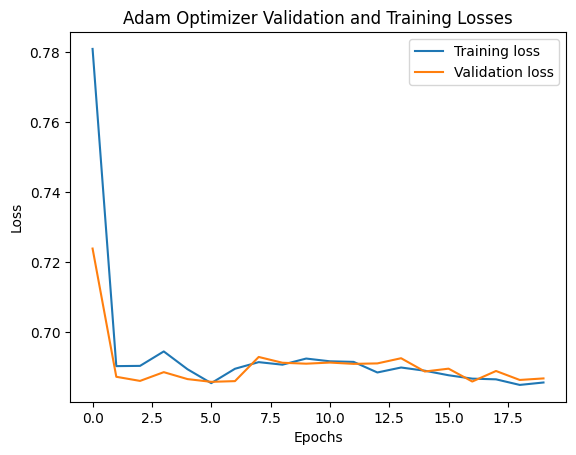

In [ ]:
# Source: https://www.baeldung.com/cs/training-validation-loss-deep-learning
# Source: https://www.projectpro.io/article/exploring-mnist-dataset-using-pytorch-to-train-an-mlp/408
# Source: https://www.analyticsvidhya.com/blog/2019/10/building-image-classification-models-cnn-pytorch/

plt.plot(Adam_train_losses, label='Training loss')
plt.plot(Adam_valid_losses, label='Validation loss')
plt.legend()
plt.title('Adam Optimizer Validation and Training Losses')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.show()

The graph above shows that our model is behaving correctly during the 20 epochs. This is visualizing the Validation and Training loss relations to see if our model was overfitting or underfitting. If the Validation loss is way to higher in comparison to Training loss, then the model might be suffering from overfitting. Overfitting was happening to us in the earlier stages of the MLP classification model. See "Observation".

In [ ]:
# Just like the Training and Valdation, the idea behind the testing came from Google Colab Notebook MLP

Adam_test_accs = [] # storing the only value in test list

with torch.no_grad():
    correct = 0
    total = 0
    for data in testloader_cadod:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        outputs, _ = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    test_acc = (correct/total) * 100
    Adam_test_accs.append(test_acc)

print(f'Testing Set Accuracy: {test_acc:.2f}%')

Testing Set Accuracy: 55.28%


##3.7.3 Classification Report

For prediction formula: Softmax function is applied to an n_dimensional input Tensor rescalling them so that the elements of the n-dimensional output Tensor lie in the range [0,1] and sum to 1.


$$\text{softmax }(\mathbf{x}) = \frac{e^{x_i}}{\sum_j e^{x_j}}$$ 

In [ ]:
# Softmax: https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
# Softmax: Applies the Softmax function to an n-dimensional input Tensor rescaling them so that the elements of the n-dimensional output Tensor 
# lie in the range [0,1] and sum to 1.
# The idea of this prediciton funciton was from the Google Colab Multilayer Perceptron. See Sources.

# Concatenates the given sequence of seq tensors in the given dimension. 
# All tensors must either have the same shape (except in the concatenating dimension) or be empty.
# Source: https://pytorch.org/docs/stable/generated/torch.cat.html

def predictions(model, iterator, device):
    model.eval() # evaluation
    images = []
    labels = []
    probs = []

    with torch.no_grad():
        for (x, y) in iterator:
            x = x.to(device)
            y_pred, _ = model(x) # predicted class probabilities
            y_prob = F.softmax(y_pred, dim=-1) # Applies softmax function to an n-dimensional input Tensor
            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim=0) # images being tested
    labels = torch.cat(labels, dim=0) # True labels
    probs = torch.cat(probs, dim=0) # probabilities

    cat_probs = probs[:, 0] # class 0. predicted probability for cat
    dog_probs = probs[:, 1] # class 1. predicted probability for dog.

    return images, labels, cat_probs, dog_probs

In [ ]:
# Concatenates the given sequence of seq tensors in the given dimension
# concatenting two tensors to create 1 tensor for cat and dog
# Returns a new tensor with a dimension of size one inserted at the specified position.

images, labels, cat_probs, dog_probs = predictions(model, testloader_cadod, device)
probs = torch.cat([cat_probs.unsqueeze(1), dog_probs.unsqueeze(1)], dim=1) 
pred_labels = torch.argmax(probs, 1)                                      
                                                                          
# Print the classification report
target_names = ['cat', 'dog']
print(classification_report(labels.cpu(), pred_labels.cpu(), target_names=target_names))

              precision    recall  f1-score   support

         cat       0.71      0.07      0.13      1209
         dog       0.55      0.98      0.70      1385

    accuracy                           0.55      2594
   macro avg       0.63      0.52      0.41      2594
weighted avg       0.62      0.55      0.43      2594



We can see that the classification report shows many matrices that helps us understand more our MLP model. It is a binary classification problem, which the model is trying to correctly classify class cat (0) and class dog (1). We get a 55.28% of accuracy in our model for the test set. 
- Precision metric is 71% class cat and 55% class dog.
- Recall metric for class cat says that the model is only correctly classifying 7% of the images that do contain cats as cat. In contrast, the model correctly identifies an important 98% for class dog in the images that do contain dog.
- Unfortunately, F1-score metric just shows us that the model is not that good at identifying cat images. It shows its performing well for dog class.


##3.7.4 Confusion Matrix (Experimentation)

In [ ]:
h = labels.cpu()
h.shape

torch.Size([2594])

In [ ]:
k = pred_labels.cpu()
k.shape

torch.Size([2594])

\begin{equation*}
\begin{array}{c|cc}
& \text{Predicted Positive} & \text{Predicted Negative} \\
\hline
\text{Actual Positive} & TP & FN \\
\text{Actual Negative} & FP & TN \\
\end{array}
\end{equation*}

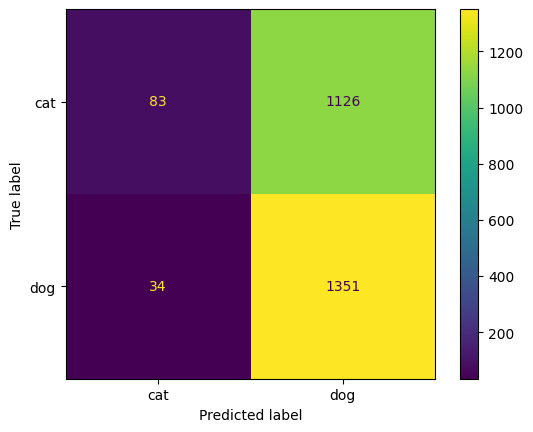

In [ ]:
# Source: https://manisha-sirsat.blogspot.com/2019/04/confusion-matrix.html
# Source: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html

cm = confusion_matrix(h, k)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
disp.plot()
plt.show()

Our confusion matrix just tells that the model is having an easier time identifying dog class rather than cat class. We have a an extremely low number for the **TP** and a very high number for the **FN**. We can also see that the **TN** shows a very high number indicating its easier for the model to classify one class in particular (dogs). Maybe more experimentation, training, or even a more complex model architecture is needed for it to perform better. Unfortunately, this only shows the model is not performing well at all this time.

It is also important to state that the model has performed better in the past. It has even identified 35% of cat images in the past.

##3.7.5 Visualization

In [ ]:
idx_to_label = {1:'dog', 0:'cat'} # encoder

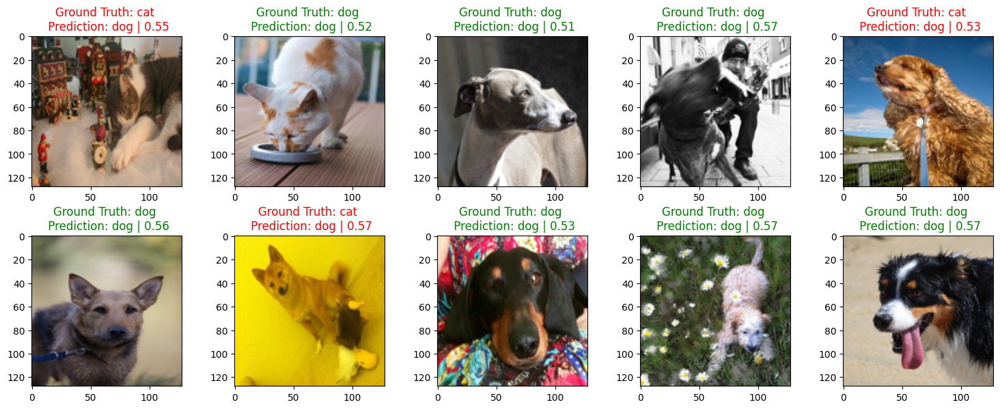

In [ ]:
'''
This code is just to follow up where we left in Phase 2
'''

fig, ax = plt.subplots(nrows=2, ncols=5, sharex=False, sharey=False, figsize=(15,6))
ax = ax.flatten()

for i in range(10):
    img = X_test[i].reshape(128,128,3)
    ax[i].imshow(img)
    cat_prob = cat_probs[i].item()
    dog_prob = dog_probs[i].item()
    pred_label = pred_labels[i].item()
    true_label = labels[i].item()
    
    
    if pred_label == true_label:
        color = "green" # color for correct
    else:
        color = "red" # color for incorrect
    
    
    if pred_label == 0:
        prob = cat_prob # probability based on pred_label 0 which is cat
    else:
        prob = dog_prob # else pred_label is dog
    
    ax[i].set_title("Ground Truth: {0} \n Prediction: {1} | {2:.2f}".format(
        idx_to_label[true_label], idx_to_label[pred_label], prob), color=color)

plt.tight_layout()
plt.show()

##3.7.6 SGD Optimizer

In [ ]:
epochs = 20

SGD_train_losses = []
SGD_valid_losses = []
SGD_train_accs = []
SGD_valid_accs = []

for epoch in range(epochs):
    star_time = time.time()
    running_loss = 0.0
    total = 0
    correct = 0
    
    for i, data in enumerate(trainloader_cadod, 0):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        SGD_optimizer.zero_grad()
        
        inputs = inputs.view(inputs.shape[0], -1) # flatten input
        outputs, _ = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        SGD_optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_acc = (correct/total) * 100
    train_loss = running_loss/len(trainloader_cadod)
    SGD_train_losses.append(train_loss)
    SGD_train_accs.append(train_acc)
    
    # Validation
    valid_running_loss = 0.0
    total = 0
    correct = 0
    with torch.no_grad():
        for data in validloader_cadod:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            valid_running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    valid_acc = (correct/total) * 100
    valid_loss = valid_running_loss/len(validloader_cadod)
    SGD_valid_losses.append(valid_loss)
    SGD_valid_accs.append(valid_acc)

    end_time = time.time()
    epoch_time = end_time - start_time

    print(f' Epoch {epoch+1:02} | Epoch Time: {epoch_time:.2f}s')
    print(f' Train loss: {train_loss} | Train accuracy: {train_acc:.2f}%')
    print(f' Validation loss: {valid_loss} | Validation accuracy: {valid_acc:.2f}%')

 Epoch 01 | Epoch Time: 896.18s
 Train loss: 0.682435427588978 | Train accuracy: 56.45%
 Validation loss: 0.6844673399741833 | Validation accuracy: 55.47%
 Epoch 02 | Epoch Time: 901.20s
 Train loss: 0.6815751496402697 | Train accuracy: 56.31%
 Validation loss: 0.6836565150664403 | Validation accuracy: 55.71%
 Epoch 03 | Epoch Time: 905.10s
 Train loss: 0.6813736153745104 | Train accuracy: 56.55%
 Validation loss: 0.6835164363567646 | Validation accuracy: 55.76%
 Epoch 04 | Epoch Time: 908.99s
 Train loss: 0.6812814467254726 | Train accuracy: 56.71%
 Validation loss: 0.6834434857735268 | Validation accuracy: 55.42%
 Epoch 05 | Epoch Time: 921.26s
 Train loss: 0.6810118843769205 | Train accuracy: 56.60%
 Validation loss: 0.6835805416107178 | Validation accuracy: 55.71%
 Epoch 06 | Epoch Time: 927.08s
 Train loss: 0.68113806740991 | Train accuracy: 56.90%
 Validation loss: 0.6840718214328473 | Validation accuracy: 55.33%
 Epoch 07 | Epoch Time: 931.90s
 Train loss: 0.6811733191040741 | T

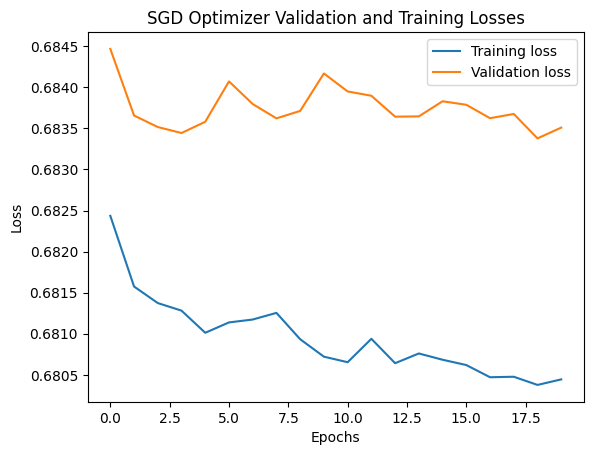

In [ ]:
plt.plot(SGD_train_losses, label='Training loss')
plt.plot(SGD_valid_losses, label='Validation loss')
plt.legend()
plt.title('SGD Optimizer Validation and Training Losses')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.show()

In [ ]:
SGD_test_accs = []

with torch.no_grad():
    correct = 0
    total = 0
    for data in testloader_cadod:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        outputs, _ = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    test_acc = (correct/total) * 100
    SGD_test_accs.append(test_acc)

print(f'Testing Set Accuracy: {test_acc:.2f}%')

Testing Set Accuracy: 55.51%


##3.7.7 RMSprop Optimizer

In [ ]:
epochs = 20

RMS_train_losses = []
RMS_valid_losses = []
RMS_train_accs = []
RMS_valid_accs = []

for epoch in range(epochs):
    start_time = time.time()
    running_loss = 0.0
    total = 0
    correct = 0
    
    for i, data in enumerate(trainloader_cadod, 0):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        RMS_optimizer.zero_grad()
        
        inputs = inputs.view(inputs.shape[0], -1) # flatten input
        outputs, _ = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        RMS_optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_acc = (correct/total) * 100
    train_loss = running_loss/len(trainloader_cadod)
    RMS_train_losses.append(train_loss)
    RMS_train_accs.append(train_acc)
    
    # Validation
    valid_running_loss = 0.0
    total = 0
    correct = 0
    with torch.no_grad():
        for data in validloader_cadod:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            valid_running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    valid_acc = (correct/total) * 100
    valid_loss = valid_running_loss/len(validloader_cadod)
    RMS_valid_losses.append(valid_loss)
    RMS_valid_accs.append(valid_acc)

    end_time = time.time()
    epoch_time = end_time - start_time

    print(f' Epoch {epoch+1:02} | Epoch Time: {epoch_time:.2f}s')
    print(f' Train loss: {train_loss} | Train accuracy: {train_acc:.2f}%')
    print(f' Validation loss: {valid_loss} | Validation accuracy: {valid_acc:.2f}%')

 Epoch 01 | Epoch Time: 7.63s
 Train loss: 3.7699669428255365 | Train accuracy: 51.83%
 Validation loss: 0.6918171295752892 | Validation accuracy: 53.16%
 Epoch 02 | Epoch Time: 6.00s
 Train loss: 0.6924633287835396 | Train accuracy: 52.42%
 Validation loss: 0.6919003188610077 | Validation accuracy: 53.16%
 Epoch 03 | Epoch Time: 7.45s
 Train loss: 0.6924784526057627 | Train accuracy: 52.15%
 Validation loss: 0.6957441609639388 | Validation accuracy: 46.84%
 Epoch 04 | Epoch Time: 5.93s
 Train loss: 0.6928009938919681 | Train accuracy: 51.89%
 Validation loss: 0.6940983157891494 | Validation accuracy: 53.16%
 Epoch 05 | Epoch Time: 7.24s
 Train loss: 0.692738818711248 | Train accuracy: 52.37%
 Validation loss: 0.6924921806042011 | Validation accuracy: 53.16%
 Epoch 06 | Epoch Time: 6.04s
 Train loss: 0.6926362308962591 | Train accuracy: 51.96%
 Validation loss: 0.6912281948786515 | Validation accuracy: 53.16%
 Epoch 07 | Epoch Time: 6.81s
 Train loss: 0.6927416701426451 | Train accurac

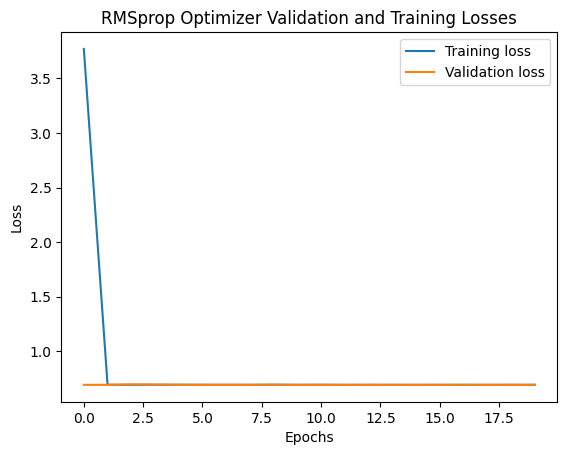

In [ ]:
plt.plot(RMS_train_losses, label='Training loss')
plt.plot(RMS_valid_losses, label='Validation loss')
plt.legend()
plt.title('RMSprop Optimizer Validation and Training Losses')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.show()

In [ ]:
RMS_test_accs = []

with torch.no_grad():
    correct = 0
    total = 0
    for data in testloader_cadod:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        outputs, _ = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    test_acc = (correct/total) * 100
    RMS_test_accs.append(test_acc)

print(f'Testing Set Accuracy: {test_acc:.2f}%')

Testing Set Accuracy: 53.39%


##3.7.8 DataFrame Results



In [ ]:
# Storing Adam Optimizer Values
max_adam_train_acc = max(Adam_train_accs)
adam_train =  np.round(max_adam_train_acc,3)

max_adam_valid_acc = max(Adam_valid_accs)
adam_valid = np.round(max_adam_valid_acc,3)

max_adam_test_acc = max(Adam_test_accs)
adam_test =  np.round(max_adam_test_acc,3)

In [ ]:
# Storing SGD optimzer Values
max_sgd_train_acc = max(SGD_train_accs)
sgd_train =  np.round(max_sgd_train_acc,3)

max_sgd_valid_acc = max(SGD_valid_accs)
sgd_valid = np.round(max_sgd_valid_acc,3)

max_sgd_test_acc = max(SGD_test_accs)
sgd_test =  np.round(max_sgd_test_acc,3)

In [ ]:
# Storing RMSProp Values
max_rms_train_acc = max(RMS_train_accs)
rms_train =  np.round(max_rms_train_acc,3)

max_rms_valid_acc = max(RMS_valid_accs)
rms_valid = np.round(max_rms_valid_acc,3)

max_rms_test_acc = max(RMS_test_accs)
rms_test =  np.round(max_rms_test_acc,3)

In [ ]:
#https://www.geeksforgeeks.org/access-index-of-last-element-in-pandas-dataframe-in-python/


mlp_optimizers = ['Adam Optimizer - cpu', 'SGD Optimizer - cpu', 'RMSprop Optimzer - cpu']
mlp_epoch = ['epoch=20', 'epoch=20', 'epoch=20']
mlp_train_accuracy = [adam_train, sgd_train, rms_train]
mlp_validation_accuracy = [adam_valid, sgd_valid, rms_valid]
mlp_test_accuracy = [adam_test, sgd_test, rms_test]
  

result = pd.DataFrame(list(zip(mlp_optimizers, mlp_epoch, mlp_train_accuracy, mlp_validation_accuracy, mlp_test_accuracy)),
               columns =['MLP Optimizer', 'Number of Epoch', 'Train Accuracy', 'Validation Accuracy', 'Test Accuracy'])
result

,MLP Optimizer,Number of Epoch,Train Accuracy,Validation Accuracy,Test Accuracy
0,Adam Optimizer - cpu,epoch=20,55.140,56.627,55.281
1,SGD Optimizer - cpu,epoch=20,57.045,56.000,55.513
2,RMSprop Optimzer - cpu,epoch=20,52.633,53.157,53.392


**Results:**

We based our results in the max element of each list. In this case, in the maximum accuracy score for Train and Validation. 

*The Test accuracy score list only contains 1 single value.

The dataframe shows that the SGD optimizer gets the higher Train Accuracy score of 57%, while the Adam optimizer performs slightly better at the Validation Accuracy score. Again, SGD optimizer is the optimizer with slightly best performance on the Test Accuracy. Additionally, the graphs from the other optimizers also show a good behavior in relation to the training and validation loss. We would have liked to have more time and more experience to built a better overall classification model for better performance. Unfortunately, our results in this submission notebook are not the best even though we got better results earlier. However, this is a model that can be expanded with new layers, neurons, and parameters that can contribute to a much better result. We think that the simplicity of this model is creating limitations.



##3.7.9 MLP Observation (Experimental)

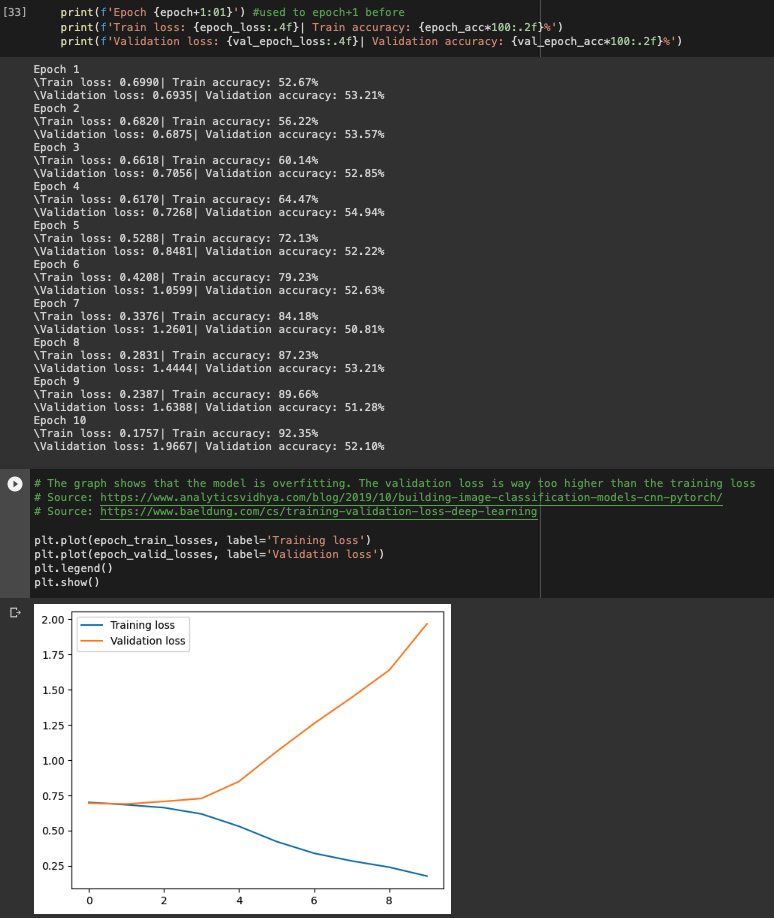

The above image shows how Adam optimizer was suffering from a case of Overfitting. As you can see during the training and validation (testing using 10 epochs), the validation loss was going higher after each epoch in comparison to the Training loss. We were facing this issue because of Standard Scaling the data before reshaping. We tried many regularization techniques like weight_decay = 0.001 in the optimizers, however still no good results were given. Finally, we decided to end up going back to basics with no Standard Scaling and no regularization.

#3.8 Convolutional Neural Network (CNN) - Classification

Convolutional Neural Network (CNN) extracts features from the original input image using a number of layers where the output is a prediction of a class of the object of interest. These layers typically consist of a convolutional layer where the entire input data is passed through a selected kernel (filter) which focuses on extracting features. After one or more convolutional layers their outputs are passed to a pooling layer where a filter of certain size is also applied (for example a max or average is selected) which results in preserving the most important features. There could be a combination of convolutional and pooling layers. After the most important features are extracted and preserved, the data is then flattened and passed to a fully connected layer from where a final function is used to predict the class of object of interest.

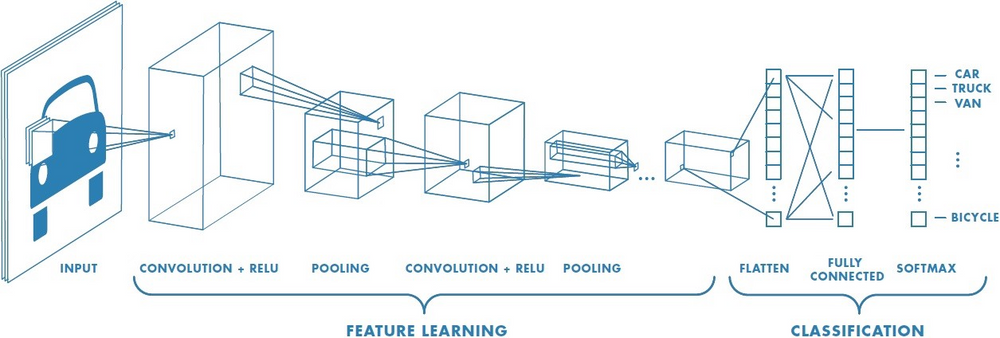
Source: https://blog.paperspace.com/writing-cnns-from-scratch-in-pytorch/

This specific CNN is based on 2 convolutional layers each with ReLU activation function which are then pooled together. This method of 2 convolutional layers, ReLU, and pooling layer is repeated and then the output is flattened and passed to 2 Linear fully connected layers. Loss function used is Cross Entropy and we accuracy and time of each step is being recorded.

This section is based on the code from HW 11 and these articles:
*   https://blog.paperspace.com/object-localization-using-pytorch-1/
*   https://blog.paperspace.com/object-localization-pytorch-2/
*   https://blog.paperspace.com/writing-cnns-from-scratch-in-pytorch/
*   https://www.analyticsvidhya.com/blog/2019/10/building-image-classification-models-cnn-pytorch/



##3.8.1 Loading data

In [ ]:
# Create training and testing sets: 80 to 20%
X_train, X_test, y_train, y_test_label = train_test_split(X, y_label, test_size=0.2, random_state=42, shuffle=True)

# From training set, create training and validation sets: 80 to 20%
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42, shuffle=True)

In [ ]:
X_train.shape

(8297, 49152)

In [ ]:
X_valid.shape

(2075, 49152)

In [ ]:
X_test.shape

(2594, 49152)

##3.8.2 Transforming and preparing data

In [ ]:
X_train = X_train.reshape((-1, 128, 128, 3))
X_valid = X_valid.reshape((-1, 128, 128, 3))
X_test = X_test.reshape((-1, 128, 128, 3))

In [ ]:
'''
transform_gray for grayscale images as well as several additional preprocessing steps
'''

transform_gray = transforms.Compose([
    transforms.CenterCrop(100), # Crop images to center
    transforms.RandomHorizontalFlip(p=0.5), # Probability range 0 to 1
    transforms.RandomRotation(degrees=(60, 90)),
    transforms.Grayscale(num_output_channels=1), # convert to grayscale
    transforms.ToTensor()
])

In [ ]:
# Apply transform_gray preprocessing

X_train_transformed = []
for image in X_train:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_train_transformed.append(transformed_image)

X_valid_transformed = []
for image in X_valid:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_valid_transformed.append(transformed_image)

X_test_transformed = []
for image in X_test:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_test_transformed.append(transformed_image)

In [ ]:
X_train_transformed[1].shape

torch.Size([1, 100, 100])

In [ ]:
# Creating torch objects for the target variables
y_train_tensor = torch.from_numpy(y_train)
y_valid_tensor = torch.from_numpy(y_valid)
y_test_tensor = torch.from_numpy(y_test_label)

In [ ]:
'''
class PyTorchDataset(Dataset) is used to transform data into Pytorch dataset
'''

class PyTorchDataset(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x = self.X[idx]
        y = self.y[idx]

        if self.transform:
            x = self.transform(x)

        return x, y

In [ ]:
# Transforming data into tensors via a homegrown transformer method
cadod_train = PyTorchDataset(X_train_transformed, y_train_tensor)
cadod_valid = PyTorchDataset(X_valid_transformed, y_valid_tensor)
cadod_test = PyTorchDataset(X_test_transformed, y_test_tensor)

In [ ]:
train_batch_size = 500
valid_test_batch_size = 32

# Creating instances of DataLoaderu which will simplify loading the data into the model
trainloader_cadod = torch.utils.data.DataLoader(cadod_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_cadod = torch.utils.data.DataLoader(cadod_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_cadod = torch.utils.data.DataLoader(cadod_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)

In [ ]:
# Create a CNN for classification
class ConvNeuralNet(nn.Module):
	#  Determine what layers and their order in CNN object 
    def __init__(self, num_classes):
        super(ConvNeuralNet, self).__init__()

        # Layers 1-2: convolutional layers + 1 max-pooling layer
        self.conv_layer1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=4)
        self.relu1 = nn.ReLU()
        self.conv_layer2 = nn.Conv2d(in_channels=32, out_channels=32, kernel_size=4)
        self.relu2 = nn.ReLU()
        self.max_pool1 = nn.MaxPool2d(kernel_size = 2, stride = 2)

        # Layers 3-4: convolutional layers + 1 max-pooling layer
        self.conv_layer3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4)
        self.relu3 = nn.ReLU()
        self.conv_layer4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=4)
        self.relu4 = nn.ReLU()
        self.max_pool2 = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.fc1 = nn.Linear(25600, 2)
        self.relu5 = nn.ReLU()
        self.fc2 = nn.Linear(2, num_classes)
    
    # Progresses data across layers
    def forward(self, x):
        out = self.conv_layer1(x)
        out = self.conv_layer2(out)
        out = self.max_pool1(out)
        
        out = self.conv_layer3(out)
        out = self.conv_layer4(out)
        out = self.max_pool2(out)
                
        out = out.reshape(out.size(0), -1)
        
        out = self.fc1(out)
        out = self.relu1(out)
        out = self.fc2(out)
        # out = out.view(batch_size, -1, 4)
        return out

In [ ]:
# Define relevant variables for the ML task
batch_size = 500
num_classes = 2
learning_rate = 0.001
num_epochs = 20

# Device will determine whether to run the training on GPU or CPU.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
# Define hyper parameters for the CNN
model = ConvNeuralNet(num_classes)

if torch.cuda.is_available():
    model.cuda()

# Define loss function
criterion = nn.CrossEntropyLoss()

# Define optimizer (stochastic gradient descent)
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay = 0.005, momentum = 0.9)
# optimizer = optim.Adam(model.parameters(),lr=0.001) 

# Define number of steps
total_step = len(trainloader_cadod)

In [ ]:
# Visualize the CNN model
print(model)

ConvNeuralNet(
  (conv_layer1): Conv2d(1, 32, kernel_size=(4, 4), stride=(1, 1))
  (relu1): ReLU()
  (conv_layer2): Conv2d(32, 32, kernel_size=(4, 4), stride=(1, 1))
  (relu2): ReLU()
  (max_pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_layer3): Conv2d(32, 64, kernel_size=(4, 4), stride=(1, 1))
  (relu3): ReLU()
  (conv_layer4): Conv2d(64, 64, kernel_size=(4, 4), stride=(1, 1))
  (relu4): ReLU()
  (max_pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=25600, out_features=2, bias=True)
  (relu5): ReLU()
  (fc2): Linear(in_features=2, out_features=2, bias=True)
)


In [ ]:
# Visualize the CNN model
from torchsummary import summary
summary(model, (1, 100, 100))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 97, 97]             544
            Conv2d-2           [-1, 32, 94, 94]          16,416
         MaxPool2d-3           [-1, 32, 47, 47]               0
            Conv2d-4           [-1, 64, 44, 44]          32,832
            Conv2d-5           [-1, 64, 41, 41]          65,600
         MaxPool2d-6           [-1, 64, 20, 20]               0
            Linear-7                    [-1, 2]          51,202
              ReLU-8                    [-1, 2]               0
            Linear-9                    [-1, 2]               6
Total params: 166,600
Trainable params: 166,600
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.04
Forward/backward pass size (MB): 6.96
Params size (MB): 0.64
Estimated Total Size (MB): 7.63
-------------------------------------------

##3.8.3 Training

Model is trained in 20 epochs.

In [ ]:
# Training
outputs_list_training = []
total_correct = 0
total_examples = 0
start_time = time.time()

# We use the pre-defined number of epochs to determine how many iterations to train the network on
for epoch in range(num_epochs):
	#Load in the data in batches using the train_loader object

    running_loss = 0.0

    for i, (images, labels) in enumerate(trainloader_cadod):  
        # Move tensors to the configured device
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)
        running_loss += loss.item()
        _, predicted = torch.max(outputs.data,1)
        total_correct += (predicted == labels).sum().item()
        total_examples += len(images)
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print('Epoch [{}/{}], Training Loss: {:.4f}'.format(epoch+1, num_epochs, running_loss / len(trainloader_cadod)))
    outputs_list_training.append(running_loss / len(trainloader_cadod))

end_time = time.time()
epoch_time = np.round(end_time - start_time, 2)
accuracy_train = np.round(total_correct/total_examples*100, 2)

print()
print(f'Training Set Accuracy: ', accuracy_train, '%')
print(f'Training Set Time: ', epoch_time, 's')

Epoch [1/20], Training Loss: 0.7406
Epoch [2/20], Training Loss: 0.7043
Epoch [3/20], Training Loss: 0.6995
Epoch [4/20], Training Loss: 0.6964
Epoch [5/20], Training Loss: 0.6947
Epoch [6/20], Training Loss: 0.6934
Epoch [7/20], Training Loss: 0.6918
Epoch [8/20], Training Loss: 0.6907
Epoch [9/20], Training Loss: 0.6895
Epoch [10/20], Training Loss: 0.6886
Epoch [11/20], Training Loss: 0.6880
Epoch [12/20], Training Loss: 0.6878
Epoch [13/20], Training Loss: 0.6870
Epoch [14/20], Training Loss: 0.6873
Epoch [15/20], Training Loss: 0.6867
Epoch [16/20], Training Loss: 0.6861
Epoch [17/20], Training Loss: 0.6858
Epoch [18/20], Training Loss: 0.6848
Epoch [19/20], Training Loss: 0.6851
Epoch [20/20], Training Loss: 0.6847

Training Set Accuracy:  54.0 %
Training Set Time:  115.48 s


##3.8.4 Validation

Model is validated to discover if the loss function and accuracy significantly differs from the training values.

In [ ]:
# Validation
outputs_list_validation = []
total_correct = 0
total_examples = 0
start_time = time.time()

model.eval()
with torch.no_grad():

  for epoch in range(num_epochs):
    #Load in the data in batches using the train_loader object

      running_loss = 0.0

      for i, (images, labels) in enumerate(validloader_cadod):  
          # Move tensors to the configured device
          images = images.to(device)
          labels = labels.to(device)
          
          # Forward pass
          outputs = model(images)
          loss = criterion(outputs, labels)
          running_loss += loss.item()
          _, predicted = torch.max(outputs.data,1)
          total_correct += (predicted == labels).sum().item()
          total_examples += len(images)

      print('Epoch [{}/{}], Validation Loss: {:.4f}'.format(epoch+1, num_epochs, running_loss / len(validloader_cadod)))
      outputs_list_validation.append(running_loss / len(validloader_cadod))

end_time = time.time()
epoch_time = np.round(end_time - start_time, 2)
accuracy_valid = np.round(total_correct/total_examples*100, 2)

print()
print(f'Validation Set Accuracy: ', accuracy_valid, '%')
print(f'Validation Set Time: ', epoch_time, 's')

Epoch [1/20], Validation Loss: 0.6859
Epoch [2/20], Validation Loss: 0.6858
Epoch [3/20], Validation Loss: 0.6859
Epoch [4/20], Validation Loss: 0.6859
Epoch [5/20], Validation Loss: 0.6858
Epoch [6/20], Validation Loss: 0.6858
Epoch [7/20], Validation Loss: 0.6859
Epoch [8/20], Validation Loss: 0.6858
Epoch [9/20], Validation Loss: 0.6858
Epoch [10/20], Validation Loss: 0.6858
Epoch [11/20], Validation Loss: 0.6858
Epoch [12/20], Validation Loss: 0.6858
Epoch [13/20], Validation Loss: 0.6859
Epoch [14/20], Validation Loss: 0.6858
Epoch [15/20], Validation Loss: 0.6858
Epoch [16/20], Validation Loss: 0.6858
Epoch [17/20], Validation Loss: 0.6859
Epoch [18/20], Validation Loss: 0.6858
Epoch [19/20], Validation Loss: 0.6857
Epoch [20/20], Validation Loss: 0.6858

Validation Set Accuracy:  54.51 %
Validation Set Time:  21.14 s


##3.8.5 Testing

Model is predicting classes of previously unseen (test) data.

In [ ]:
# Testing
outputs_list_validation = []
total_correct = 0
total_examples = 0
start_time = time.time()

model.eval()
with torch.no_grad():

  for epoch in range(num_epochs):
    #Load in the data in batches using the train_loader object

      running_loss = 0.0

      for i, (images, labels) in enumerate(testloader_cadod):  
          # Move tensors to the configured device
          images = images.to(device)
          labels = labels.to(device)
          
          # Forward pass
          outputs = model(images)
          loss = criterion(outputs, labels)
          running_loss += loss.item()
          _, predicted = torch.max(outputs.data,1)
          total_correct += (predicted == labels).sum().item()
          total_examples += len(images)

      print('Epoch [{}/{}], Test Loss: {:.4f}'.format(epoch+1, num_epochs, running_loss / len(testloader_cadod)))
      outputs_list_validation.append(running_loss / len(testloader_cadod))

end_time = time.time()
epoch_time = np.round(end_time - start_time, 2)
accuracy_test = np.round(total_correct/total_examples*100, 2)

print()
print(f'Test Set Accuracy: ', accuracy_test, '%')
print(f'Test Set Time: ', epoch_time, 's')

Epoch [1/20], Test Loss: 0.6857
Epoch [2/20], Test Loss: 0.6872
Epoch [3/20], Test Loss: 0.6847
Epoch [4/20], Test Loss: 0.6878
Epoch [5/20], Test Loss: 0.6866
Epoch [6/20], Test Loss: 0.6863
Epoch [7/20], Test Loss: 0.6867
Epoch [8/20], Test Loss: 0.6872
Epoch [9/20], Test Loss: 0.6860
Epoch [10/20], Test Loss: 0.6863
Epoch [11/20], Test Loss: 0.6855
Epoch [12/20], Test Loss: 0.6863
Epoch [13/20], Test Loss: 0.6863
Epoch [14/20], Test Loss: 0.6859
Epoch [15/20], Test Loss: 0.6869
Epoch [16/20], Test Loss: 0.6858
Epoch [17/20], Test Loss: 0.6852
Epoch [18/20], Test Loss: 0.6871
Epoch [19/20], Test Loss: 0.6879
Epoch [20/20], Test Loss: 0.6860

Test Set Accuracy:  55.55 %
Test Set Time:  19.76 s


In [ ]:
dfData = ['CNN Classification (GPU)', 'epoch=20', accuracy_train, accuracy_valid, accuracy_test]

dfCNNResults = pd.DataFrame(np.array([dfData]), columns =['Model', 'Number of Epoch', 'Train Accuracy', 'Validation Accuracy', 'Test Accuracy'])
dfCNNResults

,Model,Number of Epoch,Train Accuracy,Validation Accuracy,Test Accuracy
0,CNN Classification (GPU),epoch=20,54.0,54.51,55.55


##3.8.9 Visualization
This graph compares 

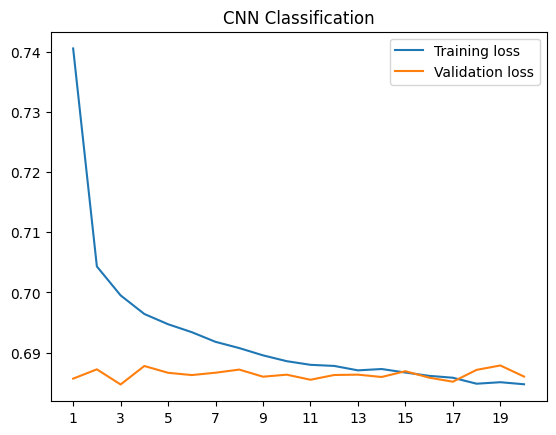

In [ ]:
fig, ax = plt.subplots()
t = np.arange(1, 21, 1)                                                             # Generate indexes
ax.plot(t, outputs_list_training, label='Training loss', color='tab:blue')          # Plot training loss
ax.plot(t, outputs_list_validation, label='Validation loss', color='tab:orange')    # Plot validation loss
plt.xticks(np.arange(1, 21, step=2))                                                # Correct X tickers
plt.title('CNN Classification')                                                     # Add title
plt.legend()                                                                        # Add legend
plt.show()                                                                          # Show the plot

##3.8.10 CNN Classification Report
Results for this specific model include only accuracy and time of the training, validation, and testing phase. According to the plot with values of loss functions from each epoch during the training and validation phase, due to the training plot trending down, the model might be slightly overfitted. But it seems it starts following the same trend as the valudes of validation losses. Testing with more epochs would be the next step. Also trying different optimizers, for example Adam.

Based on the accuracy scores, CNN classification model seems to be performing slightly better than previous classification models.

In [ ]:
dfCNNResults

,Model,Number of Epoch,Train Accuracy,Validation Accuracy,Test Accuracy
0,CNN Classification (GPU),epoch=20,54.0,54.51,55.55


#3.9 PyTorch MLP Regression Cats and Dogs

In [ ]:
from google.colab import auth
from google.auth import default
from google.colab import drive
import gspread

auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#colab_path = '/content/drive/MyDrive/MLProject/aml/data/martin'
#X = np.load(colab_path + '/img.npy', allow_pickle=True)
#y_label = np.load(colab_path + '/y_label.npy', allow_pickle=True)
#y_bbox = np.load(colab_path + '/y_bbox.npy', allow_pickle=True)

colab_path = '/content/drive/MyDrive/Data_Science_Final/aml'

X = np.load('/content/drive/MyDrive/Data_Science_Final/aml/data/img.npy', allow_pickle=True)
y_label = np.load('/content/drive/MyDrive/Data_Science_Final/aml/data/y_label.npy', allow_pickle=True)
y_bbox = np.load('/content/drive/MyDrive/Data_Science_Final/aml/data/y_bbox.npy', allow_pickle=True)

##3.9.1 Multilayer Perceptron Regression Pipeline

**Model Input Features - Images:**
The input for the models is images that have been rescaled, flattened into a 2D array, and image augmentation was performed.  

**Model Target - Bounding Boxes:** 
 The target for this regression model is bounding box coordinates. 

The bounding box describes the spatial location of an object in an image. It is a rectangular box over the image and there are two ways of representing the bounding box: 

1. x and y coordinates of the upper left corner and the lower right corner of the rectangle. 

2. x,y coordinates of the bounding box center and the width and height of the box. 

This model predicts the following bounding box coordinates: 'XMin', 'YMin', 'XMax', 'YMax'. 

### Workflow
* Preprocessing
  * We performed the following preprocessing steps: 
    * Rescaled the images to be all the same size 
    * We took the RGB intensity values and flattened them from a 3D array to a 2D array. 
    * Changing images from RGB to Grey scale
* Multi-Layer Perceptron (MLP) neural network:
  * MLP has four layers: an input layer, two hidden layers, and an output layer.
  * The input dimension was 128 x 128 
  * The output dimension was 4 for the 'XMin', 'YMin', 'XMax', 'YMax' bounding box coordinates. 
  *  ReLU activation function was used.
  * The MLP updated weights and biases using backpropagation and an optimizer: Stochastic Gradient Descent (SGD) or Adam 


### Experiments:
This is a PyTorch implementation of a Multi-Layer Perceptron (MLP) neural network.

Five experiments are conducted with the regression pipeline. 
1. Regression Baseline:
  * Training batch size of 96 and test batch size of 32
  * Adam optimizer
2. Regression with bigger batch size:
  * Training batch size of 500 and test batch size of 100
3. Regression with regularization:
  * Adam optimizer with weight decay of 0.01
4. Regression with SGD optimizer
5. Regression with augmentation
  * 10% of training images with rotated 90 degrees.

The regression pipeline is using the Mean squared error (MSE) loss function. The metrics we are using to compare experiments are Mean squared error (MSE), root mean square error (RMSE), and mean absolute error ( MAE). The MSE is recorded in our experiment log.


### Equations:

**MSE Equation:**
Loss function that works for multiple algorithms including linear regression


\begin{equation}\tag{Reference: Lab 4 Linear Regression}
MSE(\boldsymbol{\theta}) = f(\boldsymbol{\theta}) = \frac{1}{m}\sum_{i=1}^{m}\left[ \mathbf{x}_i\cdot\boldsymbol{\theta} - y_i\right]^2
\end{equation}


Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align}

More specific details for each experiment are explained below.

In [ ]:
X_train, X_test, y_train, y_test_label = train_test_split(X, y_bbox, test_size=0.2, random_state=42, shuffle=True)
#Validation
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42, shuffle=True)

In [ ]:
X_test_before_scaling = X_test

In [ ]:
#reshape
#for example train is reshaped to 8297, 128, 128, 3 
#which is number of images (8297), pixel dimension 128 x 128, then 3 for RBG

X_train = X_train.reshape((-1, 128, 128, 3)).astype(np.uint8)
X_valid = X_valid.reshape((-1, 128, 128, 3)).astype(np.uint8)
X_test = X_test.reshape((-1, 128, 128, 3)).astype(np.uint8)

In [ ]:
'''
transform_gray for grayscale images
'''
#Note: Removed image rotation and cropping because we would need to also update the bounding boxes
transform_gray = transforms.Compose([
    transforms.Grayscale(num_output_channels=1), # convert to grayscale
    transforms.ToTensor()
])

In [ ]:
# Apply transform_gray

X_train_transformed = []
for image in X_train:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_train_transformed.append(transformed_image)

X_valid_transformed = []
for image in X_valid:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_valid_transformed.append(transformed_image)

X_test_transformed = []
for image in X_test:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_test_transformed.append(transformed_image)

In [ ]:
X_train_transformed[1].shape

torch.Size([1, 128, 128])

In [ ]:
# Creates tensor from numpy
y_train_tensor = torch.from_numpy(y_train)
y_valid_tensor = torch.from_numpy(y_valid)
y_test_tensor = torch.from_numpy(y_test_label)

In [ ]:
def is_pytorch_dataset(obj):
    return isinstance(obj, Dataset)

In [ ]:
if is_pytorch_dataset(X_train_transformed):
    print('The input dataset is a PyTorch dataset.')
else:
    print('The input dataset is not a PyTorch dataset.')

The input dataset is not a PyTorch dataset.


In [ ]:
'''
class PyTorchDataset(Dataset) is used to transform data into Pytorch dataset
'''

class PyTorchDataset(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x = self.X[idx]
        y = self.y[idx]

        if self.transform:
            x = self.transform(x)

        return x, y

In [ ]:
cadod_train = PyTorchDataset(X_train_transformed, y_train_tensor)
cadod_valid = PyTorchDataset(X_valid_transformed, y_valid_tensor)
cadod_test = PyTorchDataset(X_test_transformed, y_test_tensor)

In [ ]:
if is_pytorch_dataset(cadod_train):
    print('The input dataset is a PyTorch dataset.')
else:
    print('The input dataset is not a PyTorch dataset.')

The input dataset is a PyTorch dataset.


###3.9.2 Experiment 1: Regression multilayer perceptron (MLP) - Baseline model

* Regression MLP Baseline:
  * Training batch size of 96 and test batch size of 32
  * Adam optimizer

In [ ]:
# DataLoader - Iterate over training data by batches. 
#Batch size is large here because when I use a small batch size the model overfits on train and the bounding box stays in the same position. 
train_batch_size = 96 
valid_test_batch_size = 32 

trainloader_cadod = torch.utils.data.DataLoader(cadod_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_cadod = torch.utils.data.DataLoader(cadod_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_cadod = torch.utils.data.DataLoader(cadod_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2) #just added drop_last = True

In [ ]:
#Multi-layer perceptron (MLP) neural network
#
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()

        self.input_fc = nn.Linear(input_dim, 500) 
        self.hidden_fc1 = nn.Linear(500, 250)
        self.hidden_fc2 = nn.Linear(250, 100)
        self.output_fc = nn.Linear(100, output_dim)

    def forward(self, x): #forward pass of MLP
        batch_size = x.shape[0] # x = [batch size, height, width]
        x = x.view(batch_size, -1) # x = [batch size, height * width] flattened input tensor
        h_1 = F.relu(self.input_fc(x)) # h_1 = [batch size, 500]
        h_2 = F.relu(self.hidden_fc1(h_1)) # h_2 = [batch size, 250]
        h_3 = F.relu(self.hidden_fc2(h_2)) # h_3 = [batch size, 100]
        y_pred = self.output_fc(h_3) # y_pred = [batch size, output dim]
        y_pred = y_pred.view(batch_size, -1, 4) # reshape output tensor into batch size, rows, columns
        return y_pred

In [ ]:
# input is 128 x 128 pixel size
# output is the 4 bounding box coordinates
INPUT_DIM = 128*128 
OUTPUT_DIM = 4
# Run MLP model
model = MLP(INPUT_DIM, OUTPUT_DIM)

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
#number of trainable parameters often correlates with the model's capacity and ability to fit complex patterns in data.
print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 8,343,254 trainable parameters


In [ ]:
# Adam optimization algorithm
# model.paramters = returns an iterable of all the parameters in the model. optimizer uses these parameters to update the model.
# learning rate is set to 0.001
optimizer = optim.Adam(model.parameters(),lr=0.001) 

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') #set device to CPU or GPU

In [ ]:
# MSE loss function
# This will be used to calculate MSE loss between predicted and target in the forward pass then model parameters are updated to minimize MSE. 
criterion = nn.MSELoss() 

In [ ]:
#Make sure model and criterion are performed on the same device.
model = model.to(device)
criterion = criterion.to(device)

In [ ]:
next(model.parameters()).is_cuda #checks if tensor is located on GPU (CUDA)

False

In [ ]:
#Training
t1 = time.time()
outputs_list_training = []
epochs = 20 # Number of passes through the training data. 
for epoch in range(epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader_cadod, 0): #iterates over each batch of data
        inputs, labels = data
        optimizer.zero_grad() #set optimizer's gradients to zero (to clear previously computed gradients)
        outputs = model(inputs) #forward pass
        loss = criterion(outputs, labels) #calcuate loss
        loss.backward() #gradients of loss are computed
        optimizer.step() #update model parameters (w)
        running_loss += loss.item() #updates running loss by adding current batch loss
    print('Epoch {} loss: {}'.format(epoch + 1, running_loss / len(trainloader_cadod))) #training loss for epoch = running loss / number of batches in the epoch
    outputs_list_training.append([epoch + 1, running_loss / len(trainloader_cadod)])
time_train = time.time() - t1

Epoch 1 loss: 0.07596306905321691
Epoch 2 loss: 0.03783005309002153
Epoch 3 loss: 0.033550879008125985
Epoch 4 loss: 0.02970889979309734
Epoch 5 loss: 0.026559545219629662
Epoch 6 loss: 0.023759201597208263
Epoch 7 loss: 0.021003422038308506
Epoch 8 loss: 0.0181784827647538
Epoch 9 loss: 0.01690742330647063
Epoch 10 loss: 0.014393900371231567
Epoch 11 loss: 0.01382877813630748
Epoch 12 loss: 0.012348523716731319
Epoch 13 loss: 0.011640629110236963
Epoch 14 loss: 0.01134040245208247
Epoch 15 loss: 0.010877778550245982
Epoch 16 loss: 0.010708188563157087
Epoch 17 loss: 0.010603205161704415
Epoch 18 loss: 0.01054938117192052
Epoch 19 loss: 0.010490373419276599
Epoch 20 loss: 0.010482938521295443


In [ ]:
#Create a dataframe with predicted values and batch number
train_df2 = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Training_Loss'))
min_index = train_df2[['Training_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_train_value = train_df2.iloc[min_index, 1] #Get lowest MSE
epoch_train_value = train_df2.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
#Validation
t2 = time.time()
# Evaluate the model on the validation set
outputs_list_valid = []
epochs = 20 # Number of passes through the training data
model.eval()
with torch.no_grad():
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    for epoch in range(epochs):
        running_loss = 0.0
        for data in validloader_cadod:
            inputs, labels = data
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data,1)
            total_correct += (predicted == labels).sum().item()
            total_examples += len(inputs)
        print('Validation Loss: {}, Accuracy: {}'.format(total_loss / len(validloader_cadod), total_correct / total_examples))
        outputs_list_valid.append([epoch + 1, total_loss / len(validloader_cadod)])
time_valid = time.time() - t2

Validation Loss: 0.010404185993740192, Accuracy: 0.5749397590361446
Validation Loss: 0.020809971354901792, Accuracy: 0.5749397590361446
Validation Loss: 0.03120947120567927, Accuracy: 0.5749397590361446
Validation Loss: 0.04161296682432294, Accuracy: 0.5749397590361446
Validation Loss: 0.052016996599447266, Accuracy: 0.5749397590361446
Validation Loss: 0.062424082316171664, Accuracy: 0.5749397590361446
Validation Loss: 0.07283273491865168, Accuracy: 0.5749397590361446
Validation Loss: 0.08324236791724196, Accuracy: 0.5749397590361446
Validation Loss: 0.09364944266585204, Accuracy: 0.5749397590361446
Validation Loss: 0.1040527925038567, Accuracy: 0.5749397590361446
Validation Loss: 0.11446008921529238, Accuracy: 0.5749397590361446
Validation Loss: 0.12487080125854566, Accuracy: 0.5749397590361446
Validation Loss: 0.1352769169025123, Accuracy: 0.5749397590361446
Validation Loss: 0.14568220199300694, Accuracy: 0.5749397590361446
Validation Loss: 0.156087041596094, Accuracy: 0.574939759036

In [ ]:
#Create a dataframe with predicted values and batch number
valid_df = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Valid_Loss'))

In [ ]:
#Create a dataframe with predicted values and batch number (for plotting)
min_index = valid_df[['Valid_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_valid_value = valid_df.iloc[min_index, 1] #Get lowest MSE
epoch_valid_value = valid_df.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
# Test loop
t3 = time.time()
model.eval() #turn off batch normalization
with torch.no_grad(): #turn off gradient tracking
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    outputs_list = []
    label_list = []
    for i, data in enumerate(testloader_cadod): #batch size of 16
        inputs, labels = data
        label_list.append(labels)
        outputs = model(inputs) #forward pass
        outputs_np = np.array(outputs)
        #print(outputs)
        outputs_list.append(outputs_np)
        loss = criterion(outputs, labels) #calcuate loss
        total_loss += loss.item() #loss value is added to total loss
        predicted = torch.argmax(outputs, dim=1) #argmax sets largest value to 1 and all other values to 0. ##Change this. It is for classifcation not regression. 
        if i == len(testloader_cadod)-1:
            # Handle the last batch with a smaller size
            total_correct += (predicted[:len(inputs)] == labels).sum().item() #sum of correct predictions
            total_examples += len(inputs) # total number of examples processed
        else:
            total_correct += (predicted == labels).sum().item()
            total_examples += len(labels)
    test_loss = total_loss / len(testloader_cadod)
    print('Test Loss: {}, Accuracy: {}'.format(test_loss, total_correct / total_examples)) #print('Test Loss: {}, Accuracy: {}'.format(total_loss / len(testloader_cadod), total_correct / total_examples))
time_test = time.time() - t3

Test Loss: 0.010468021750722716, Accuracy: 0.6013878180416345


In [ ]:
#Create a dataframe with predicted values and batch number (for visualization)
pred_df = pd.DataFrame()
counter0 = 0
counter1 = 0
for i in outputs_list:
  counter0 = counter0+1
  for j in i:
    for k in j:
      pred_df.loc[counter1, 'XMin'] = k[0]
      pred_df.loc[counter1, 'XMax'] = k[1]
      pred_df.loc[counter1, 'YMin'] = k[2]
      pred_df.loc[counter1, 'YMax'] = k[3]
      pred_df.loc[counter1, 'batch_number'] = counter0
      counter1 = counter1 +1


In [ ]:
summary(model, (1,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 500]       8,192,500
            Linear-2                  [-1, 250]         125,250
            Linear-3                  [-1, 100]          25,100
            Linear-4                    [-1, 4]             404
Total params: 8,343,254
Trainable params: 8,343,254
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.06
Forward/backward pass size (MB): 0.01
Params size (MB): 31.83
Estimated Total Size (MB): 31.90
----------------------------------------------------------------


tensor([[[0.1039, 0.1055, 0.9123, 0.9594]]], grad_fn=<ViewBackward0>)


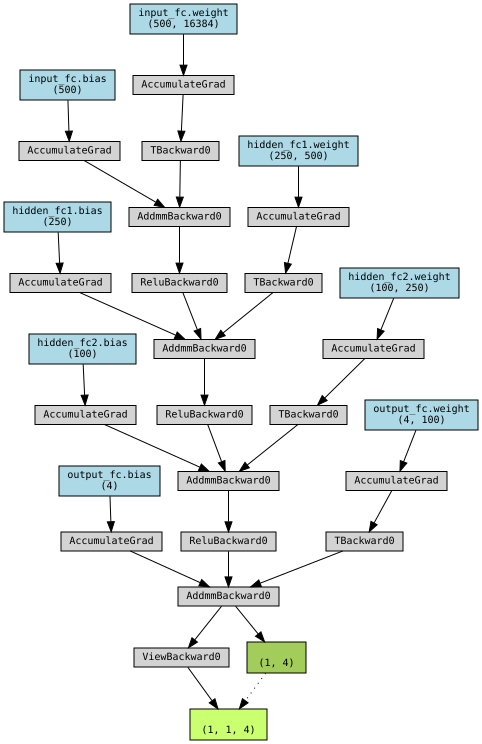

In [ ]:
from torchviz import make_dot
x = torch.rand(1,1,128,128)
print(model(x))
y_pred = model(x)
make_dot((y_pred), params=dict(model.named_parameters()))

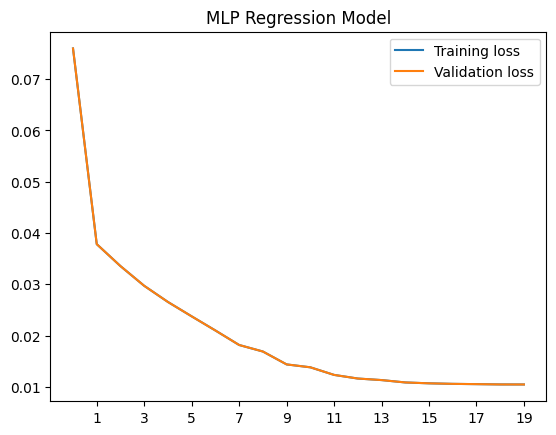

In [ ]:
plt.plot(train_df2['Training_Loss'], label='Training loss')
plt.plot(valid_df['Valid_Loss'], label='Validation loss')
plt.xticks(np.arange(1, 20, step=2))
plt.title('MLP Regression Model')
plt.legend()
plt.show()

In [ ]:
#Create experiment log
ExperimentLog  = pd.DataFrame(
    columns=[
        "Architecture string", 
        "Optimizer", 
        "Epochs", 
        "Train MSE",
        "Train Time",
        "Valid MSE",
        "Valid Time",
        "Test MSE",
        "Test Time"
    ]
)

In [ ]:
ExperimentLog.loc[len(ExperimentLog)] = [
    "16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4", 
    optim.Adam, 
    epochs, 
    loss_train_value, 
    time_train,
    loss_valid_value,
    time_valid, 
    test_loss,
    time_test
]

ExperimentLog 

,Architecture string,Optimizer,Epochs,Train MSE,Train Time,Valid MSE,Valid Time,Test MSE,Test Time
0,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.010483,361.498952,0.010483,32.077016,0.010468,1.918534


In [ ]:
#change prediction dataframe into numpy array so it works for image display
#drop column
pred_np = pred_df.drop('batch_number', axis=1)
pred_df  
#convert to numpy array
pred_np = pred_df.to_numpy()

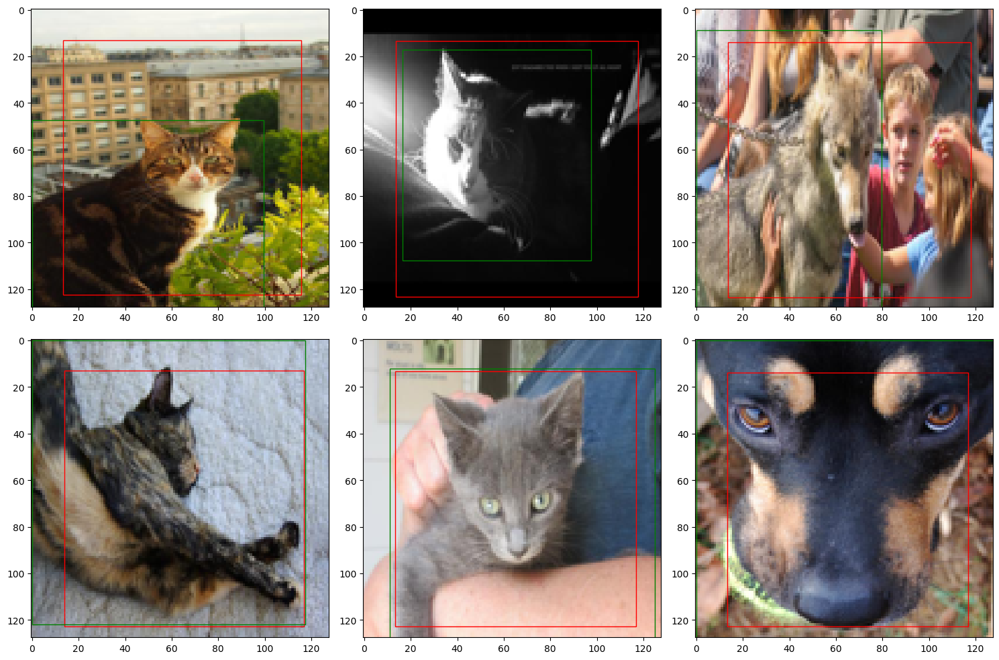

In [ ]:
# show image with predicted and true bounding boxes. 
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(X_test.shape[0], size=6, replace=False)):
    img = X_test_before_scaling[j].reshape(128,128,3) #img = X_test[j].reshape(128,128,3)
    coords = pred_np[j] * 128 #coords = y_pred[j] * 128
    coords_true = y_test_label[j] * 128
    ax[i].imshow(img)
    ##ax[i].set_title("Ground Truth: {0} \n Red: Predicted \n Green: True ".format(idx_to_label[y_test_label[j]]))
    ax[i].add_patch(plt.Rectangle((coords[0], coords[1]), 
                                  coords[2]-coords[0], coords[3]-coords[1], 
                                  edgecolor='red', facecolor='none'))
    ax[i].add_patch(plt.Rectangle((coords_true[0], coords_true[1]), 
                                  coords_true[2]-coords_true[0], coords_true[3]-coords_true[1], 
                                  edgecolor='green', facecolor='none'))
plt.tight_layout()
plt.show()

##3.9.3 Experiment 2: Regression MLP - Large Batch Size

* Regression MLP Baseline:
  * Training batch size of 500 and test batch size of 100
  * Adam optimizer

In [ ]:
# DataLoader - Iterate over training data by batches. 
#Batch size is large here because when I use a small batch size the model overfits on train and the bounding box stays in the same position. 
train_batch_size = 500
valid_test_batch_size = 100

trainloader_cadod = torch.utils.data.DataLoader(cadod_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_cadod = torch.utils.data.DataLoader(cadod_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_cadod = torch.utils.data.DataLoader(cadod_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2) #just added drop_last = True

In [ ]:
#Multi-layer perceptron (MLP) neural network
#
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()

        self.input_fc = nn.Linear(input_dim, 500) 
        self.hidden_fc1 = nn.Linear(500, 250)
        self.hidden_fc2 = nn.Linear(250, 100)
        self.output_fc = nn.Linear(100, output_dim)

    def forward(self, x): #forward pass of MLP
        batch_size = x.shape[0] # x = [batch size, height, width]
        x = x.view(batch_size, -1) # x = [batch size, height * width] flattened input tensor
        h_1 = F.relu(self.input_fc(x)) # h_1 = [batch size, 500]
        h_2 = F.relu(self.hidden_fc1(h_1)) # h_2 = [batch size, 250]
        h_3 = F.relu(self.hidden_fc2(h_2)) # h_3 = [batch size, 100]
        y_pred = self.output_fc(h_3) # y_pred = [batch size, output dim]
        y_pred = y_pred.view(batch_size, -1, 4) # reshape output tensor into batch size, rows, columns
        return y_pred

In [ ]:
# input is 128 x 128 pixel size
# output is the 4 bounding box coordinates
INPUT_DIM = 128*128 #100*100
OUTPUT_DIM = 4
# Run MLP model
model = MLP(INPUT_DIM, OUTPUT_DIM)

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
#number of trainable parameters often correlates with the model's capacity and ability to fit complex patterns in data.
print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 8,343,254 trainable parameters


In [ ]:
# Adam optimization algorithm
# model.paramters = returns an iterable of all the parameters in the model. optimizer uses these parameters to update the model.
# learning rate is set to 0.001
optimizer = optim.Adam(model.parameters(),lr=0.001)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') #set device to CPU or GPU

In [ ]:
# MSE loss function
# This will be used to calculate MSE loss between predicted and target in the forward pass then model parameters are updated to minimize MSE. 
criterion = nn.MSELoss() 

In [ ]:
#Make sure model and criterion are performed on the same device.
model = model.to(device)
criterion = criterion.to(device)

In [ ]:
next(model.parameters()).is_cuda #checks if tensor is located on GPU (CUDA)

False

In [ ]:
#Training
t1 = time.time()
outputs_list_training = []
epochs = 20 # Number of passes through the training data. 
for epoch in range(epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader_cadod, 0): #iterates over each batch of data
        inputs, labels = data
        optimizer.zero_grad() #set optimizer's gradients to zero (to clear previously computed gradients)
        outputs = model(inputs) #forward pass
        loss = criterion(outputs, labels) #calcuate loss
        loss.backward() #gradients of loss are computed
        optimizer.step() #update model parameters (w)
        running_loss += loss.item() #updates running loss by adding current batch loss
    print('Epoch {} loss: {}'.format(epoch + 1, running_loss / len(trainloader_cadod))) #training loss for epoch = running loss / number of batches in the epoch
    outputs_list_training.append([epoch + 1, running_loss / len(trainloader_cadod)])
time_train = time.time() - t1

Epoch 1 loss: 0.6260490154518801
Epoch 2 loss: 0.04675482651766609
Epoch 3 loss: 0.03984500511604197
Epoch 4 loss: 0.03821756033336415
Epoch 5 loss: 0.036566278952009534
Epoch 6 loss: 0.03532815373995725
Epoch 7 loss: 0.034156292019521486
Epoch 8 loss: 0.03337632536011584
Epoch 9 loss: 0.032487989019821674
Epoch 10 loss: 0.031145749613642693
Epoch 11 loss: 0.030960644540541312
Epoch 12 loss: 0.030820682644844055
Epoch 13 loss: 0.029886692981509602
Epoch 14 loss: 0.029432086383595187
Epoch 15 loss: 0.029275841463138077
Epoch 16 loss: 0.029653723077738985
Epoch 17 loss: 0.027415333425297457
Epoch 18 loss: 0.027417735470568434
Epoch 19 loss: 0.02882766055271906
Epoch 20 loss: 0.02564153206699035


In [ ]:
#Create a dataframe with predicted values and batch number
train_df2 = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Training_Loss'))
min_index = train_df2[['Training_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_train_value = train_df2.iloc[min_index, 1] #Get lowest MSE
epoch_train_value = train_df2.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
#Validation
# Evaluate the model on the validation set
t2 = time.time()
outputs_list_valid = []
epochs = 20 # Number of passes through the training data
model.eval()
with torch.no_grad():
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    for epoch in range(epochs):
        running_loss = 0.0
        for data in validloader_cadod:
            inputs, labels = data
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data,1)
            total_correct += (predicted == labels).sum().item()
            total_examples += len(inputs)
        print('Validation Loss: {}, Accuracy: {}'.format(total_loss / len(validloader_cadod), total_correct / total_examples))
        outputs_list_valid.append([epoch + 1, total_loss / len(validloader_cadod)])
time_valid = time.time() - t2

Validation Loss: 0.02717466049251102, Accuracy: 0.5749397590361446
Validation Loss: 0.05441687735063689, Accuracy: 0.5749397590361446
Validation Loss: 0.08161028882577306, Accuracy: 0.5749397590361446
Validation Loss: 0.10882674964765708, Accuracy: 0.5749397590361446
Validation Loss: 0.13606456578487441, Accuracy: 0.5749397590361446
Validation Loss: 0.16325351666836513, Accuracy: 0.5749397590361446
Validation Loss: 0.1904362558076779, Accuracy: 0.5749397590361446
Validation Loss: 0.21762661538308575, Accuracy: 0.5749397590361446
Validation Loss: 0.24486168713441916, Accuracy: 0.5749397590361446
Validation Loss: 0.27208049684053376, Accuracy: 0.5749397590361446
Validation Loss: 0.29928245297854855, Accuracy: 0.5749397590361446
Validation Loss: 0.32639055601542905, Accuracy: 0.5749397590361446
Validation Loss: 0.3536010335776068, Accuracy: 0.5749397590361446
Validation Loss: 0.38082955236591043, Accuracy: 0.5749397590361446
Validation Loss: 0.40812775270924684, Accuracy: 0.57493975903614

In [ ]:
#Create a dataframe with predicted values and batch number
valid_df = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Valid_Loss'))

In [ ]:
#Create a dataframe with predicted values and batch number (for experimentlog)
min_index = valid_df[['Valid_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_valid_value = valid_df.iloc[min_index, 1] #Get lowest MSE
epoch_valid_value = valid_df.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
# Test loop
t3 = time.time()
model.eval() #turn off batch normalization
with torch.no_grad(): #turn off gradient tracking
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    outputs_list = []
    label_list = []
    for i, data in enumerate(testloader_cadod): #batch size of 16
        inputs, labels = data
        label_list.append(labels)
        outputs = model(inputs) #forward pass
        outputs_np = np.array(outputs)
        #print(outputs)
        outputs_list.append(outputs_np)
        loss = criterion(outputs, labels) #calcuate loss
        total_loss += loss.item() #loss value is added to total loss
        predicted = torch.argmax(outputs, dim=1) #argmax sets largest value to 1 and all other values to 0. ##Change this. It is for classifcation not regression. 
        if i == len(testloader_cadod)-1:
            # Handle the last batch with a smaller size
            total_correct += (predicted[:len(inputs)] == labels).sum().item() #sum of correct predictions
            total_examples += len(inputs) # total number of examples processed
        else:
            total_correct += (predicted == labels).sum().item()
            total_examples += len(labels)
    test_loss = total_loss / len(testloader_cadod)
    print('Test Loss: {}, Accuracy: {}'.format(test_loss, total_correct / total_examples)) #print('Test Loss: {}, Accuracy: {}'.format(total_loss / len(testloader_cadod), total_correct / total_examples))
time_test = time.time() - t3

Test Loss: 0.02787078608973668, Accuracy: 0.6013878180416345


In [ ]:
#Create a dataframe with predicted values and batch number
pred_df = pd.DataFrame()
counter0 = 0
counter1 = 0
for i in outputs_list:
  counter0 = counter0+1
  for j in i:
    for k in j:
      pred_df.loc[counter1, 'XMin'] = k[0]
      pred_df.loc[counter1, 'XMax'] = k[1]
      pred_df.loc[counter1, 'YMin'] = k[2]
      pred_df.loc[counter1, 'YMax'] = k[3]
      pred_df.loc[counter1, 'batch_number'] = counter0
      counter1 = counter1 +1

In [ ]:
summary(model, (1,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 500]       8,192,500
            Linear-2                  [-1, 250]         125,250
            Linear-3                  [-1, 100]          25,100
            Linear-4                    [-1, 4]             404
Total params: 8,343,254
Trainable params: 8,343,254
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.06
Forward/backward pass size (MB): 0.01
Params size (MB): 31.83
Estimated Total Size (MB): 31.90
----------------------------------------------------------------


tensor([[[0.1013, 0.0896, 0.8359, 0.9621]]], grad_fn=<ViewBackward0>)


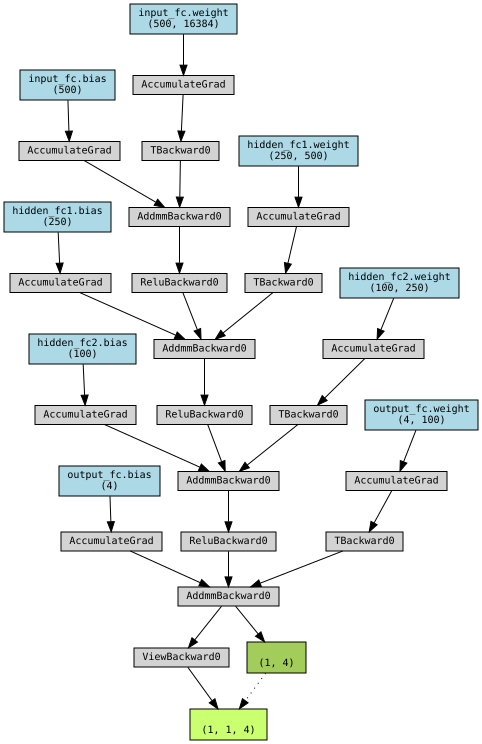

In [ ]:
x = torch.rand(1,1,128,128)
print(model(x))
y_pred = model(x)
make_dot((y_pred), params=dict(model.named_parameters()))

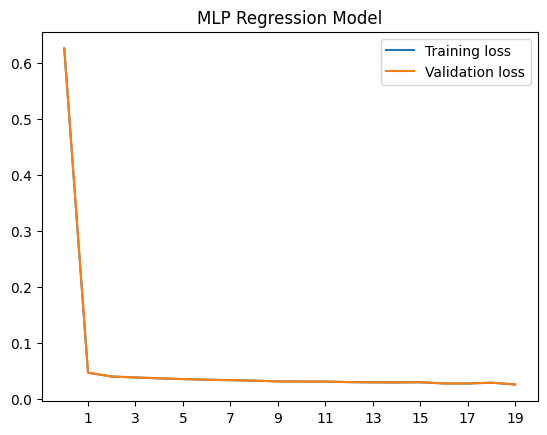

In [ ]:
plt.plot(train_df2['Training_Loss'], label='Training loss')
plt.plot(valid_df['Valid_Loss'], label='Validation loss')
plt.xticks(np.arange(1, 20, step=2))
plt.title('MLP Regression Model')
plt.legend()
plt.show()

In [ ]:
ExperimentLog.loc[len(ExperimentLog)] = [
    "16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4", 
    optim.Adam, 
    epochs, 
    loss_train_value, 
    time_train,
    loss_valid_value,
    time_valid, 
    test_loss,
    time_test
]

ExperimentLog 

,Architecture string,Optimizer,Epochs,Train MSE,Train Time,Valid MSE,Valid Time,Test MSE,Test Time
0,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.010483,361.498952,0.010483,32.077016,0.010468,1.918534
1,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.025642,159.189519,0.025642,27.570426,0.027871,1.779887


In [ ]:
#change prediction dataframe into numpy array so it works for image display
#drop column
pred_np = pred_df.drop('batch_number', axis=1)
pred_df  
#convert to numpy array
pred_np = pred_df.to_numpy()

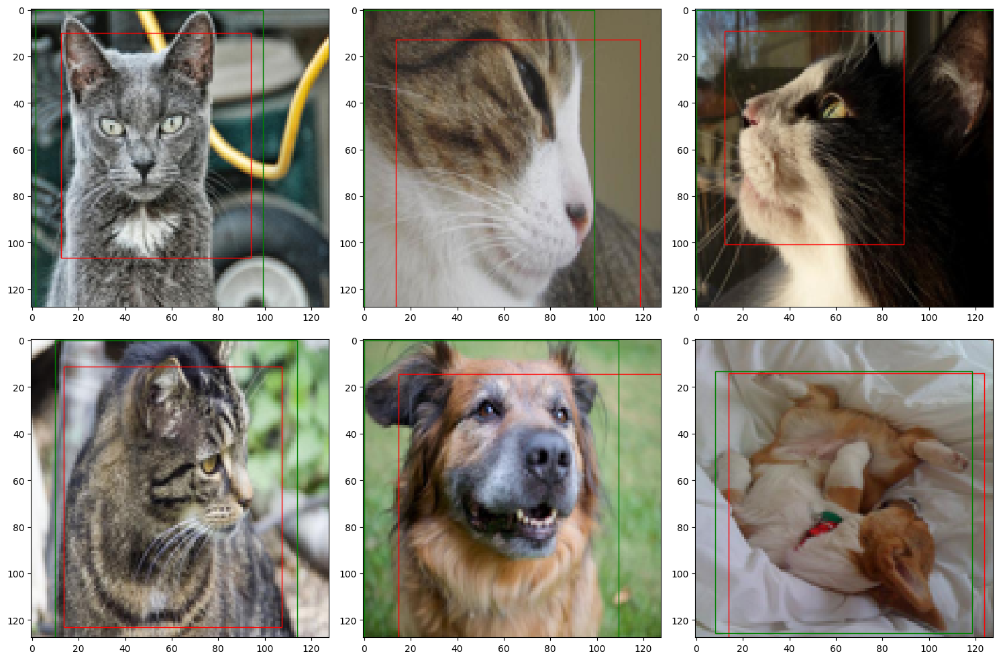

In [ ]:
# show image with predicted and true bounding boxes. 
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(X_test.shape[0], size=6, replace=False)):
    img = X_test_before_scaling[j].reshape(128,128,3) #img = X_test[j].reshape(128,128,3)
    coords = pred_np[j] * 128 #coords = y_pred[j] * 128
    coords_true = y_test_label[j] * 128
    ax[i].imshow(img)
    ##ax[i].set_title("Ground Truth: {0} \n Red: Predicted \n Green: True ".format(idx_to_label[y_test_label[j]]))
    ax[i].add_patch(plt.Rectangle((coords[0], coords[1]), 
                                  coords[2]-coords[0], coords[3]-coords[1], 
                                  edgecolor='red', facecolor='none'))
    ax[i].add_patch(plt.Rectangle((coords_true[0], coords_true[1]), 
                                  coords_true[2]-coords_true[0], coords_true[3]-coords_true[1], 
                                  edgecolor='green', facecolor='none'))
plt.tight_layout()
plt.show()

##3.9.4 Experiment 3: Regression MLP with Regularization

* Regression MLP:
  * Adam optimizer with weight decay of 0.01

In [ ]:
#Multi-layer perceptron (MLP) neural network

class MLP(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()

        self.input_fc = nn.Linear(input_dim, 500) 
        self.hidden_fc1 = nn.Linear(500, 250)
        self.hidden_fc2 = nn.Linear(250, 100)
        self.output_fc = nn.Linear(100, output_dim)

    def forward(self, x): #forward pass of MLP
        batch_size = x.shape[0] # x = [batch size, height, width]
        x = x.view(batch_size, -1) # x = [batch size, height * width] flattened input tensor
        h_1 = F.relu(self.input_fc(x)) # h_1 = [batch size, 500]
        h_2 = F.relu(self.hidden_fc1(h_1)) # h_2 = [batch size, 250]
        h_3 = F.relu(self.hidden_fc2(h_2)) # h_3 = [batch size, 100]
        y_pred = self.output_fc(h_3) # y_pred = [batch size, output dim]
        y_pred = y_pred.view(batch_size, -1, 4) # reshape output tensor into batch size, rows, columns
        return y_pred

In [ ]:
# input is 128 x 128 pixel size
# output is the 4 bounding box coordinates
INPUT_DIM = 128*128
OUTPUT_DIM = 4
# Run MLP model
model = MLP(INPUT_DIM, OUTPUT_DIM)

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
#number of trainable parameters often correlates with the model's capacity and ability to fit complex patterns in data.
print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 8,343,254 trainable parameters


In [ ]:
# Adam optimization algorithm
# model.paramters = returns an iterable of all the parameters in the model. optimizer uses these parameters to update the model.
# learning rate is set to 0.001
optimizer = optim.Adam(model.parameters(),lr=0.001, weight_decay=0.01) 

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') #set device to CPU or GPU

In [ ]:
# MSE loss function
# This will be used to calculate MSE loss between predicted and target in the forward pass then model parameters are updated to minimize MSE. 
criterion = nn.MSELoss() 

In [ ]:
#Make sure model and criterion are performed on the same device.
model = model.to(device)
criterion = criterion.to(device)

In [ ]:
next(model.parameters()).is_cuda #checks if tensor is located on GPU (CUDA)

False

In [ ]:
#Training
t1 = time.time()
outputs_list_training = []
epochs = 20 # Number of passes through the training data. 
for epoch in range(epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader_cadod, 0): #iterates over each batch of data
        inputs, labels = data
        optimizer.zero_grad() #set optimizer's gradients to zero (to clear previously computed gradients)
        outputs = model(inputs) #forward pass
        loss = criterion(outputs, labels) #calcuate loss
        loss.backward() #gradients of loss are computed
        optimizer.step() #update model parameters (w)
        running_loss += loss.item() #updates running loss by adding current batch loss
    print('Epoch {} loss: {}'.format(epoch + 1, running_loss / len(trainloader_cadod))) #training loss for epoch = running loss / number of batches in the epoch
    outputs_list_training.append([epoch + 1, running_loss / len(trainloader_cadod)])
time_train = time.time() - t1

Epoch 1 loss: 0.21847253029837327
Epoch 2 loss: 0.04410160749274142
Epoch 3 loss: 0.040402171804624444
Epoch 4 loss: 0.03942190198337331
Epoch 5 loss: 0.03851325174464899
Epoch 6 loss: 0.03679020702838898
Epoch 7 loss: 0.03852353266933385
Epoch 8 loss: 0.03583480351988007
Epoch 9 loss: 0.035041395793942845
Epoch 10 loss: 0.034342276699402756
Epoch 11 loss: 0.03364117103902733
Epoch 12 loss: 0.03363968366209198
Epoch 13 loss: 0.031603670076412314
Epoch 14 loss: 0.031158079228856984
Epoch 15 loss: 0.029645127737346816
Epoch 16 loss: 0.02956973071045735
Epoch 17 loss: 0.027144493973430467
Epoch 18 loss: 0.02651126408839927
Epoch 19 loss: 0.02695349121794981
Epoch 20 loss: 0.026717695900622535


In [ ]:
#Create a dataframe with predicted values and batch number
train_df2 = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Training_Loss'))
min_index = train_df2[['Training_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_train_value = train_df2.iloc[min_index, 1] #Get lowest MSE
epoch_train_value = train_df2.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
#Validation
t2 = time.time()
# Evaluate the model on the validation set
outputs_list_valid = []
epochs = 20 # Number of passes through the training data
model.eval()
with torch.no_grad():
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    for epoch in range(epochs):
        running_loss = 0.0
        for data in validloader_cadod:
            inputs, labels = data
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data,1)
            total_correct += (predicted == labels).sum().item()
            total_examples += len(inputs)
        print('Validation Loss: {}, Accuracy: {}'.format(total_loss / len(validloader_cadod), total_correct / total_examples))
        outputs_list_valid.append([epoch + 1, total_loss / len(validloader_cadod)])
time_valid = time.time() - t2

Validation Loss: 0.02741037832484359, Accuracy: 0.5749397590361446
Validation Loss: 0.054942467205581214, Accuracy: 0.5749397590361446
Validation Loss: 0.08245226856143702, Accuracy: 0.5749397590361446
Validation Loss: 0.11003316947746844, Accuracy: 0.5749397590361446
Validation Loss: 0.13752143315616108, Accuracy: 0.5749397590361446
Validation Loss: 0.16509249150043442, Accuracy: 0.5749397590361446
Validation Loss: 0.19260245401944434, Accuracy: 0.5749397590361446
Validation Loss: 0.220130531560807, Accuracy: 0.5749397590361446
Validation Loss: 0.24763869937686694, Accuracy: 0.5749397590361446
Validation Loss: 0.2752123207208656, Accuracy: 0.5749397590361446
Validation Loss: 0.3026947419913042, Accuracy: 0.5749397590361446
Validation Loss: 0.33019370381676016, Accuracy: 0.5749397590361446
Validation Loss: 0.35765793369639487, Accuracy: 0.5749397590361446
Validation Loss: 0.3851775730117446, Accuracy: 0.5749397590361446
Validation Loss: 0.41268453143891837, Accuracy: 0.5749397590361446

In [ ]:
#Create a dataframe with predicted values and batch number
valid_df = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Valid_Loss'))

In [ ]:
#Create a dataframe with predicted values and batch number
min_index = valid_df[['Valid_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_valid_value = valid_df.iloc[min_index, 1] #Get lowest MSE
epoch_valid_value = valid_df.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
# Test loop
t3 = time.time()
model.eval() #turn off batch normalization
with torch.no_grad(): #turn off gradient tracking
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    outputs_list = []
    label_list = []
    for i, data in enumerate(testloader_cadod): #batch size of 16
        inputs, labels = data
        label_list.append(labels)
        outputs = model(inputs) #forward pass
        outputs_np = np.array(outputs)
        #print(outputs)
        outputs_list.append(outputs_np)
        loss = criterion(outputs, labels) #calcuate loss
        total_loss += loss.item() #loss value is added to total loss
        predicted = torch.argmax(outputs, dim=1) #argmax sets largest value to 1 and all other values to 0. ##Change this. It is for classifcation not regression. 
        if i == len(testloader_cadod)-1:
            # Handle the last batch with a smaller size
            total_correct += (predicted[:len(inputs)] == labels).sum().item() #sum of correct predictions
            total_examples += len(inputs) # total number of examples processed
        else:
            total_correct += (predicted == labels).sum().item()
            total_examples += len(labels)
    print('Test Loss: {}, Accuracy: {}'.format(total_loss / len(testloader_cadod), total_correct / total_examples))
time_test = time.time() - t3

Test Loss: 0.028038522300238792, Accuracy: 0.6013878180416345


In [ ]:
#Create a dataframe with predicted values and batch number
pred_df = pd.DataFrame()
counter0 = 0
counter1 = 0
for i in outputs_list:
  counter0 = counter0+1
  for j in i:
    for k in j:
      pred_df.loc[counter1, 'XMin'] = k[0]
      pred_df.loc[counter1, 'XMax'] = k[1]
      pred_df.loc[counter1, 'YMin'] = k[2]
      pred_df.loc[counter1, 'YMax'] = k[3]
      pred_df.loc[counter1, 'batch_number'] = counter0
      counter1 = counter1 +1

In [ ]:
summary(model, (1,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 500]       8,192,500
            Linear-2                  [-1, 250]         125,250
            Linear-3                  [-1, 100]          25,100
            Linear-4                    [-1, 4]             404
Total params: 8,343,254
Trainable params: 8,343,254
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.06
Forward/backward pass size (MB): 0.01
Params size (MB): 31.83
Estimated Total Size (MB): 31.90
----------------------------------------------------------------


tensor([[[0.1270, 0.0913, 0.9934, 1.1073]]], grad_fn=<ViewBackward0>)


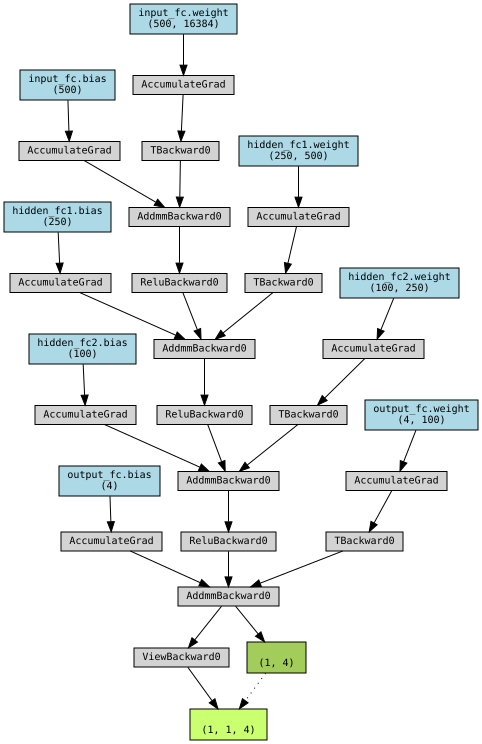

In [ ]:
from torchviz import make_dot
x = torch.rand(1,1,128,128)
print(model(x))
y_pred = model(x)
make_dot((y_pred), params=dict(model.named_parameters()))

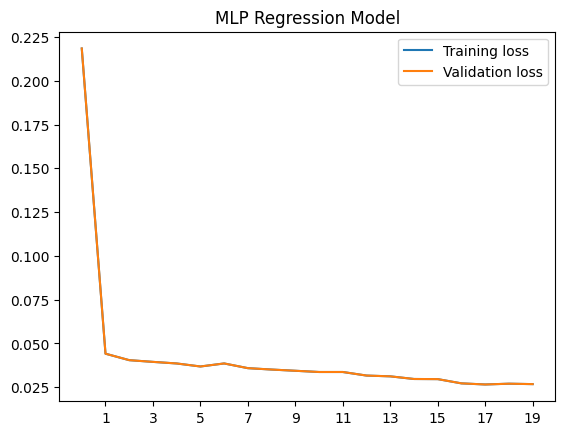

In [ ]:
plt.plot(train_df2['Training_Loss'], label='Training loss')
plt.plot(valid_df['Valid_Loss'], label='Validation loss')
plt.xticks(np.arange(1, 20, step=2))
plt.title('MLP Regression Model')
plt.legend()
plt.show()

In [ ]:
ExperimentLog.loc[len(ExperimentLog)] = [
    "16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4", 
    optim.Adam, 
    epochs, 
    loss_train_value, 
    time_train,
    loss_valid_value,
    time_valid, 
    test_loss,
    time_test
]

ExperimentLog 

,Architecture string,Optimizer,Epochs,Train MSE,Train Time,Valid MSE,Valid Time,Test MSE,Test Time
0,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.010483,361.498952,0.010483,32.077016,0.010468,1.918534
1,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.025642,159.189519,0.025642,27.570426,0.027871,1.779887
2,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.026511,158.842265,0.026511,26.908188,0.027871,1.277959


In [ ]:
#change prediction dataframe into numpy array so it works for image display
#drop column
pred_np = pred_df.drop('batch_number', axis=1)
pred_df  
#convert to numpy array
pred_np = pred_df.to_numpy()

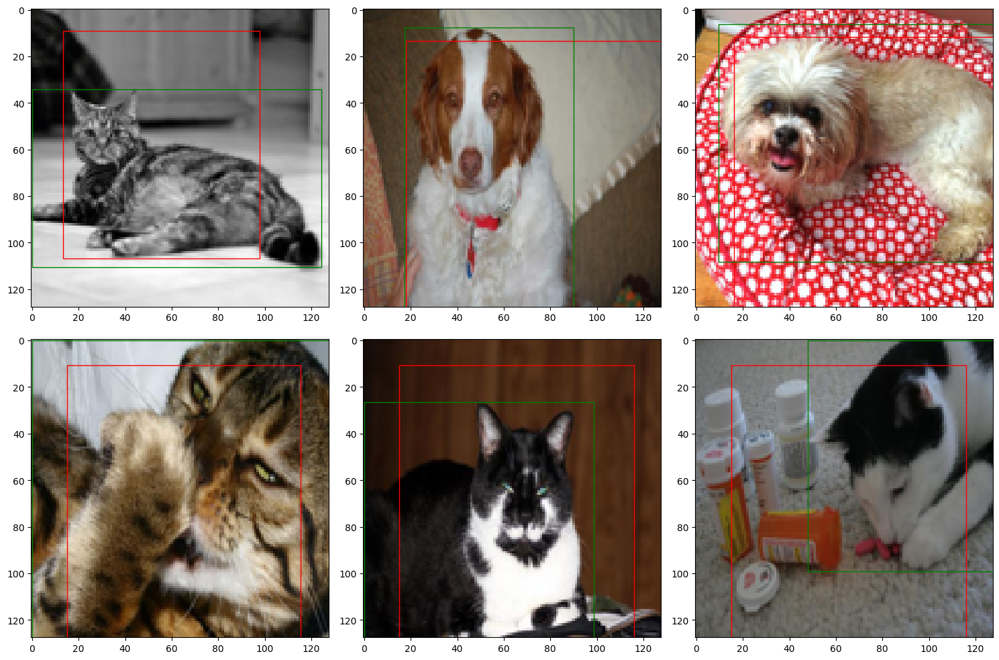

In [ ]:
# show image with predicted and true bounding boxes. 
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(X_test.shape[0], size=6, replace=False)):
    img = X_test_before_scaling[j].reshape(128,128,3) #img = X_test[j].reshape(128,128,3)
    coords = pred_np[j] * 128 #coords = y_pred[j] * 128
    coords_true = y_test_label[j] * 128
    ax[i].imshow(img)
    ##ax[i].set_title("Ground Truth: {0} \n Red: Predicted \n Green: True ".format(idx_to_label[y_test_label[j]]))
    ax[i].add_patch(plt.Rectangle((coords[0], coords[1]), 
                                  coords[2]-coords[0], coords[3]-coords[1], 
                                  edgecolor='red', facecolor='none'))
    ax[i].add_patch(plt.Rectangle((coords_true[0], coords_true[1]), 
                                  coords_true[2]-coords_true[0], coords_true[3]-coords_true[1], 
                                  edgecolor='green', facecolor='none'))
plt.tight_layout()
plt.show()

##3.9.5 Experiment 4: Regression MLP with SGD Optimizer

* Regression MLP:
  * SGD Optimzer

In [ ]:
# DataLoader - Iterate over training data by batches. 
#Batch size is large here because when I use a small batch size the model overfits on train and the bounding box stays in the same position. 
train_batch_size = 500 
valid_test_batch_size = 100 

trainloader_cadod = torch.utils.data.DataLoader(cadod_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_cadod = torch.utils.data.DataLoader(cadod_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_cadod = torch.utils.data.DataLoader(cadod_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2) #just added drop_last = True

In [ ]:
#Multi-layer perceptron (MLP) neural network
#
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()

        self.input_fc = nn.Linear(input_dim, 500) 
        self.hidden_fc1 = nn.Linear(500, 250)
        self.hidden_fc2 = nn.Linear(250, 100)
        self.output_fc = nn.Linear(100, output_dim)

    def forward(self, x): #forward pass of MLP
        batch_size = x.shape[0] # x = [batch size, height, width]
        x = x.view(batch_size, -1) # x = [batch size, height * width] flattened input tensor
        h_1 = F.relu(self.input_fc(x)) # h_1 = [batch size, 500]
        h_2 = F.relu(self.hidden_fc1(h_1)) # h_2 = [batch size, 250]
        h_3 = F.relu(self.hidden_fc2(h_2)) # h_3 = [batch size, 100]
        y_pred = self.output_fc(h_3) # y_pred = [batch size, output dim]
        y_pred = y_pred.view(batch_size, -1, 4) # reshape output tensor into batch size, rows, columns
        return y_pred

In [ ]:
# input is 128 x 128 pixel size
# output is the 4 bounding box coordinates
INPUT_DIM = 128*128
OUTPUT_DIM = 4
# Run MLP model
model = MLP(INPUT_DIM, OUTPUT_DIM)

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
#number of trainable parameters often correlates with the model's capacity and ability to fit complex patterns in data.
print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 8,343,254 trainable parameters


In [ ]:
# Adam optimization algorithm
# model.paramters = returns an iterable of all the parameters in the model. optimizer uses these parameters to update the model.
# learning rate is set to 0.001
optimizer = optim.SGD(model.parameters(),lr=0.001)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') #set device to CPU or GPU

In [ ]:
# MSE loss function
# This will be used to calculate MSE loss between predicted and target in the forward pass then model parameters are updated to minimize MSE. 
criterion = nn.MSELoss() 

In [ ]:
#Make sure model and criterion are performed on the same device.
model = model.to(device)
criterion = criterion.to(device)

In [ ]:
next(model.parameters()).is_cuda #checks if tensor is located on GPU (CUDA)

False

In [ ]:
#Training
t1 = time.time()
outputs_list_training = []
epochs = 20 # Number of passes through the training data. 
for epoch in range(epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader_cadod, 0): #iterates over each batch of data
        inputs, labels = data
        optimizer.zero_grad() #set optimizer's gradients to zero (to clear previously computed gradients)
        outputs = model(inputs) #forward pass
        loss = criterion(outputs, labels) #calcuate loss
        loss.backward() #gradients of loss are computed
        optimizer.step() #update model parameters (w)
        running_loss += loss.item() #updates running loss by adding current batch loss
    print('Epoch {} loss: {}'.format(epoch + 1, running_loss / len(trainloader_cadod))) #training loss for epoch = running loss / number of batches in the epoch
    outputs_list_training.append([epoch + 1, running_loss / len(trainloader_cadod)])
time_train = time.time() - t1

Epoch 1 loss: 0.41391129528774934
Epoch 2 loss: 0.3513409600538366
Epoch 3 loss: 0.2944147060899174
Epoch 4 loss: 0.2361056611818426
Epoch 5 loss: 0.1778239739291808
Epoch 6 loss: 0.1280435174703598
Epoch 7 loss: 0.09095955420942868
Epoch 8 loss: 0.06661160903818467
Epoch 9 loss: 0.05288900084355298
Epoch 10 loss: 0.045812801841427296
Epoch 11 loss: 0.0422561942216228
Epoch 12 loss: 0.040585422559696084
Epoch 13 loss: 0.03966370685135617
Epoch 14 loss: 0.03917987644672394
Epoch 15 loss: 0.03863335619954502
Epoch 16 loss: 0.038329887916060054
Epoch 17 loss: 0.03809409917277448
Epoch 18 loss: 0.03785799575202605
Epoch 19 loss: 0.037538218147614426
Epoch 20 loss: 0.03735294675125795


In [ ]:
#Create a dataframe with predicted values and batch number
train_df2 = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Training_Loss'))
min_index = train_df2[['Training_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_train_value = train_df2.iloc[min_index, 1] #Get lowest MSE
epoch_train_value = train_df2.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
# Evaluate the model on the validation set
t2 = time.time()
outputs_list_valid = []
epochs = 20 # Number of passes through the training data
model.eval()
with torch.no_grad():
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    for epoch in range(epochs):
        running_loss = 0.0
        for data in validloader_cadod:
            inputs, labels = data
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data,1)
            total_correct += (predicted == labels).sum().item()
            total_examples += len(inputs)
        print('Validation Loss: {}, Accuracy: {}'.format(total_loss / len(validloader_cadod), total_correct / total_examples))
        outputs_list_valid.append([epoch + 1, total_loss / len(validloader_cadod)])
time_valid = time.time() - t2

Validation Loss: 0.036292798284973414, Accuracy: 0.5749397590361446
Validation Loss: 0.07254204304800146, Accuracy: 0.5749397590361446
Validation Loss: 0.10879333636590413, Accuracy: 0.5749397590361446
Validation Loss: 0.1451247836507502, Accuracy: 0.5749397590361446
Validation Loss: 0.18137016599731787, Accuracy: 0.5749397590361446
Validation Loss: 0.21763471762339273, Accuracy: 0.5749397590361446
Validation Loss: 0.25397591700866107, Accuracy: 0.5749397590361446
Validation Loss: 0.29024855890089557, Accuracy: 0.5749397590361446
Validation Loss: 0.32647789855088505, Accuracy: 0.5749397590361446
Validation Loss: 0.3627292535134724, Accuracy: 0.5749397590361446
Validation Loss: 0.3989845023800929, Accuracy: 0.5749397590361446
Validation Loss: 0.43526503612242995, Accuracy: 0.5749397590361446
Validation Loss: 0.4713737243520362, Accuracy: 0.5749397590361446
Validation Loss: 0.5076671899961573, Accuracy: 0.5749397590361446
Validation Loss: 0.544041098760707, Accuracy: 0.5749397590361446
V

In [ ]:
#Create a dataframe with predicted values and batch number
valid_df = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Valid_Loss'))

In [ ]:
min_index = valid_df[['Valid_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_valid_value = valid_df.iloc[min_index, 1] #Get lowest MSE
epoch_valid_value = valid_df.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
# Test loop
t3 = time.time()
model.eval() #turn off batch normalization
with torch.no_grad(): #turn off gradient tracking
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    outputs_list = []
    label_list = []
    for i, data in enumerate(testloader_cadod): #batch size of 16
        inputs, labels = data
        label_list.append(labels)
        outputs = model(inputs) #forward pass
        outputs_np = np.array(outputs)
        #print(outputs)
        outputs_list.append(outputs_np)
        loss = criterion(outputs, labels) #calcuate loss
        total_loss += loss.item() #loss value is added to total loss
        predicted = torch.argmax(outputs, dim=1) #argmax sets largest value to 1 and all other values to 0. ##Change this. It is for classifcation not regression. 
        if i == len(testloader_cadod)-1:
            # Handle the last batch with a smaller size
            total_correct += (predicted[:len(inputs)] == labels).sum().item() #sum of correct predictions
            total_examples += len(inputs) # total number of examples processed
        else:
            total_correct += (predicted == labels).sum().item()
            total_examples += len(labels)
    test_loss = total_loss / len(testloader_cadod)
    print('Test Loss: {}, Accuracy: {}'.format(test_loss, total_correct / total_examples)) #print('Test Loss: {}, Accuracy: {}'.format(total_loss / len(testloader_cadod), total_correct / total_examples))
time_test = time.time() - t3

Test Loss: 0.03742650953622965, Accuracy: 0.6013878180416345


In [ ]:
#Create a dataframe with predicted values and batch number
pred_df = pd.DataFrame()
counter0 = 0
counter1 = 0
for i in outputs_list:
  counter0 = counter0+1
  for j in i:
    for k in j:
      pred_df.loc[counter1, 'XMin'] = k[0]
      pred_df.loc[counter1, 'XMax'] = k[1]
      pred_df.loc[counter1, 'YMin'] = k[2]
      pred_df.loc[counter1, 'YMax'] = k[3]
      pred_df.loc[counter1, 'batch_number'] = counter0
      counter1 = counter1 +1

In [ ]:
summary(model, (1,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 500]       8,192,500
            Linear-2                  [-1, 250]         125,250
            Linear-3                  [-1, 100]          25,100
            Linear-4                    [-1, 4]             404
Total params: 8,343,254
Trainable params: 8,343,254
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.06
Forward/backward pass size (MB): 0.01
Params size (MB): 31.83
Estimated Total Size (MB): 31.90
----------------------------------------------------------------


tensor([[[0.1231, 0.0963, 0.9427, 1.0161]]], grad_fn=<ViewBackward0>)


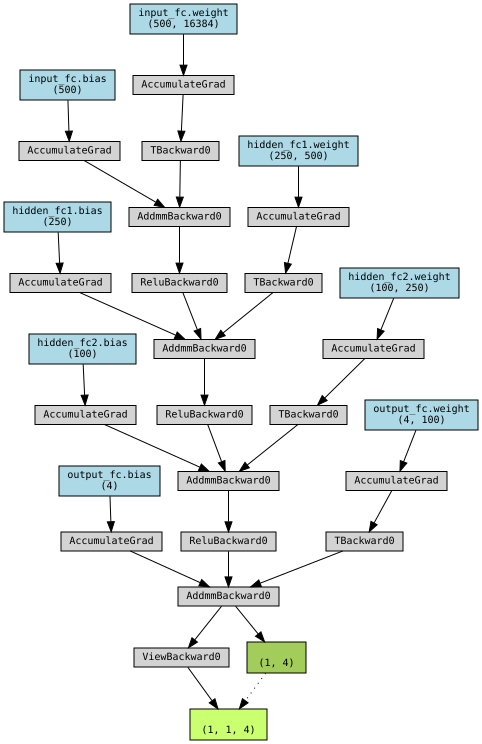

In [ ]:
x = torch.rand(1,1,128,128)
print(model(x))
y_pred = model(x)
make_dot((y_pred), params=dict(model.named_parameters()))

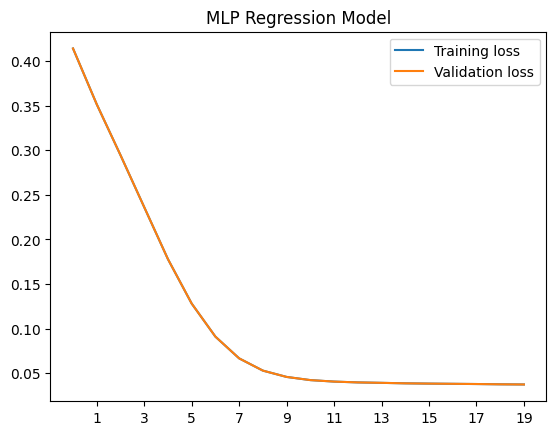

In [ ]:
plt.plot(train_df2['Training_Loss'], label='Training loss')
plt.plot(valid_df['Valid_Loss'], label='Validation loss')
plt.xticks(np.arange(1, 20, step=2))
plt.title('MLP Regression Model')
plt.legend()
plt.show()

In [ ]:
#change prediction dataframe into numpy array so it works for image display
#drop column
pred_np = pred_df.drop('batch_number', axis=1)
pred_df  
#convert to numpy array
pred_np = pred_df.to_numpy()

In [ ]:
ExperimentLog.loc[len(ExperimentLog)] = [
    "16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4", 
    optim.SGD, 
    epochs, 
    loss_train_value, 
    time_train,
    loss_valid_value,
    time_valid, 
    test_loss,
    time_test
]

ExperimentLog 

,Architecture string,Optimizer,Epochs,Train MSE,Train Time,Valid MSE,Valid Time,Test MSE,Test Time
0,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.010483,361.498952,0.010483,32.077016,0.010468,1.918534
1,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.025642,159.189519,0.025642,27.570426,0.027871,1.779887
2,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.026511,158.842265,0.026511,26.908188,0.027871,1.277959
3,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.sgd.SGD'>,20,0.037353,143.831441,0.037353,37.445805,0.037427,2.238289


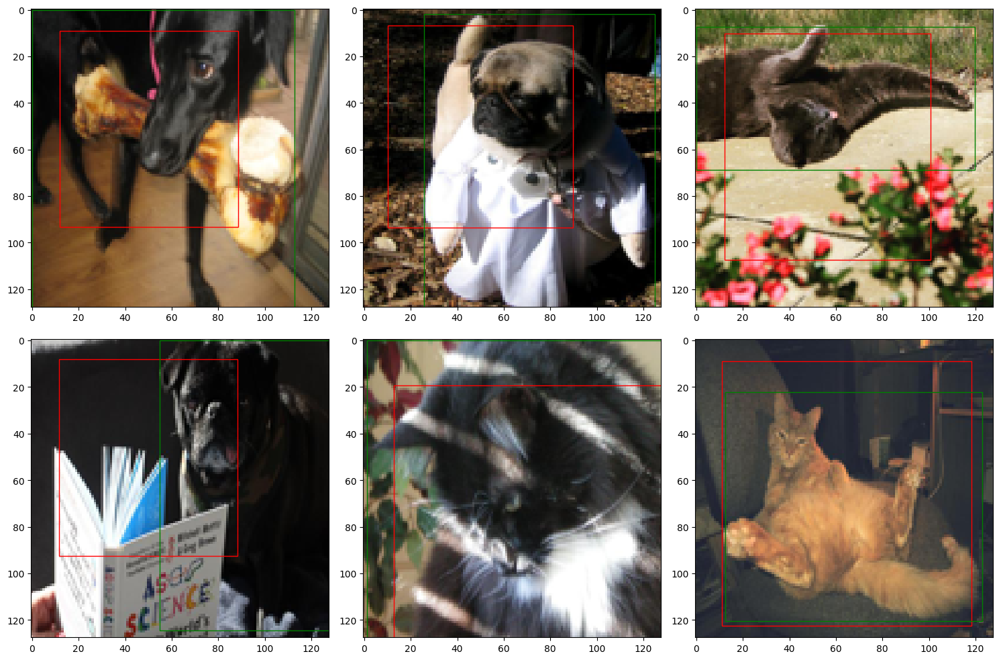

In [ ]:
# show image with predicted and true bounding boxes. 
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(X_test.shape[0], size=6, replace=False)):
    img = X_test_before_scaling[j].reshape(128,128,3) #img = X_test[j].reshape(128,128,3)
    coords = pred_np[j] * 128 #coords = y_pred[j] * 128
    coords_true = y_test_label[j] * 128
    ax[i].imshow(img)
    ##ax[i].set_title("Ground Truth: {0} \n Red: Predicted \n Green: True ".format(idx_to_label[y_test_label[j]]))
    ax[i].add_patch(plt.Rectangle((coords[0], coords[1]), 
                                  coords[2]-coords[0], coords[3]-coords[1], 
                                  edgecolor='red', facecolor='none'))
    ax[i].add_patch(plt.Rectangle((coords_true[0], coords_true[1]), 
                                  coords_true[2]-coords_true[0], coords_true[3]-coords_true[1], 
                                  edgecolor='green', facecolor='none'))
plt.tight_layout()
plt.show()

##3.9.6 Experiment 5: Regression MLP with rotation augmentation

* Regression MLP with augmentation:
  * 90 degree rotation on 10% of the training images and the bounding box coodinates are updated

In [ ]:
#colab_path = '/content/drive/MyDrive/MLProject/aml/data/martin'
#X = np.load(colab_path + '/img.npy', allow_pickle=True)
#y_label = np.load(colab_path + '/y_label.npy', allow_pickle=True)
#y_bbox = np.load(colab_path + '/y_bbox.npy', allow_pickle=True)

colab_path = '/content/drive/MyDrive/Data_Science_Final/aml'

X = np.load('/content/drive/MyDrive/Data_Science_Final/aml/data/img.npy', allow_pickle=True)
y_label = np.load('/content/drive/MyDrive/Data_Science_Final/aml/data/y_label.npy', allow_pickle=True)
y_bbox = np.load('/content/drive/MyDrive/Data_Science_Final/aml/data/y_bbox.npy', allow_pickle=True)

In [ ]:
X_train, X_test, y_train, y_test_label = train_test_split(X, y_bbox, test_size=0.2, random_state=42, shuffle=True)
#Validation
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42, shuffle=True)

In [ ]:
#reshape
#for example train is reshaped to 8297, 128, 128, 3 
#which is number of images (8297), pixel dimension 128 x 128, then 3 for RBG

X_train = X_train.reshape((-1, 128, 128, 3)).astype(np.uint8)
X_valid = X_valid.reshape((-1, 128, 128, 3)).astype(np.uint8)
X_test = X_test.reshape((-1, 128, 128, 3)).astype(np.uint8)

In [ ]:
#Function to rotate image and update bounding box
def rotate90Deg(bndbox, img_width): # just passing width of image is enough for 90 degree rotation.
   x_min,y_min,x_max,y_max = bndbox
   x_min = x_min*128
   y_min = y_min*128
   x_max = x_max*128
   y_max = y_max*128
   new_xmin = y_min
   new_ymin = img_width-x_max
   new_xmax = y_max
   new_ymax = img_width-x_min
   #Normalize
   new_xmin = new_xmin / 128
   new_ymin = new_ymin / 128
   new_xmax = new_xmax / 128
   new_ymax = new_ymax / 128
   return [new_xmin, new_ymin,new_xmax,new_ymax]

In [ ]:
#Create list 0 to 8296.
#Select 10% of the list. 
#These are the index numbers I will use to do augmentation.
end_num = X_train.shape[0] #rows in X_train
num_list = list(range(0, end_num)) #create list 0 to 8296 (equivalent to rows in X_train)

In [ ]:
#Randomly choose 10% of the training data for augmentation
k_num = round(.2*len(num_list))
rand_list = random.choices(num_list, k=k_num)

In [ ]:
from numpy import asarray
# For each X_train image in the list, tranform it then replace the original.  
# For each y_train bounding box, tranform it then replace the original. 
for i in rand_list:
  #X_train augmentation
  pil_image = Image.fromarray(X_train[i]) #array to image
  image_tran = transforms.functional.rotate(angle=90, img =pil_image) #rotate image
  numpydata = asarray(image_tran) #Change the image back to array
  X_train[i] = numpydata #Replace original image
  #y_train bounding box update after rotation
  y_train_new = rotate90Deg(y_train[i],128) #update bounding box using rotate90Deg function
  y_train[i] = y_train_new #update y_test with rotated bounding box coordinates. 

In [ ]:
'''
transform_gray for grayscale images
'''
#Note: Removed image rotation and cropping because we would need to also update the bounding boxes
transform_gray = transforms.Compose([
    transforms.Grayscale(num_output_channels=1), # convert to grayscale
    transforms.ToTensor()
])

In [ ]:
# Apply transform_gray

X_train_transformed = []
for image in X_train:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_train_transformed.append(transformed_image)

X_valid_transformed = []
for image in X_valid:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_valid_transformed.append(transformed_image)

X_test_transformed = []
for image in X_test:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_test_transformed.append(transformed_image)

In [ ]:
X_train_transformed[1].shape

torch.Size([1, 128, 128])

In [ ]:
# Creates tensor from numpy
y_train_tensor = torch.from_numpy(y_train)
y_valid_tensor = torch.from_numpy(y_valid)
y_test_tensor = torch.from_numpy(y_test_label)

In [ ]:
def is_pytorch_dataset(obj):
    return isinstance(obj, Dataset)

In [ ]:
if is_pytorch_dataset(X_train_transformed):
    print('The input dataset is a PyTorch dataset.')
else:
    print('The input dataset is not a PyTorch dataset.')

The input dataset is not a PyTorch dataset.


In [ ]:
'''
class PyTorchDataset(Dataset) is used to transform data into Pytorch dataset
'''

class PyTorchDataset(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x = self.X[idx]
        y = self.y[idx]

        if self.transform:
            x = self.transform(x)

        return x, y

In [ ]:
cadod_train = PyTorchDataset(X_train_transformed, y_train_tensor)
cadod_valid = PyTorchDataset(X_valid_transformed, y_valid_tensor)
cadod_test = PyTorchDataset(X_test_transformed, y_test_tensor)

In [ ]:
if is_pytorch_dataset(cadod_train):
    print('The input dataset is a PyTorch dataset.')
else:
    print('The input dataset is not a PyTorch dataset.')

The input dataset is a PyTorch dataset.


In [ ]:
# DataLoader - Iterate over training data by batches. 
#Batch size is large here because when I use a small batch size the model overfits on train and the bounding box stays in the same position. 
train_batch_size = 96 
valid_test_batch_size = 32 

trainloader_cadod = torch.utils.data.DataLoader(cadod_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_cadod = torch.utils.data.DataLoader(cadod_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_cadod = torch.utils.data.DataLoader(cadod_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2) #just added drop_last = True

In [ ]:
#Multi-layer perceptron (MLP) neural network
#
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()

        self.input_fc = nn.Linear(input_dim, 500) 
        self.hidden_fc1 = nn.Linear(500, 250)
        self.hidden_fc2 = nn.Linear(250, 100)
        self.output_fc = nn.Linear(100, output_dim)

    def forward(self, x): #forward pass of MLP
        batch_size = x.shape[0] # x = [batch size, height, width]
        x = x.view(batch_size, -1) # x = [batch size, height * width] flattened input tensor
        h_1 = F.relu(self.input_fc(x)) # h_1 = [batch size, 500]
        h_2 = F.relu(self.hidden_fc1(h_1)) # h_2 = [batch size, 250]
        h_3 = F.relu(self.hidden_fc2(h_2)) # h_3 = [batch size, 100]
        y_pred = self.output_fc(h_3) # y_pred = [batch size, output dim]
        y_pred = y_pred.view(batch_size, -1, 4) # reshape output tensor into batch size, rows, columns
        return y_pred

In [ ]:
# input is 128 x 128 pixel size
# output is the 4 bounding box coordinates
INPUT_DIM = 128*128 
OUTPUT_DIM = 4
# Run MLP model
model = MLP(INPUT_DIM, OUTPUT_DIM)

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
#number of trainable parameters often correlates with the model's capacity and ability to fit complex patterns in data.
print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 8,343,254 trainable parameters


In [ ]:
# Adam optimization algorithm
# model.paramters = returns an iterable of all the parameters in the model. optimizer uses these parameters to update the model.
# learning rate is set to 0.001
optimizer = optim.Adam(model.parameters(),lr=0.001) 

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') #set device to CPU or GPU

In [ ]:
# MSE loss function
# This will be used to calculate MSE loss between predicted and target in the forward pass then model parameters are updated to minimize MSE. 
criterion = nn.MSELoss() 

In [ ]:
#Make sure model and criterion are performed on the same device.
model = model.to(device)
criterion = criterion.to(device)

In [ ]:
next(model.parameters()).is_cuda #checks if tensor is located on GPU (CUDA)

False

In [ ]:
#Training
t1 = time.time()
outputs_list_training = []
epochs = 20 # Number of passes through the training data. 
for epoch in range(epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader_cadod, 0): #iterates over each batch of data
        inputs, labels = data
        optimizer.zero_grad() #set optimizer's gradients to zero (to clear previously computed gradients)
        outputs = model(inputs) #forward pass
        loss = criterion(outputs, labels) #calcuate loss
        loss.backward() #gradients of loss are computed
        optimizer.step() #update model parameters (w)
        running_loss += loss.item() #updates running loss by adding current batch loss
    print('Epoch {} loss: {}'.format(epoch + 1, running_loss / len(trainloader_cadod))) #training loss for epoch = running loss / number of batches in the epoch
    outputs_list_training.append([epoch + 1, running_loss / len(trainloader_cadod)])
time_train = time.time() - t1

Epoch 1 loss: 0.10903756900679791
Epoch 2 loss: 0.03347165981072119
Epoch 3 loss: 0.030540009403879614
Epoch 4 loss: 0.02582595221184451
Epoch 5 loss: 0.02349327964943716
Epoch 6 loss: 0.020122996499312335
Epoch 7 loss: 0.017917439951721965
Epoch 8 loss: 0.016617170449389124
Epoch 9 loss: 0.0150675388245747
Epoch 10 loss: 0.013652479211831915
Epoch 11 loss: 0.012982322416942695
Epoch 12 loss: 0.012147294539401585
Epoch 13 loss: 0.011495013357322106
Epoch 14 loss: 0.01132390052936543
Epoch 15 loss: 0.01102126042904525
Epoch 16 loss: 0.011094354906643945
Epoch 17 loss: 0.010884447301598802
Epoch 18 loss: 0.010767561008875397
Epoch 19 loss: 0.0108108418383475
Epoch 20 loss: 0.010829400410340435


In [ ]:
#Create a dataframe with predicted values and batch number
train_df2 = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Training_Loss'))
min_index = train_df2[['Training_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_train_value = train_df2.iloc[min_index, 1] #Get lowest MSE
epoch_train_value = train_df2.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
#Validation
# Evaluate the model on the validation set
t2 = time.time()
outputs_list_valid = []
epochs = 20 # Number of passes through the training data
model.eval()
with torch.no_grad():
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    for epoch in range(epochs):
        running_loss = 0.0
        for data in validloader_cadod:
            inputs, labels = data
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data,1)
            total_correct += (predicted == labels).sum().item()
            total_examples += len(inputs)
        print('Validation Loss: {}, Accuracy: {}'.format(total_loss / len(validloader_cadod), total_correct / total_examples))
        outputs_list_valid.append([epoch + 1, total_loss / len(validloader_cadod)])
time_valid = time.time() - t2

Validation Loss: 0.010343295937547316, Accuracy: 0.5749397590361446
Validation Loss: 0.020680044276209977, Accuracy: 0.5749397590361446
Validation Loss: 0.03101889476753198, Accuracy: 0.5749397590361446
Validation Loss: 0.04136002675558512, Accuracy: 0.5749397590361446
Validation Loss: 0.05169787742913916, Accuracy: 0.5749397590361446
Validation Loss: 0.06204116109472055, Accuracy: 0.5749397590361446
Validation Loss: 0.0723832542076707, Accuracy: 0.5749397590361446
Validation Loss: 0.08272437043488026, Accuracy: 0.5749397590361446
Validation Loss: 0.09306737905224928, Accuracy: 0.5749397590361446
Validation Loss: 0.10341212005855946, Accuracy: 0.5749397590361446
Validation Loss: 0.11375263647821088, Accuracy: 0.5749397590361446
Validation Loss: 0.12409464681807619, Accuracy: 0.5749397590361446
Validation Loss: 0.13442939748414434, Accuracy: 0.5749397590361446
Validation Loss: 0.14476327709853648, Accuracy: 0.5749397590361446
Validation Loss: 0.1551042863382743, Accuracy: 0.574939759036

In [ ]:
#Create a dataframe with predicted values and batch number
valid_df = pd.DataFrame(outputs_list_training, columns = ('Epochs', 'Valid_Loss'))

In [ ]:
#Create a dataframe with predicted values and batch number (for plotting)
min_index = valid_df[['Valid_Loss']].idxmin() #get lowest MSE index
min_index = min_index[0] #get index number
loss_valid_value = valid_df.iloc[min_index, 1] #Get lowest MSE
epoch_valid_value = valid_df.iloc[min_index, 0] #Get epoch for lowest MSE

In [ ]:
# Test loop
t3 = time.time()
model.eval() #turn off batch normalization
with torch.no_grad(): #turn off gradient tracking
    total_loss = 0.0
    total_correct = 0
    total_examples = 0
    outputs_list = []
    label_list = []
    for i, data in enumerate(testloader_cadod): #batch size of 16
        inputs, labels = data
        label_list.append(labels)
        outputs = model(inputs) #forward pass
        outputs_np = np.array(outputs)
        #print(outputs)
        outputs_list.append(outputs_np)
        loss = criterion(outputs, labels) #calcuate loss
        total_loss += loss.item() #loss value is added to total loss
        predicted = torch.argmax(outputs, dim=1) #argmax sets largest value to 1 and all other values to 0. ##Change this. It is for classifcation not regression. 
        if i == len(testloader_cadod)-1:
            # Handle the last batch with a smaller size
            total_correct += (predicted[:len(inputs)] == labels).sum().item() #sum of correct predictions
            total_examples += len(inputs) # total number of examples processed
        else:
            total_correct += (predicted == labels).sum().item()
            total_examples += len(labels)
    test_loss = total_loss / len(testloader_cadod)
    print('Test Loss: {}, Accuracy: {}'.format(test_loss, total_correct / total_examples)) #print('Test Loss: {}, Accuracy: {}'.format(total_loss / len(testloader_cadod), total_correct / total_examples))
time_test = time.time() - t3

Test Loss: 0.010535616518520727, Accuracy: 0.6013878180416345


In [ ]:
#Create a dataframe with predicted values and batch number (for visualization)
pred_df = pd.DataFrame()
counter0 = 0
counter1 = 0
for i in outputs_list:
  counter0 = counter0+1
  for j in i:
    for k in j:
      pred_df.loc[counter1, 'XMin'] = k[0]
      pred_df.loc[counter1, 'XMax'] = k[1]
      pred_df.loc[counter1, 'YMin'] = k[2]
      pred_df.loc[counter1, 'YMax'] = k[3]
      pred_df.loc[counter1, 'batch_number'] = counter0
      counter1 = counter1 +1

In [ ]:
from torchsummary import summary
summary(model, (1,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 500]       8,192,500
            Linear-2                  [-1, 250]         125,250
            Linear-3                  [-1, 100]          25,100
            Linear-4                    [-1, 4]             404
Total params: 8,343,254
Trainable params: 8,343,254
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.06
Forward/backward pass size (MB): 0.01
Params size (MB): 31.83
Estimated Total Size (MB): 31.90
----------------------------------------------------------------


tensor([[[0.1002, 0.0852, 0.9132, 0.9212]]], grad_fn=<ViewBackward0>)


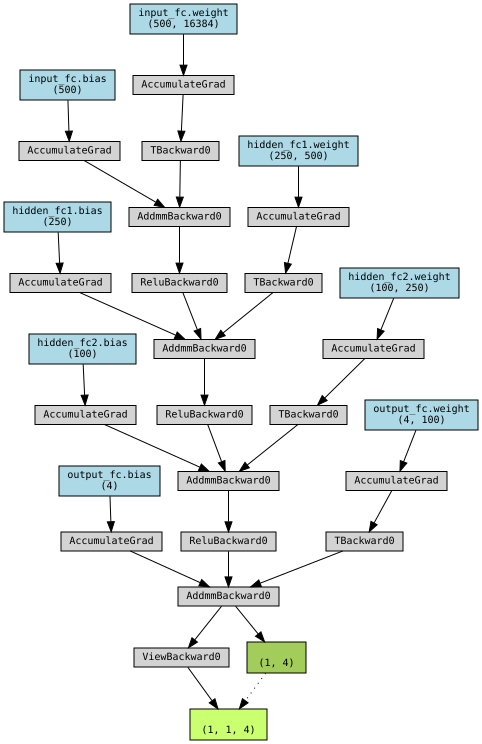

In [ ]:
from torchviz import make_dot
x = torch.rand(1,1,128,128)
print(model(x))
y_pred = model(x)
make_dot((y_pred), params=dict(model.named_parameters()))

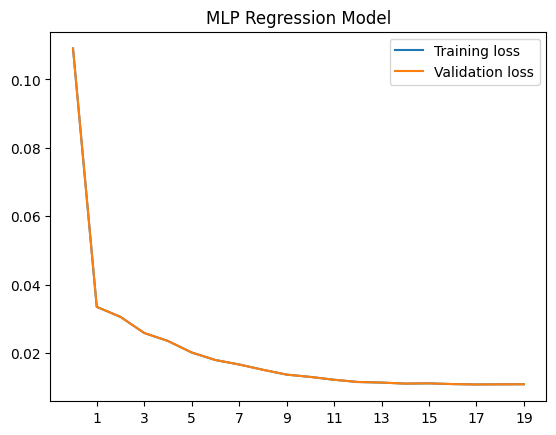

In [ ]:
plt.plot(train_df2['Training_Loss'], label='Training loss')
plt.plot(valid_df['Valid_Loss'], label='Validation loss')
plt.xticks(np.arange(1, 20, step=2))
plt.title('MLP Regression Model')
plt.legend()
plt.show()

In [ ]:
ExperimentLog.loc[len(ExperimentLog)] = [
    "16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4", 
    optim.Adam, 
    epochs, 
    loss_train_value, 
    time_train,
    loss_valid_value,
    time_valid, 
    test_loss,
    time_test
]

ExperimentLog 

,Architecture string,Optimizer,Epochs,Train MSE,Train Time,Valid MSE,Valid Time,Test MSE,Test Time
0,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.010483,361.498952,0.010483,32.077016,0.010468,1.918534
1,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.025642,159.189519,0.025642,27.570426,0.027871,1.779887
2,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.026511,158.842265,0.026511,26.908188,0.027871,1.277959
3,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.sgd.SGD'>,20,0.037353,143.831441,0.037353,37.445805,0.037427,2.238289
4,"16,384 - 500 - 500 - 250 - 250 - 100 - 100 - 4",<class 'torch.optim.adam.Adam'>,20,0.010768,359.017292,0.010768,39.251943,0.010536,2.258541


In [ ]:
#change prediction dataframe into numpy array so it works for image display
#drop column
pred_np = pred_df.drop('batch_number', axis=1)
pred_df  
#convert to numpy array
pred_np = pred_df.to_numpy()

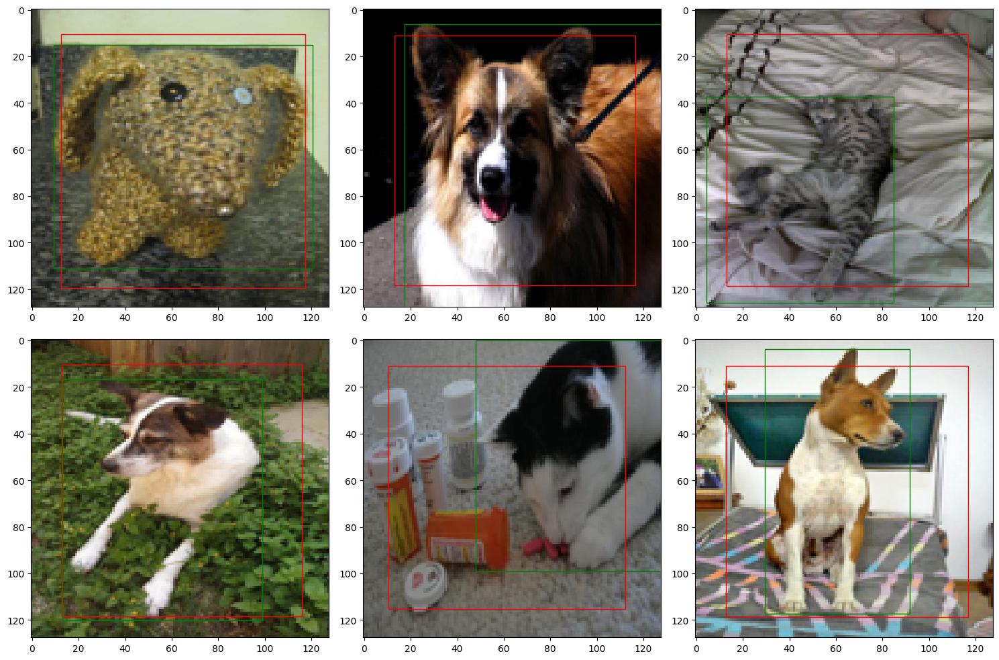

In [ ]:
# show image with predicted and true bounding boxes. 
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(X_test.shape[0], size=6, replace=False)):
    img = X_test_before_scaling[j].reshape(128,128,3) #img = X_test[j].reshape(128,128,3)
    coords = pred_np[j] * 128 #coords = y_pred[j] * 128
    coords_true = y_test_label[j] * 128
    ax[i].imshow(img)
    ##ax[i].set_title("Ground Truth: {0} \n Red: Predicted \n Green: True ".format(idx_to_label[y_test_label[j]]))
    ax[i].add_patch(plt.Rectangle((coords[0], coords[1]), 
                                  coords[2]-coords[0], coords[3]-coords[1], 
                                  edgecolor='red', facecolor='none'))
    ax[i].add_patch(plt.Rectangle((coords_true[0], coords_true[1]), 
                                  coords_true[2]-coords_true[0], coords_true[3]-coords_true[1], 
                                  edgecolor='green', facecolor='none'))
plt.tight_layout()
plt.show()

##3.9.7 Pytorch MLP Regression Results and Discussion

**Results:**
The regression model was built to predict an accurate bounding box around a cat or dog in an image. We accomplished this by building a multilayer perceptron (MLP) regression model. We conducted four experiments to optimize the models: 
1. Regression Baseline:
  * Training batch size of 96 and test batch size of 32
  * Adam optimizer
2. Regression with bigger batch size:
  * Training batch size of 500 and test batch size of 100
3. Regression with regularization:
  * Adam optimizer with weight decay of 0.01
4. Regression with SGD optimizer
5. Regression with 90 degree rotation augmentation. 
  * 90 degree rotation applied to 10% of the training data.

The first model using an adam optimizer with a training batch size of 96 and a test batch size of 32 had the highest performance with a test MSE of 0.01. For this model, the bounding boxes were located in the same position due to over fitting on the training set. Increasing the batch size led to a higher test MSE of 0.02, but the images moved to new positions for the test bounding box results. Adding regularization (weight decay) of 0.01 did not change the MSE. Changing the optimizer to SGD led to a higher test MSE of 0.038.
 

**Discussion:**
After performing exploratory data analysis, we found that most image bounding boxes are located near the edge of the image (XMin near 0, XMax near 1, YMin near 0, YMax near 1). The XMin and XMax and is a numeric value between 0 and 1 where 0 is the leftmost pixel and 1 is the rightmost pixel in the image. YMin and YMax go from the top pixel (0) to the bottom pixel (1). This means that the model will train on images with a high proportion of bounding boxes in this position. Augmentation is necessary to vary the image position and allow the model to train on a greater variety of bounding box positions. A 90 degree rotation was applied to 10% of the training data, which was not enough to improve over fitting on small training batches. Augmentation to move the images off center would improve the performance of the model. There are python packages to perform augmentation such as imgaug, but we were unable to get it working. We wrote a custom function to rotate 10% of the images in the training set and update bounding boxes with the new coordinates.

We found that all of our results had low MSE scores indicating that the model performed well. After researching, we concluded that alternative methods to calculate accuracy would benefit our analysis. The method we found is called intersection over union. This method measures the union of the predicted bounding box with the true bounding box. After researching machine learning techniques, we found that linear regression MLP is not the optimal model for predicting bounding boxes. For future analysis, we would be interested in potentially trying Region Based Convolutional Neural Networks (R-CNN). This is a machine learning model for computer vision and specifically object detection.

#3.10 PyTorch CNN with multi-head object detection

Primarily due to running out of time (learning CNNs, having issues with how to correctly process and load both input and target data) and partly also because I TAs were not available to provide feedback during the weekend, I was not able to finish the Multi-head object CNN in PyTorch OOP and instead, I focused at least on creating a functioning CNN for classification alone.

-Martin

This CNN uses CXE as a loss function for the classification and MSE for evaluating predictions of the boundary box. SGD was selected as model optimizor.

The code below is based on these resources:

*   https://blog.paperspace.com/writing-cnns-from-scratch-in-pytorch/
*   https://blog.paperspace.com/object-localization-pytorch-2/


##3.10.1 Loading data

In [ ]:
# Load the data from shared Google Drive
colab_path = '/content/drive/MyDrive/aml/aml'

X = np.load('/content/drive/MyDrive/aml/aml/data/img.npy', allow_pickle=True)
y_label = np.load('/content/drive/MyDrive/aml/aml/data/y_label.npy', allow_pickle=True)
y_bbox = np.load('/content/drive/MyDrive/aml/aml/data/y_bbox.npy', allow_pickle=True)

In [ ]:
# Create training and testing sets: 80 to 20%
# Loading both 2 types of target variables
X_train, X_test, y_train_label, y_test_label, y_train, y_test = train_test_split(X, y_label, y_bbox, test_size=0.2, random_state=42, shuffle=True)

# From training set, create training and validation sets: 80 to 20%
# Loading both 2 types of target variables
X_train, X_valid, y_train_label, y_valid_label, y_train, y_valid = train_test_split(X_train, y_train_label, y_train, test_size=0.2, random_state=42, shuffle=True)

##3.10.2 Transforming and preparing data

In [ ]:
X_train.shape

(8297, 49152)

In [ ]:
X_valid.shape

(2075, 49152)

In [ ]:
X_test.shape

(2594, 49152)

In [ ]:
print(X_train)

[[180 175 170 ... 100  65  69]
 [230 209 226 ... 241 217 231]
 [198 213 163 ...  48  38  36]
 ...
 [175 172 157 ... 141 106  86]
 [208 210 141 ...  54  51  12]
 [228 237 234 ...  87 106 119]]


In [ ]:
# Verifyication the label target variables are available
print(y_train_label)

[0 1 0 ... 1 1 1]


In [ ]:
# Verifyication the box coordinates target variables are available
print(y_train)

[[0.073491 0.009926 0.794401 0.853598]
 [0.046784 0.026374 0.94152  0.838462]
 [0.15125  0.       0.999375 0.999062]
 ...
 [0.019816 0.018555 0.928521 0.999023]
 [0.       0.       0.8975   0.999059]
 [0.21875  0.       0.999375 0.999056]]


In [ ]:
X_train = X_train.reshape((-1, 128, 128, 3))
X_valid = X_valid.reshape((-1, 128, 128, 3))
X_test = X_test.reshape((-1, 128, 128, 3))

In [ ]:
'''
transform_gray to create grayscale images.
I decided to skip the other data/image augmenting steps.
'''

transform_gray = transforms.Compose([
    # transforms.CenterCrop(100), # Crop images to center
    # transforms.RandomHorizontalFlip(p=0.5), # Probability range 0 to 1
    # transforms.RandomRotation(degrees=(60, 90)),
    transforms.Grayscale(num_output_channels=1), # convert to grayscale
    transforms.ToTensor()
])

In [ ]:
# Apply transform_gray

X_train_transformed = []
for image in X_train:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_train_transformed.append(transformed_image)

X_valid_transformed = []
for image in X_valid:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_valid_transformed.append(transformed_image)

X_test_transformed = []
for image in X_test:
    pil_image = Image.fromarray(image)
    transformed_image = transform_gray(pil_image)
    X_test_transformed.append(transformed_image)

In [ ]:
X_train_transformed[1].shape

torch.Size([1, 128, 128])

In [ ]:
'''
class PyTorchDataset(Dataset) is used to transform data into Pytorch dataset
'''

class PyTorchDataset(Dataset):
    def __init__(self, X, y, z, transform=None):
        self.X = X
        self.y = y
        self.z = z
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x = self.X[idx]
        y = self.y[idx]
        z = self.z[idx]

        if self.transform:
            x = self.transform(x)

        return x, y, z

In [ ]:
# Create PyTorch objects from y coordinates of the bounding box
y_train_tensor = torch.from_numpy(y_train)
y_valid_tensor = torch.from_numpy(y_valid)
y_test_tensor = torch.from_numpy(y_test_label)

# Create PyTorch objects from y labels
y_train_label_tensor = torch.from_numpy(y_train_label)
y_valid_label_tensor = torch.from_numpy(y_valid_label)
y_test_label_tensor = torch.from_numpy(y_test_label)

In [ ]:
# Transforming data into tensors via a homegrown transformer method
cadod_train = PyTorchDataset(X_train_transformed, y_train_label_tensor, y_train_tensor)
cadod_valid = PyTorchDataset(X_valid_transformed, y_valid_label_tensor, y_valid_tensor)
cadod_test = PyTorchDataset(X_test_transformed, y_test_label_tensor, y_test_tensor)

In [ ]:
train_batch_size = 500
valid_test_batch_size = 32

# Creating instances of DataLoaderu which will simplify loading the data into the model
trainloader_cadod = torch.utils.data.DataLoader(cadod_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_cadod = torch.utils.data.DataLoader(cadod_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_cadod = torch.utils.data.DataLoader(cadod_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)

##3.10.3 Creating multi-head CNN Model

In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        # CNNs for grayscale images (if RGB, it would be 3 in_channels)
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=6, kernel_size=3)
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=12, kernel_size=3)
        self.conv3 = nn.Conv2d(in_channels=12, out_channels=24, kernel_size=3)
        self.conv4 = nn.Conv2d(in_channels=24, out_channels=48, kernel_size=3)
        self.conv5 = nn.Conv2d(in_channels=48, out_channels=192, kernel_size=3)

        # Connecting CNN outputs with Fully Connected layers for classification
        self.class_fc1 = nn.Linear(in_features=768, out_features=500)
        self.class_fc2 = nn.Linear(in_features=500, out_features=120)
        self.class_out = nn.Linear(in_features=120, out_features=2)

        # Connecting CNN outputs with Fully Connected layers for bounding box
        self.box_fc1 = nn.Linear(in_features=768, out_features=500)
        self.box_fc2 = nn.Linear(in_features=500, out_features=120)
        self.box_out = nn.Linear(in_features=120, out_features=4)


    def forward(self, t):
        t = self.conv1(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)

        t = self.conv2(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)

        t = self.conv3(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)

        t = self.conv4(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)

        t = self.conv5(t)
        t = F.relu(t)
        t = F.avg_pool2d(t, kernel_size=2, stride=2, padding=1)

        t = torch.flatten(t,start_dim=1)
        

        class_t = self.class_fc1(t)
        class_t = F.relu(class_t)

        class_t = self.class_fc2(class_t)
        class_t = F.relu(class_t)

        class_t = F.softmax(self.class_out(class_t),dim=1)

        box_t = self.box_fc1(t)
        box_t = F.relu(box_t)

        box_t = self.box_fc2(box_t)
        box_t = F.relu(box_t)

        box_t = self.box_out(box_t)
        box_t = F.sigmoid(box_t)

        return [class_t, box_t]


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [ ]:
model = CNN()
model = model.to(device)
print(model)

CNN(
  (conv1): Conv2d(1, 6, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(6, 12, kernel_size=(3, 3), stride=(1, 1))
  (conv3): Conv2d(12, 24, kernel_size=(3, 3), stride=(1, 1))
  (conv4): Conv2d(24, 48, kernel_size=(3, 3), stride=(1, 1))
  (conv5): Conv2d(48, 192, kernel_size=(3, 3), stride=(1, 1))
  (class_fc1): Linear(in_features=768, out_features=500, bias=True)
  (class_fc2): Linear(in_features=500, out_features=120, bias=True)
  (class_out): Linear(in_features=120, out_features=2, bias=True)
  (box_fc1): Linear(in_features=768, out_features=500, bias=True)
  (box_fc2): Linear(in_features=500, out_features=120, bias=True)
  (box_out): Linear(in_features=120, out_features=4, bias=True)
)


In [ ]:
from torchsummary import summary
summary(model, (1, 100, 100))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 98, 98]              60
            Conv2d-2           [-1, 12, 47, 47]             660
            Conv2d-3           [-1, 24, 21, 21]           2,616
            Conv2d-4             [-1, 48, 8, 8]          10,416
            Conv2d-5            [-1, 192, 2, 2]          83,136
            Linear-6                  [-1, 500]         384,500
            Linear-7                  [-1, 120]          60,120
            Linear-8                    [-1, 2]             242
            Linear-9                  [-1, 500]         384,500
           Linear-10                  [-1, 120]          60,120
           Linear-11                    [-1, 4]             484
Total params: 986,854
Trainable params: 986,854
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.04
Forward/

In [ ]:
# This function returns number of predictions
# Source: https://blog.paperspace.com/object-localization-pytorch-2/
def get_num_correct(preds, labels):
    return torch.round(preds).argmax(dim=1).eq(labels).sum().item()

In [ ]:
'''
These steps are heavily based on this tutorial: https://blog.paperspace.com/object-localization-pytorch-2/
'''

def train(model):
    # Defining the optimizer
    optimizer = optim.SGD(model.parameters(),lr = 0.1)
    num_epochs = 20
    epochs = []
    losses = []

    outputs_list_training = []
    outputs_list_validation = []
    running_loss_training = 0.0
    running_loss_validation = 0.0

    for epoch in range(num_epochs):
        total_loss = 0
        total_correct = 0
        train_start = time.time()
        model.train()
        for batch, (x, y, z) in enumerate(trainloader_cadod):
        	# Converting data from cpu to GPU if available to improve speed
            x,y,z = x.to(device),y.to(device),z.to(device)
            # Sets the gradients of all optimized tensors to zero
            optimizer.zero_grad()
            [y_pred, z_pred] = model(x)
            # Compute loss (here CrossEntropyLoss)
            class_loss = F.cross_entropy(y_pred, y)
            box_loss = F.mse_loss(z_pred, z)
            (box_loss + class_loss).backward()
            # class_loss.backward()
            optimizer.step()
            running_loss_training += (box_loss + class_loss).item()
            # print("Train batch:", batch+1, " epoch: ", epoch, " ", (time.time()-train_start)/60, end='\r')

        model.eval()
        for batch, (x, y,z) in enumerate(validloader_cadod):
        	# Converting data from cpu to GPU if available to improve speed	
            x,y,z = x.to(device),y.to(device),z.to(device)
            # Sets the gradients of all optimized tensors to zero
            optimizer.zero_grad()
            with torch.no_grad():
                [y_pred,z_pred]= model(x)
                
                # Compute loss (here CrossEntropyLoss)
                class_loss = F.cross_entropy(y_pred, y)
                box_loss = F.mse_loss(z_pred, z)
                # Compute loss (here CrossEntropyLoss)

            total_loss += (class_loss.item() + box_loss.item())
            total_correct += get_num_correct(y_pred, y)
            print("Test batch:", batch+1, " epoch: ", epoch, " ",
                  (time.time()-train_start)/60, end='\r')
            running_loss_validation += (box_loss + class_loss).item()

        epochs.append(epoch)
        losses.append(total_loss)
        print("Epoch", epoch, "Accuracy", np.round(total_correct/2.4, 2), "loss:",
              total_loss, " time: ", (time.time()-train_start)/60, " mins")

        # print('Training loss: ', running_loss_training/len(trainloader_cadod), 'Validation loss:', running_loss_validation/len(validloader_cadod))
        print()


In [ ]:
train(model)

RuntimeError: ignored

This model is not finished.

#3.11 PyTorch AlexNet for object classification

##3.11.1 Load Data

In [ ]:
# Loading Variables
# These 2 lines below can be changed based on what you want to run:
dataset = 'cadod.csv'                             # cadod.csv  or cadod_experimental.csv
gdrive_directory = 'aml'           # This is your personal GDrive directly. For example in Vicente's case: MLProject

################################
# You do not need to edit these variables
colab_path = '/content/drive/MyDrive/' + gdrive_directory
images_path = colab_path + '/images'
# images_resized_path = images_path + '/resized'

In [ ]:
# df = pd.read_csv(colab_path + '/' + dataset)
df = pd.read_csv(colab_path + '/' + dataset)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#This code loads data on a default Google Colab:
colab_path = '/content/drive/MyDrive/aml/data/martin'         # Change the first "aml" directory to match the directory in your own Google Drive
X = np.load(colab_path + '/img.npy', allow_pickle=True)
y_label = np.load(colab_path + '/y_label.npy', allow_pickle=True)
y_bbox = np.load(colab_path + '/y_bbox.npy', allow_pickle=True)

In [ ]:
idx_to_label = {1:'dog', 0:'cat'}

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y_label, test_size=0.2, random_state=42)

##3.11.2 Reshape train and test values

In [ ]:
from keras.utils import to_categorical
'''
X_train.reshape((-1, 128, 128, 3)), reshape X_train, X_test from 1D(49152) to 3D(128x128x3)
'''
num_classes = len(np.unique(y_label))
X_train = X_train.reshape((-1, 128, 128, 3)) 
X_test = X_test.reshape(-1, 128, 128, 3)

y_train_binary = to_categorical(y_train, num_classes=num_classes)
y_test_binary = to_categorical(y_test, num_classes=num_classes)

#(y_train_binary.shape)
y_test_binary.shape

(2594, 2)

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
# metric
from keras.metrics import binary_crossentropy
# optimization method (Stochastic Gradient Descent (SGD))
from keras.optimizers import SGD

##3.11.3 Define AlexNet Model

In [ ]:
def Alexnet():
  # Initialize the model
  model = Sequential()

  # layer 1: convolutional layer + max-pooling layer ##see below shape size 
  model.add(Conv2D(filters = 96, kernel_size = (11,11), strides= 4, padding = 'valid', activation='relu', input_shape = (128,128,3)))
  model.add(MaxPooling2D(pool_size = (3,3), strides = 2))

  # layer 2: convolutional layer + max-pooling layer 
  model.add(Conv2D(filters = 256, kernel_size = (5,5), padding = 'same', activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (3,3), strides = 2))

  # layers 3-5: three convolutional layers + 1 max-pooling layer
  model.add(Conv2D(filters = 384, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(Conv2D(filters = 384, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (3,3), strides = 2))

  # layers 6 - 8: two fully connected hidden layers and one fully connected output layer
  model.add(Flatten())
  model.add(Dense(4096, activation = 'relu'))
  model.add(Dropout(0.5))
  model.add(Dense(4096, activation = 'relu'))
  model.add(Dropout(0.5))
  model.add(Dense(num_classes, activation = 'softmax'))

  # compile the model with a loss funciton, a metric and and optimizqation method
  opt = SGD(lr = 0.001)
  model.compile(loss = binary_crossentropy,
                optimizer = opt,
                metrics = ['accuracy'])

  return model

In [ ]:
Alexnet_model = Alexnet()
Alexnet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 96)        34944     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 256)       614656    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 256)        0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 6, 6, 384)         885120    
                                                                 
 conv2d_3 (Conv2D)           (None, 6, 6, 384)         1

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint

##3.11.4 Define Train Model

In [ ]:
def train_model(model, X_train, y_train_binary, X_test, y_test_binary, epochs, batch_size):
  # Data generator
  datagen = ImageDataGenerator(rotation_range = 5, width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True)
  # iteration on the training set
  it_train = datagen.flow(X_train, y_train_binary, batch_size = batch_size)
  # path to save checkpoint 
  path_cp = os.getcwd() + '/' + 'weights_.hdf5'
  checkpoint_ = ModelCheckpoint(path_cp, monitor = 'loss', save_best_only = True, mode = 'auto')
  steps = X_train.shape[0]//batch_size
  # Fitting the model
  history = model.fit_generator(it_train, epochs = epochs, steps_per_epoch = steps, 
                                validation_data = (X_test, y_test_binary), verbose = 1, 
                                callbacks = checkpoint_)
  # Evaluating the model
  _, acc = model.evaluate(X_test, y_test_binary, verbose = 1)
  print('%.3f' % (acc * 100.0))
  
  return history, acc

##3.11.5 Display Accuracy and Loss

In [ ]:
train_history, acc = train_model(Alexnet_model, X_train, y_train_binary, X_test, y_test_binary, epochs = 20, batch_size = 128)

Added image from personal notebook due to long run times

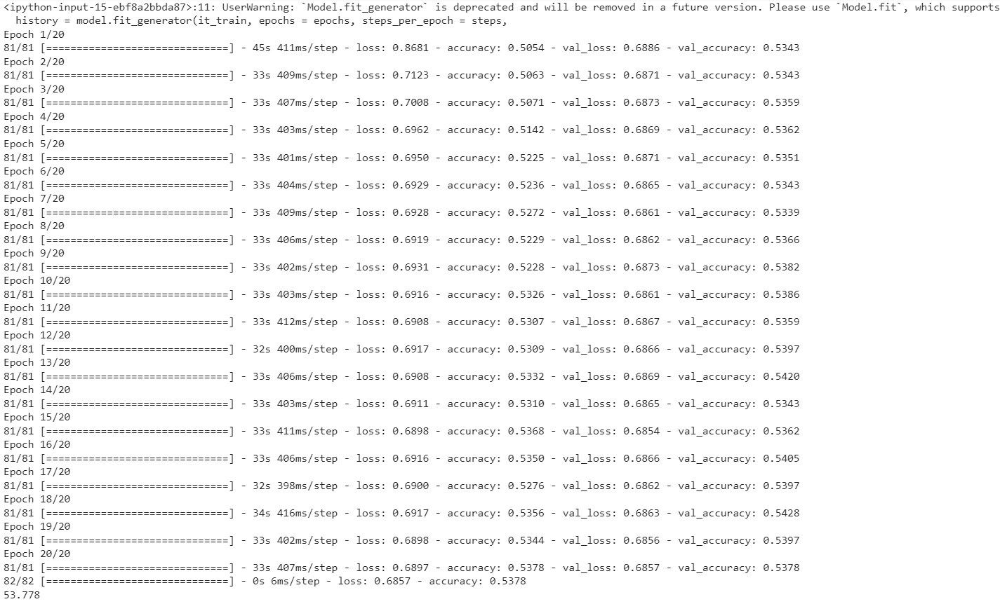

In [ ]:
def plot_accuracy(history):
  plt.figure(figsize = (10,6))
  plt.plot(history.history['accuracy'], color = 'blue', label = 'train')
  plt.plot(history.history['val_accuracy'], color = 'orange', label = 'val')
  plt.legend()
  plt.title('Accuracy')
  plt.show()

In [ ]:
plot_accuracy(train_history)

Added image from personal notebook due to long run times

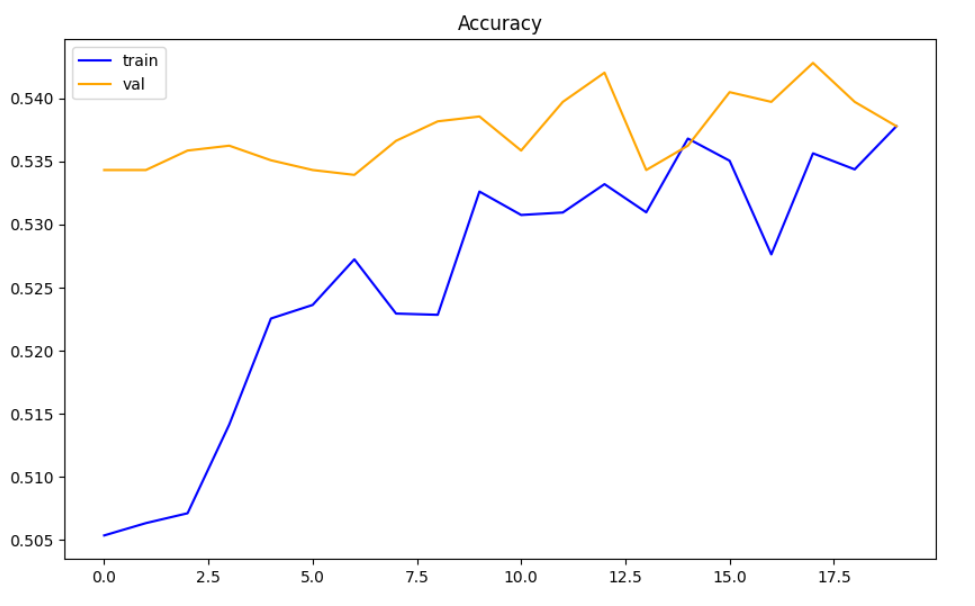

In [ ]:
def plot_loss(history):
  plt.figure(figsize = (10,6))
  plt.plot(history.history['loss'], color = 'blue', label = 'train')
  plt.plot(history.history['val_loss'], color = 'orange', label = 'val')
  plt.legend()
  plt.title('AlexNet')
  plt.show()

In [ ]:
plot_loss(train_history)

Added image from personal notebook due to long run times

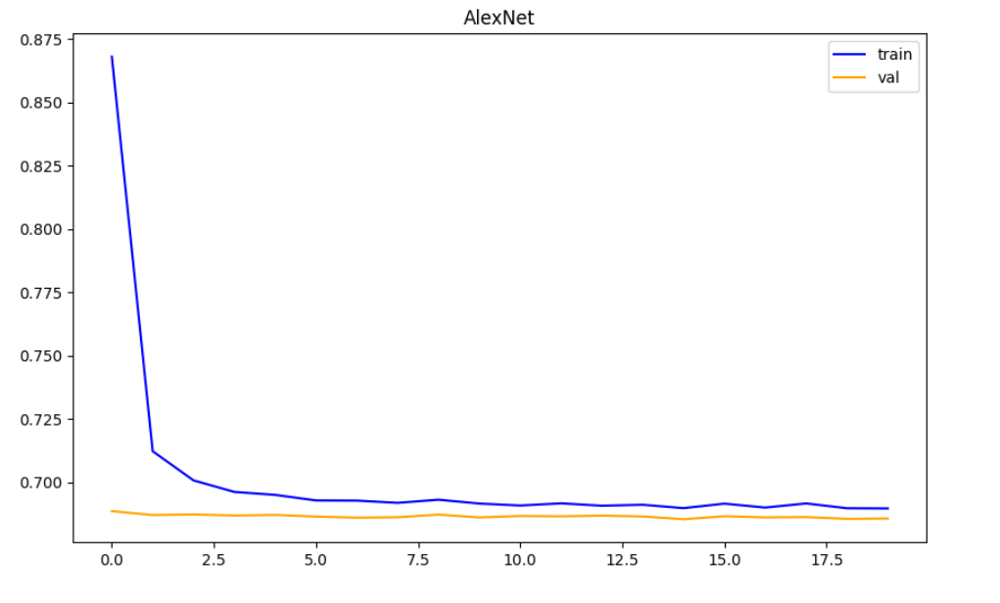

##3.11.6 Results and Discussion
We implemented the Alexnet via Keras to fit our own data model. This was applied by reshaping our train and test values to fit for classification. To gain familiarity during this phase, the testing was done without prior preprocessing steps. Upon initial testing, the loss values were printed as “nan”. After implementing a smaller learning rate size, it is believed the large value was causing the loss to diverge. 
Overall, the results from the implementation of this model with 20 epochs received a highest test accuracy of 54.28% and loss of 0.6857. Since this model has numerous parameters, it is very likely there is overfitting. 

In phase 4, I believe this model can achieve optimal results through applying data augmentation steps like crop and rotation we did in phase 2. I would also like to test different optimizers, learning rates, and a larger set of epochs. 


#3.12 Conclusion
In conclusion, our project focuses on developing optimal cat and dog image detection machine learning techniques. Our goal is to improve accuracy in both our classification and regression models through implementing various preprocessing methods and creating neural networks. We created a PyTorch implementation of Multi-Layer Perceptron (MLP) regression and classification neural networks along with Alexnet framework adoption that is known to be one of the most efficient models for image detection. The best model for MLP Pytorch regression had an MSE of 0.01 and used an adam optimizer, small batches (96 for training, 32 for test), and no regularization. The CNN for classification after 20 epochs with SGD optimizer had testing accuracy 55.55%. For Alexnet, the best results yielded a test accuracy of 54.28%, train accuracy of 53.78% and their respective losses of 0.6863 and 0.6897. We found out that our best classification model using SGD optimizer gave the best train accuracy for 57% and the best test accuracy for almost 57%.


#Bibliography


*Note: Any other reference might be within cell blocks along wide code.

https://medium.com/artificialis/multi-task-deep-learning-with-pytorch-8bf0787ce0e0

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html

sklearn.linear_model.LinearRegression — scikit-learn 1.2.2 documentation (taken from phase 2 starter notebook)

GCP on Colab:
https://medium.com/@senthilnathangautham/colab-gcp-compute-how-to-link-them-together-98747e8d940e

Colab Creation of a custom VM
https://storage.googleapis.com/openimages/web/download.html
https://research.google.com/colaboratory/marketplace.html

Latex equations in Markdown:
https://codesolid.com/using-latex-in-python/

Data Augmentation:
https://www.analyticsvidhya.com/blog/2019/08/3-techniques-extract-features-from-image-data-machine-learning-python/
https://towardsdatascience.com/data-augmentation-techniques-in-python-f216ef5eed69

Sklearn BaseEstimator/TransformerMixin:
https://www.section.io/engineering-education/custom-transformer/
https://towardsdatascience.com/creating-custom-transformers-using-scikit-learn-5f9db7d7fdb5
https://towardsdatascience.com/writing-your-own-scikit-learn-classes-for-beginners-1e4e7d4de203
https://scikit-learn.org/stable/modules/generated/sklearn.base.BaseEstimator.html
https://scikit-learn.org/stable/modules/generated/sklearn.base.TransformerMixin.html#sklearn.base.TransformerMixin


Feature Engineering with Hog Transformer:
https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html
https://www.analyticsvidhya.com/blog/2019/09/feature-engineering-images-introduction-hog-feature-descriptor/
https://www.analyticsvidhya.com/blog/2019/09/9-powerful-tricks-for-working-image-data-skimage-python/

https://kapernikov.com/tutorial-image-classification-with-scikit-learn/
https://www.thepythoncode.com/article/hog-feature-extraction-in-python
https://www.mathworks.com/help/matlab/creating_plots/image-types.html

Principal Component Analysis:
https://medium.com/data-science-365/principal-component-analysis-pca-with-scikit-learn-1e84a0c731b0
https://www.datacamp.com/tutorial/principal-component-analysis-in-python
https://www.mikulskibartosz.name/pca-how-to-choose-the-number-of-components/
https://towardsdatascience.com/machine-learning-step-by-step-6fbde95c455a

Computations:
Lab 4: Linear Regression
Lab 6: Probability Theory Naive Bayes
Lab 7: Logistic Regression Iris

AlexNet:
https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf

https://towardsdatascience.com/alexnet-the-architecture-that-challenged-cnns-e406d5297951


# Sources (MLP)

- https://pytorch.org/vision/stable/transforms.html
- https://www.geeksforgeeks.org/how-to-convert-an-image-to-grayscale-in-pytorch/
- https://www.geeksforgeeks.org/how-to-rotate-an-image-by-an-angle-using-pytorch-in-python/
- https://www.geeksforgeeks.org/python-pytorch-randomhorizontalflip-function/
- https://medium.com/mlearning-ai/understanding-torchvision-functionalities-for-pytorch-part-2-transforms-886b60d5c23a
- https://pytorch.org/vision/stable/transforms.html#torchvision.transforms.functional.adjust_gamma
- https://pillow.readthedocs.io/en/stable/reference/Image.html
- https://sparrow.dev/torchvision-transforms/
- https://discuss.pytorch.org/t/convert-float-image-array-to-int-in-pil-via-image-fromarray/82167
- https://pytorch.org/tutorials/beginner/basics/data_tutorial.html
- https://colab.research.google.com/drive/1vVyUUN0HN1l-KMXHSlkNK7PGgzEeDkZn#scrollTo=jRqKe4PNognL
- https://www.geeksforgeeks.org/how-to-set-up-and-run-cuda-operations-in-pytorch/
- https://www.analyticsvidhya.com/blog/2020/12/mlp-multilayer-perceptron-simple-overview/
- https://www.educba.com/pytorch-softmax/
- https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
- https://en.wikipedia.org/wiki/Softmax_function
- https://pytorch.org/docs/stable/generated/torch.cat.html
- https://pytorch.org/docs/stable/generated/torch.nn.ReLU.html
- https://www.educba.com/pytorch-relu/
- https://github.com/szagoruyko/pytorchviz
- https://manisha-sirsat.blogspot.com/2019/04/confusion-matrix.html
- https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html
- https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
- https://pytorch.org/docs/stable/generated/torch.cat.html
- https://www.projectpro.io/article/exploring-mnist-dataset-using-pytorch-to-train-an-mlp/408
- https://medium.com/unpackai/stay-away-from-overfitting-l2-norm-regularization-weight-decay-and-l1-norm-regularization-795bbc5cf958
- https://stackoverflow.com/questions/1557571/how-do-i-get-time-of-a-python-programs-execution
- https://stackoverflow.com/questions/71960632/how-to-rotate-a-rectangle-bounding-box-together-with-an-image
- https://www.analyticsvidhya.com/blog/2019/10/building-image-classification-models-cnn-pytorch/
- https://blog.paperspace.com/writing-cnns-from-scratch-in-pytorch/
- https://blog.paperspace.com/object-localization-using-pytorch-1/
- https://blog.paperspace.com/object-localization-pytorch-2/
- https://www.analyticsvidhya.com/blog/2019/10/building-image-classification-models-cnn-pytorch/
- https://pyimagesearch.com/2021/07/19/pytorch-training-your-first-convolutional-neural-network-cnn/
